In [1]:
import os
import time
import rasterio
import numpy as np
import pandas as pd
import xarray as xr
import seaborn as sns
import datetime as dt
import rioxarray as rxr
import geopandas as gpd
import matplotlib.pyplot as plt
from scipy.stats import kendalltau
from scipy import stats, interpolate
from pandas import date_range, to_datetime
import dask
import logging
import dask.array as da
from joblib import Parallel, delayed
from dask import config as dask_config
from dask.diagnostics import ProgressBar
import warnings
# from helper_functions import * # Helper functions
from statsmodels.distributions.empirical_distribution import ECDF
from copulae import GaussianCopula, ClaytonCopula, FrankCopula, GumbelCopula, StudentCopula # Using Copulae Module

In [2]:
# Set dataset directory
dataset = '../../../datasets/'
output_dir = '../../datasets/results'

In [4]:
variables = xr.open_dataset(os.path.join(dataset, 'daily_dataset'), chunks={'time': 500, 'y': 175, 'x': 148})

In [12]:
variables_chunk = xr.open_dataset(os.path.join(dataset, 'daily_dataset'), chunks={'time': 500, 'y': 175, 'x': 148})

In [3]:
variables = xr.open_dataset(os.path.join(dataset, 'daily_dataset_combined'), chunks={'time': 500, 'y': 175, 'x': 148})

In [114]:
spei =  xr.open_dataset(os.path.join(dataset, 'validation_datasets/spei03.nc'))

In [4]:
print(variables)

<xarray.Dataset>
Dimensions:        (x: 591, y: 698, time: 7671)
Coordinates:
    band           int64 ...
  * x              (x) float64 21.88 21.93 21.98 22.03 ... 51.28 51.33 51.38
  * y              (y) float64 23.12 23.07 23.02 22.97 ... -11.63 -11.68 -11.73
  * time           (time) datetime64[ns] 2004-01-01 2004-01-02 ... 2024-12-31
    spatial_ref    int64 ...
    lat            (y) float64 dask.array<chunksize=(175,), meta=np.ndarray>
    lon            (x) float64 dask.array<chunksize=(148,), meta=np.ndarray>
Data variables:
    precipitation  (time, y, x) float32 dask.array<chunksize=(500, 175, 148), meta=np.ndarray>
    et             (time, y, x) float64 dask.array<chunksize=(500, 175, 148), meta=np.ndarray>
    tws            (time, y, x) float64 dask.array<chunksize=(500, 175, 148), meta=np.ndarray>
    p_ema120       (time, y, x) float32 dask.array<chunksize=(500, 175, 148), meta=np.ndarray>
    et_ema120      (time, y, x) float64 dask.array<chunksize=(500, 175, 148), m

In [5]:
start = time.time()
variable = variables.copy()
variable = variable.p_ema120 - variable.et_ema120

end = time.time()
print(f"Stacking done in {end - start:.2f} seconds.")

Stacking done in 0.02 seconds.


In [54]:
# Set up logging
logging.basicConfig(level=logging.INFO, format='%(asctime)s - %(levelname)s - %(message)s')

# Define custom EMA function compatible with dask
def compute_ema_dask(da, span, dim='time'):
    """
    Compute exponential moving average along a dimension using dask.
    
    Parameters:
    - da: xarray.DataArray to compute EMA on
    - span: EMA span (e.g., 60, 90, 120 days)
    - dim: Dimension along which to compute EMA (default: 'time')
    
    Returns:
    - xarray.DataArray with EMA values
    """
    logging.info(f"Computing EMA for span {span} along dimension {dim}")
    
    # Calculate alpha for EMA
    alpha = 2 / (span + 1)
    
    # Define EMA computation for a single 1D array
    def ema_1d(arr, alpha):
        result = np.empty_like(arr)
        result[0] = arr[0]  # Initialize with first value
        for t in range(1, len(arr)):
            result[t] = alpha * arr[t] + (1 - alpha) * result[t-1]
        return result
    
    # Ensure input is chunked
    da = da.chunk(da.chunks)
    
    try:
        # Apply EMA using apply_ufunc with allow_rechunk
        ema = xr.apply_ufunc(
            ema_1d,
            da,
            input_core_dims=[[dim]],
            output_core_dims=[[dim]],
            vectorize=True,
            dask='parallelized',
            output_dtypes=[da.dtype],
            dask_gufunc_kwargs={'allow_rechunk': True},
            kwargs={'alpha': alpha}
        )
        return ema
    except Exception as e:
        logging.error(f"Error computing EMA: {str(e)}")
        raise

# Function to process a subregion and compute EMAs
def compute_emas_for_subregion(ds, subregion_id, spans=[60, 90, 120], output_dir="ema_outputs"):
    """
    Compute EMAs for precipitation, et, and tws for a given subregion.
    
    Parameters:
    - ds: xarray.Dataset with precipitation, et, tws
    - subregion_id: Integer ID of the subregion
    - spans: List of EMA spans (days)
    - output_dir: Directory to save NetCDF files
    """
    logging.info(f"Starting EMA computation for subregion {subregion_id}")
    
    # Ensure output directory exists
    os.makedirs(output_dir, exist_ok=True)
    
    # Optimize chunk sizes
    ds = ds.chunk({'time': 1000, 'y': 100, 'x': 50})
    
    # Dictionary to store EMA results for each span
    ema_datasets = {}
    
    for span in spans:
        logging.info(f"Computing EMA for subregion {subregion_id}, span {span} days")
        
        # Apply EMA to each variable
        try:
            precip_ema = compute_ema_dask(ds['precipitation'], span)
            et_ema = compute_ema_dask(ds['et'], span)
            tws_ema = compute_ema_dask(ds['tws'], span)
            
            # Create a new dataset for this span
            ema_ds = xr.Dataset(
                {
                    'precipitation_ema': precip_ema,
                    'et_ema': et_ema,
                    'tws_ema': tws_ema
                },
                coords=ds.coords
            )
            
            # Persist to optimize memory
            ema_ds = ema_ds.persist()
            
            # Save to NetCDF
            output_path = os.path.join(output_dir, f"subregion_{subregion_id}_ema_span_{span}.nc")
            ema_ds.to_netcdf(output_path, compute=True)
            logging.info(f"Saved EMA results to {output_path}")
            
            # Store in dictionary
            ema_datasets[span] = ema_ds
            
        except Exception as e:
            logging.error(f"Error processing span {span} for subregion {subregion_id}: {str(e)}")
            raise
    
    return ema_datasets

# Function to process all subregions
def process_all_subregions(subregion_datasets, output_dir="ema_outputs"):
    """
    Process all subregions and compute EMAs.
    
    Parameters:
    - subregion_datasets: Dict or list of datasets for each subregion
    - output_dir: Directory to save NetCDF files
    """
    for subregion_id, ds in subregion_datasets.items():
        logging.info(f"Processing subregion {subregion_id}")
        ema_datasets = compute_emas_for_subregion(ds, subregion_id, spans=[60, 90, 120], output_dir=output_dir)
        logging.info(f"Completed subregion {subregion_id}")


In [55]:
# Process all subregions
with dask.config.set({"array.slicing.split_large_chunks": False}):
        process_all_subregions(subregion_datasets, output_dir="ema_outputs")

2025-04-23 19:55:44,675 - INFO - Processing subregion 1
2025-04-23 19:55:44,677 - INFO - Starting EMA computation for subregion 1
2025-04-23 19:55:44,744 - INFO - Computing EMA for subregion 1, span 60 days
2025-04-23 19:55:44,745 - INFO - Computing EMA for span 60 along dimension time
2025-04-23 19:55:44,752 - INFO - Computing EMA for span 60 along dimension time
2025-04-23 19:55:44,757 - INFO - Computing EMA for span 60 along dimension time

KeyboardInterrupt



In [6]:
variables['pet'] = variable

In [7]:
print(variables)

<xarray.Dataset>
Dimensions:        (x: 591, y: 698, time: 7671)
Coordinates:
    band           int64 ...
  * x              (x) float64 21.88 21.93 21.98 22.03 ... 51.28 51.33 51.38
  * y              (y) float64 23.12 23.07 23.02 22.97 ... -11.63 -11.68 -11.73
  * time           (time) datetime64[ns] 2004-01-01 2004-01-02 ... 2024-12-31
    spatial_ref    int64 ...
    lat            (y) float64 dask.array<chunksize=(175,), meta=np.ndarray>
    lon            (x) float64 dask.array<chunksize=(148,), meta=np.ndarray>
Data variables:
    precipitation  (time, y, x) float32 dask.array<chunksize=(500, 175, 148), meta=np.ndarray>
    et             (time, y, x) float64 dask.array<chunksize=(500, 175, 148), meta=np.ndarray>
    tws            (time, y, x) float64 dask.array<chunksize=(500, 175, 148), meta=np.ndarray>
    p_ema120       (time, y, x) float32 dask.array<chunksize=(500, 175, 148), meta=np.ndarray>
    et_ema120      (time, y, x) float64 dask.array<chunksize=(500, 175, 148), m

In [5]:
landform_classes = np.unique(variables.landform)
landform_2d = variables.landform.squeeze()
# Assuming landform_2d is at 5 km resolution
for class_value in landform_classes:
    if np.isnan(class_value):
        continue
    mask = landform_2d == class_value
    n_pixels = mask.compute().sum().item()  # Number of True values (valid pixels)
    print(f"Class {class_value}: {n_pixels} pixels")

Class 1.0: 12910 pixels
Class 2.0: 59445 pixels
Class 3.0: 67984 pixels
Class 4.0: 20408 pixels
Class 5.0: 17019 pixels
Class 6.0: 5569 pixels
Class 7.0: 6771 pixels
Class 8.0: 13514 pixels
Class 9.0: 2475 pixels


In [6]:
# Dictionary to store subregion datasets
subregion_datasets = {}

# Loop through each subregion
for subregion_id in landform_classes[:4]:
    if np.isnan(subregion_id): 
        continue
    # Mask the combined dataset where landform matches the subregion ID
    subregion_mask = variables['landform'] == subregion_id
    subregion_ds = variables.where(subregion_mask, drop=True)
    print(f"Completed subregion {int(subregion_id)} ")
    subregion_datasets[int(subregion_id)] = subregion_ds

# Example: Access subregion 1
print("Subregion 1 dataset:")
print(subregion_datasets[1])

Completed subregion 1 
Completed subregion 2 
Completed subregion 3 
Completed subregion 4 
Subregion 1 dataset:
<xarray.Dataset>
Dimensions:        (time: 7671, y: 671, x: 337)
Coordinates:
    band           int64 1
  * x              (x) float64 30.33 30.38 30.48 30.53 ... 51.28 51.33 51.38
  * y              (y) float64 23.12 23.07 23.02 22.97 ... -11.28 -11.33 -11.38
  * time           (time) datetime64[ns] 2004-01-01 2004-01-02 ... 2024-12-31
    spatial_ref    int64 0
    lat            (y) float64 dask.array<chunksize=(172,), meta=np.ndarray>
    lon            (x) float64 dask.array<chunksize=(44,), meta=np.ndarray>
Data variables:
    precipitation  (time, y, x) float32 dask.array<chunksize=(500, 172, 44), meta=np.ndarray>
    et             (time, y, x) float64 dask.array<chunksize=(500, 172, 44), meta=np.ndarray>
    tws            (time, y, x) float64 dask.array<chunksize=(500, 172, 44), meta=np.ndarray>
    p_ema120       (time, y, x) float32 dask.array<chunksize=(500, 17

In [51]:
print(subregion_datasets[1].chunk({'time':1000}))

<xarray.Dataset>
Dimensions:        (time: 7671, y: 671, x: 337)
Coordinates:
    band           int64 1
  * x              (x) float64 30.33 30.38 30.48 30.53 ... 51.28 51.33 51.38
  * y              (y) float64 23.12 23.07 23.02 22.97 ... -11.28 -11.33 -11.38
  * time           (time) datetime64[ns] 2004-01-01 2004-01-02 ... 2024-12-31
    spatial_ref    int64 0
    lat            (y) float64 dask.array<chunksize=(172,), meta=np.ndarray>
    lon            (x) float64 dask.array<chunksize=(44,), meta=np.ndarray>
Data variables:
    precipitation  (time, y, x) float32 dask.array<chunksize=(1000, 172, 44), meta=np.ndarray>
    et             (time, y, x) float64 dask.array<chunksize=(1000, 172, 44), meta=np.ndarray>
    tws            (time, y, x) float64 dask.array<chunksize=(1000, 172, 44), meta=np.ndarray>
    p_ema120       (time, y, x) float32 dask.array<chunksize=(1000, 172, 44), meta=np.ndarray>
    et_ema120      (time, y, x) float64 dask.array<chunksize=(1000, 172, 44), meta=n

In [14]:
# Process subregions and combine into one dataset
start = time.time()
landform_classes = np.unique(variables['landform'].values[~np.isnan(variables['landform'].values)])
print('Extracted Landform classes')
subregion_list = []
with dask.config.set(**{'array.slicing.split_large_chunks': False}):
    for subregion_id in landform_classes[:3]:
        if np.isnan(subregion_id):
            continue
        print(f"Processing subregion {subregion_id}...")

        # Extract subregion
        mask = variables['landform'] == subregion_id
        subregion_ds = variables.where(mask, drop=True)

        # Stack spatial dimensions
        stacked_ds = subregion_ds.stack(space=['y', 'x'])


        # Add subregion coordinate
        stacked_ds = stacked_ds.assign_coords(subregion=int(subregion_id)).expand_dims('subregion')
        subregion_list.append(stacked_ds)

# Combine all subregions into one dataset
all_subregions_ds= xr.concat(subregion_list, dim='subregion')

# Inspect combined dataset
print("Combined subregions dataset:")
print(all_subregions_ds)
end = time.time()

print(f'Duration: {end  - start:2f} seconds')

Extracted Landform classes
Processing subregion 1.0...
Processing subregion 2.0...
Processing subregion 3.0...


/home/jovyan/.local/lib/python3.8/site-packages/dask/array/core.py:4832: PerformanceWarning: Increasing number of chunks by factor of 12
  result = blockwise(
/home/jovyan/.local/lib/python3.8/site-packages/dask/array/core.py:4832: PerformanceWarning: Increasing number of chunks by factor of 12
  result = blockwise(
/home/jovyan/.local/lib/python3.8/site-packages/dask/array/core.py:4832: PerformanceWarning: Increasing number of chunks by factor of 12
  result = blockwise(
/home/jovyan/.local/lib/python3.8/site-packages/dask/array/core.py:4832: PerformanceWarning: Increasing number of chunks by factor of 12
  result = blockwise(
/home/jovyan/.local/lib/python3.8/site-packages/dask/array/core.py:4832: PerformanceWarning: Increasing number of chunks by factor of 12
  result = blockwise(
/home/jovyan/.local/lib/python3.8/site-packages/dask/array/core.py:4832: PerformanceWarning: Increasing number of chunks by factor of 16
  result = blockwise(
/home/jovyan/.local/lib/python3.8/site-package

Combined subregions dataset:
<xarray.Dataset>
Dimensions:        (time: 7671, space: 410198, subregion: 3)
Coordinates:
  * time           (time) datetime64[ns] 2004-01-01 2004-01-02 ... 2024-12-31
  * space          (space) object MultiIndex
  * y              (space) float64 -11.73 -11.73 -11.73 ... 23.12 23.12 23.12
  * x              (space) float64 23.28 23.33 23.38 23.43 ... 51.28 51.33 51.38
  * subregion      (subregion) int64 1 2 3
    band           int64 1
    spatial_ref    int64 0
    lat            (subregion, space) float64 dask.array<chunksize=(1, 101919), meta=np.ndarray>
    lon            (subregion, space) float64 dask.array<chunksize=(1, 103099), meta=np.ndarray>
Data variables:
    precipitation  (subregion, time, space) float32 dask.array<chunksize=(1, 500, 25269), meta=np.ndarray>
    et             (subregion, time, space) float64 dask.array<chunksize=(1, 500, 25269), meta=np.ndarray>
    tws            (subregion, time, space) float64 dask.array<chunksize=(1, 

#### Zone 1 P-ET analysis

In [15]:
zone_1 = all_subregions_ds.isel(subregion=0)

In [16]:
print(zone_1)

<xarray.Dataset>
Dimensions:        (time: 7671, space: 410198)
Coordinates:
  * time           (time) datetime64[ns] 2004-01-01 2004-01-02 ... 2024-12-31
  * space          (space) object MultiIndex
  * y              (space) float64 -11.73 -11.73 -11.73 ... 23.12 23.12 23.12
  * x              (space) float64 23.28 23.33 23.38 23.43 ... 51.28 51.33 51.38
    subregion      int64 1
    band           int64 1
    spatial_ref    int64 0
    lat            (space) float64 dask.array<chunksize=(101919,), meta=np.ndarray>
    lon            (space) float64 dask.array<chunksize=(103099,), meta=np.ndarray>
Data variables:
    precipitation  (time, space) float32 dask.array<chunksize=(500, 25269), meta=np.ndarray>
    et             (time, space) float64 dask.array<chunksize=(500, 25269), meta=np.ndarray>
    tws            (time, space) float64 dask.array<chunksize=(500, 25269), meta=np.ndarray>
    p_ema120       (time, space) float32 dask.array<chunksize=(500, 25269), meta=np.ndarray>
    

In [11]:
# Define EMA with rolling_exp
def apply_ema(da, span):
    return da.rolling_exp(time=span, window_type="span").mean()

In [17]:
p60 = apply_ema(zone_1.precipitation.compute(), 60)

In [21]:
p60

<xarray.DataArray 'precipitation' (time: 7671, space: 410198)>
array([[nan, nan, nan, ..., nan, nan, nan],
       [nan, nan, nan, ..., nan, nan, nan],
       [nan, nan, nan, ..., nan, nan, nan],
       ...,
       [nan, nan, nan, ..., nan, nan, nan],
       [nan, nan, nan, ..., nan, nan, nan],
       [nan, nan, nan, ..., nan, nan, nan]], dtype=float32)
Coordinates:
  * time         (time) datetime64[ns] 2004-01-01 2004-01-02 ... 2024-12-31
  * space        (space) object MultiIndex
  * y            (space) float64 -11.73 -11.73 -11.73 ... 23.12 23.12 23.12
  * x            (space) float64 23.28 23.33 23.38 23.43 ... 51.28 51.33 51.38
    subregion    int64 1
    band         int64 1
    spatial_ref  int64 0
    lat          (space) float64 nan nan nan nan nan ... 23.12 23.12 23.12 23.12
    lon          (space) float64 nan nan nan nan nan ... 51.18 51.28 51.33 51.38
Attributes:
    AREA_OR_POINT:             Area
    TIFFTAG_DATETIME:          2015:09:01 17:11:33
    TIFFTAG_DOCUMENTNAME:      /home/sandbox/chirps/v2.0/daily_downscaled_by_...
    TIFFTAG_IMAGEDESCRIPTION:  IDL TIFF file
    TIFFTAG_RESOLUTIONUNIT:    2 (pixels/inch)
    TIFFTAG_SOFTWARE:          IDL 8.5, Exelis Visual Information Solutions, ...
    TIFFTAG_XRESOLUTION:       100
    TIFFTAG_YRESOLUTION:       100
    units:                     mm
    grid_mapping:              spatial_ref

In [20]:
h = (p60, chunks={'time': 500, 'y': 175, 'x': 148})

SyntaxError: invalid syntax (1737669243.py, line 1)

In [23]:
start = time.time()
for var in ['precipitation', 'et']:
    print(f'Applying EMA to {var} ...')
    ema = apply_ema(zone_1[var].compute(), 60)
    zone_1[var+'_60'] = ema
end = time.time()
print(f'Completed the EMA process in {end - start:2f} seconds')

Applying EMA to precipitation ...
Applying EMA to et ...
Completed the EMA process in 813.802837 seconds


In [26]:
print(zone_1['et_60'].chunks)

((500, 500, 500, 500, 500, 500, 500, 500, 500, 500, 500, 500, 500, 500, 500, 171), (25269, 2332, 9609, 12249, 2922, 16689, 8076, 618, 24155, 28, 141, 26971, 28, 7811, 17531, 28, 16661, 8681, 28, 25342, 28, 141, 26971, 28, 4861, 20397, 28, 19007, 6321, 28, 25335, 28, 141, 24611, 1208, 8401, 15171, 1208, 17251, 6307, 1208, 26350))


In [27]:
zone_1

<xarray.Dataset>
Dimensions:           (time: 7671, space: 410198)
Coordinates:
  * time              (time) datetime64[ns] 2004-01-01 2004-01-02 ... 2024-12-31
  * space             (space) object MultiIndex
  * y                 (space) float64 -11.73 -11.73 -11.73 ... 23.12 23.12 23.12
  * x                 (space) float64 23.28 23.33 23.38 ... 51.28 51.33 51.38
    subregion         int64 1
    band              int64 1
    spatial_ref       int64 0
    lat               (space) float64 dask.array<chunksize=(101919,), meta=np.ndarray>
    lon               (space) float64 dask.array<chunksize=(103099,), meta=np.ndarray>
Data variables:
    precipitation     (time, space) float32 dask.array<chunksize=(500, 25269), meta=np.ndarray>
    et                (time, space) float64 dask.array<chunksize=(500, 25269), meta=np.ndarray>
    tws               (time, space) float64 dask.array<chunksize=(500, 25269), meta=np.ndarray>
    p_ema120          (time, space) float32 dask.array<chunksize=(500, 25269), meta=np.ndarray>
    et_ema120         (time, space) float64 dask.array<chunksize=(500, 25269), meta=np.ndarray>
    landform          (space) float64 dask.array<chunksize=(25269,), meta=np.ndarray>
    precipitation_60  (time, space) float32 dask.array<chunksize=(500, 25269), meta=xarray.core.dataarray.DataArray>
    et_60             (time, space) float64 dask.array<chunksize=(500, 25269), meta=xarray.core.dataarray.DataArray>

In [25]:
start = time.time()
for var in ['precipitation', 'et']:
    print(f'Applying EMA to {var} ...')
    # Compute EMA (results in a NumPy array)
    ema = apply_ema(zone_1[var].compute(), 60)
    # Convert back to a Dask array with the same chunking as the original
    ema_dask = da.from_array(ema, chunks=zone_1[var].chunks)
    # Wrap in xarray DataArray with the same coordinates
    ema = xr.DataArray(ema_dask, coords=zone_1[var].coords, dims=zone_1[var].dims)
    zone_1[var + '_60'] = ema
end = time.time()
print(f'Completed the EMA process in {end - start:.2f} seconds')

# Verify chunking
print(f"Chunking of original precipitation: {zone_1['precipitation'].chunks}")
print(f"Chunking of precipitation_60: {zone_1['precipitation_60'].chunks}")

Applying EMA to precipitation ...
Applying EMA to et ...
Completed the EMA process in 183.67 seconds
Chunking of original precipitation: ((500, 500, 500, 500, 500, 500, 500, 500, 500, 500, 500, 500, 500, 500, 500, 171), (25269, 2332, 9609, 12249, 2922, 16689, 8076, 618, 24155, 28, 141, 26971, 28, 7811, 17531, 28, 16661, 8681, 28, 25342, 28, 141, 26971, 28, 4861, 20397, 28, 19007, 6321, 28, 25335, 28, 141, 24611, 1208, 8401, 15171, 1208, 17251, 6307, 1208, 26350))
Chunking of precipitation_60: ((500, 500, 500, 500, 500, 500, 500, 500, 500, 500, 500, 500, 500, 500, 500, 171), (25269, 2332, 9609, 12249, 2922, 16689, 8076, 618, 24155, 28, 141, 26971, 28, 7811, 17531, 28, 16661, 8681, 28, 25342, 28, 141, 26971, 28, 4861, 20397, 28, 19007, 6321, 28, 25335, 28, 141, 24611, 1208, 8401, 15171, 1208, 17251, 6307, 1208, 26350))


In [42]:
start = time.time()
for var in ['precipitation', 'et']:
    print(f'Applying EMA to {var} ...')
    # Compute EMA (results in a NumPy array)
    ema = apply_ema(zone_1[var].compute(), 90)
    # Convert back to a Dask array with the same chunking as the original
    ema_dask = da.from_array(ema, chunks=zone_1[var].chunks)
    # Wrap in xarray DataArray with the same coordinates
    ema = xr.DataArray(ema_dask, coords=zone_1[var].coords, dims=zone_1[var].dims)
    zone_1[var + '_90'] = ema
end = time.time()
print(f'Completed the EMA process in {end - start:.2f} seconds')

Applying EMA to precipitation ...
Applying EMA to et ...
Completed the EMA process in 236.79 seconds


In [29]:
start = time.time()
for var in ['precipitation', 'et']:
    print(f'Applying EMA to {var} ...')
    # Compute EMA (results in a NumPy array)
    ema = apply_ema(zone_1[var].compute(), 120)
    # Convert back to a Dask array with the same chunking as the original
    ema_dask = da.from_array(ema, chunks=zone_1[var].chunks)
    # Wrap in xarray DataArray with the same coordinates
    ema = xr.DataArray(ema_dask, coords=zone_1[var].coords, dims=zone_1[var].dims)
    zone_1[var + '_12'] = ema
end = time.time()
print(f'Completed the EMA process in {end - start:.2f} seconds')

# Verify chunking
print(f"Chunking of original precipitation: {zone_1['precipitation'].chunks}")
print(f"Chunking of precipitation_60: {zone_1['precipitation_60'].chunks}")

Applying EMA to precipitation ...
Applying EMA to et ...
Completed the EMA process in 172.28 seconds
Chunking of original precipitation: ((500, 500, 500, 500, 500, 500, 500, 500, 500, 500, 500, 500, 500, 500, 500, 171), (25269, 2332, 9609, 12249, 2922, 16689, 8076, 618, 24155, 28, 141, 26971, 28, 7811, 17531, 28, 16661, 8681, 28, 25342, 28, 141, 26971, 28, 4861, 20397, 28, 19007, 6321, 28, 25335, 28, 141, 24611, 1208, 8401, 15171, 1208, 17251, 6307, 1208, 26350))
Chunking of precipitation_60: ((500, 500, 500, 500, 500, 500, 500, 500, 500, 500, 500, 500, 500, 500, 500, 171), (25269, 2332, 9609, 12249, 2922, 16689, 8076, 618, 24155, 28, 141, 26971, 28, 7811, 17531, 28, 16661, 8681, 28, 25342, 28, 141, 26971, 28, 4861, 20397, 28, 19007, 6321, 28, 25335, 28, 141, 24611, 1208, 8401, 15171, 1208, 17251, 6307, 1208, 26350))


In [43]:
zone_1

<xarray.Dataset>
Dimensions:           (time: 7671, space: 410198)
Coordinates:
  * time              (time) datetime64[ns] 2004-01-01 2004-01-02 ... 2024-12-31
  * space             (space) object MultiIndex
  * y                 (space) float64 -11.73 -11.73 -11.73 ... 23.12 23.12 23.12
  * x                 (space) float64 23.28 23.33 23.38 ... 51.28 51.33 51.38
    subregion         int64 1
    band              int64 1
    spatial_ref       int64 0
    lat               (space) float64 dask.array<chunksize=(101919,), meta=np.ndarray>
    lon               (space) float64 dask.array<chunksize=(103099,), meta=np.ndarray>
Data variables:
    precipitation     (time, space) float32 dask.array<chunksize=(500, 25269), meta=np.ndarray>
    et                (time, space) float64 dask.array<chunksize=(500, 25269), meta=np.ndarray>
    tws               (time, space) float64 dask.array<chunksize=(500, 25269), meta=np.ndarray>
    p_ema120          (time, space) float32 dask.array<chunksize=(500, 25269), meta=np.ndarray>
    et_ema120         (time, space) float64 dask.array<chunksize=(500, 25269), meta=np.ndarray>
    landform          (space) float64 dask.array<chunksize=(25269,), meta=np.ndarray>
    precipitation_60  (time, space) float32 dask.array<chunksize=(500, 25269), meta=xarray.core.dataarray.DataArray>
    et_60             (time, space) float64 dask.array<chunksize=(500, 25269), meta=xarray.core.dataarray.DataArray>
    precipitation_12  (time, space) float32 dask.array<chunksize=(500, 25269), meta=xarray.core.dataarray.DataArray>
    et_12             (time, space) float64 dask.array<chunksize=(500, 25269), meta=xarray.core.dataarray.DataArray>
    precipitation_90  (time, space) float32 dask.array<chunksize=(500, 25269), meta=xarray.core.dataarray.DataArray>
    et_90             (time, space) float64 dask.array<chunksize=(500, 25269), meta=xarray.core.dataarray.DataArray>

#### Calculate P-ET

In [ ]:
vars = ['precipitation_60','precipitation_90', 'precipitation_12', 'et_60', 'et_12', 'et_90']

with ProgressBar():
    # 60
    pet60 = zone_1['precipitation_60'] - zone_1['et_60']
    
with ProgressBar():
    # 60
    pet90 = zone_1['precipitation_90'] - zone_1['et_90']

with ProgressBar():
    # 60
    pet120 = zone_1['precipitation_12'] - zone_1['et_12']

AssertionError: 

In [51]:
pet60 = zone_1.precipitation_60.compute() - zone_1.et_60.compute()

In [62]:
pet90 = zone_1.precipitation_90.compute() - zone_1.et_90.compute()

In [63]:
pet120 = zone_1.precipitation_12.compute() - zone_1.et_12.compute()

In [68]:
pet_dask = da.from_array(pet60, chunks=zone_1['et'].chunks)
    # Wrap in xarray DataArray with the same coordinates
p60 = xr.DataArray(pet_dask, coords=zone_1['et'].coords, dims=zone_1['et'].dims)
zone_1['pet_60'] = p60

In [69]:
pet_dask = da.from_array(pet90, chunks=zone_1['et'].chunks)
    # Wrap in xarray DataArray with the same coordinates
p90 = xr.DataArray(pet_dask, coords=zone_1['et'].coords, dims=zone_1['et'].dims)
zone_1['pet_90'] = p90

In [70]:
pet_dask = da.from_array(pet120, chunks=zone_1['et'].chunks)
    # Wrap in xarray DataArray with the same coordinates
p120 = xr.DataArray(pet_dask, coords=zone_1['et'].coords, dims=zone_1['et'].dims)
zone_1['pet_120'] = p120

In [72]:
zone_1

<xarray.Dataset>
Dimensions:              (time: 7671, space: 410198)
Coordinates:
  * time                 (time) datetime64[ns] 2004-01-01 ... 2024-12-31
  * space                (space) object MultiIndex
  * y                    (space) float64 -11.73 -11.73 -11.73 ... 23.12 23.12
  * x                    (space) float64 23.28 23.33 23.38 ... 51.28 51.33 51.38
    subregion            int64 1
    band                 int64 1
    spatial_ref          int64 0
    lat                  (space) float64 dask.array<chunksize=(101919,), meta=np.ndarray>
    lon                  (space) float64 dask.array<chunksize=(103099,), meta=np.ndarray>
Data variables: (12/16)
    precipitation        (time, space) float32 dask.array<chunksize=(500, 25269), meta=np.ndarray>
    et                   (time, space) float64 dask.array<chunksize=(500, 25269), meta=np.ndarray>
    tws                  (time, space) float64 dask.array<chunksize=(500, 25269), meta=np.ndarray>
    p_ema120             (time, space) float32 dask.array<chunksize=(500, 25269), meta=np.ndarray>
    et_ema120            (time, space) float64 dask.array<chunksize=(500, 25269), meta=np.ndarray>
    landform             (space) float64 dask.array<chunksize=(25269,), meta=np.ndarray>
    ...                   ...
    precipitation_90     (time, space) float32 dask.array<chunksize=(500, 25269), meta=xarray.core.dataarray.DataArray>
    et_90                (time, space) float64 dask.array<chunksize=(500, 25269), meta=xarray.core.dataarray.DataArray>
    precipitationpet_60  (time, space) float64 dask.array<chunksize=(500, 25269), meta=xarray.core.dataarray.DataArray>
    pet_60               (time, space) float64 dask.array<chunksize=(500, 25269), meta=xarray.core.dataarray.DataArray>
    pet_90               (time, space) float64 dask.array<chunksize=(500, 25269), meta=xarray.core.dataarray.DataArray>
    pet_120              (time, space) float64 dask.array<chunksize=(500, 25269), meta=xarray.core.dataarray.DataArray>

In [73]:
zone_1_unstacked = zone_1.unstack('space')

/home/jovyan/.local/lib/python3.8/site-packages/dask/array/core.py:4832: PerformanceWarning: Increasing number of chunks by factor of 16
  result = blockwise(
/home/jovyan/.local/lib/python3.8/site-packages/dask/array/core.py:4832: PerformanceWarning: Increasing number of chunks by factor of 16
  result = blockwise(
/home/jovyan/.local/lib/python3.8/site-packages/dask/array/core.py:4832: PerformanceWarning: Increasing number of chunks by factor of 16
  result = blockwise(
/home/jovyan/.local/lib/python3.8/site-packages/dask/array/core.py:4832: PerformanceWarning: Increasing number of chunks by factor of 16
  result = blockwise(
/home/jovyan/.local/lib/python3.8/site-packages/dask/array/core.py:4832: PerformanceWarning: Increasing number of chunks by factor of 16
  result = blockwise(
/home/jovyan/.local/lib/python3.8/site-packages/dask/array/core.py:4832: PerformanceWarning: Increasing number of chunks by factor of 16
  result = blockwise(
/home/jovyan/.local/lib/python3.8/site-package

In [ ]:
zone_1_unstacked

<xarray.Dataset>
Dimensions:              (y: 698, x: 590, time: 7671)
Coordinates:
  * y                    (y) float64 -11.73 -11.68 -11.63 ... 23.02 23.07 23.12
  * x                    (x) float64 21.88 21.93 21.98 ... 51.28 51.33 51.38
  * time                 (time) datetime64[ns] 2004-01-01 ... 2024-12-31
    subregion            int64 1
    band                 int64 1
    spatial_ref          int64 0
    lat                  (y, x) float64 dask.array<chunksize=(173, 590), meta=np.ndarray>
    lon                  (y, x) float64 dask.array<chunksize=(175, 590), meta=np.ndarray>
Data variables: (12/16)
    precipitation        (time, y, x) float32 dask.array<chunksize=(500, 43, 590), meta=np.ndarray>
    et                   (time, y, x) float64 dask.array<chunksize=(500, 43, 590), meta=np.ndarray>
    tws                  (time, y, x) float64 dask.array<chunksize=(500, 43, 590), meta=np.ndarray>
    p_ema120             (time, y, x) float32 dask.array<chunksize=(500, 43, 590), meta=np.ndarray>
    et_ema120            (time, y, x) float64 dask.array<chunksize=(500, 43, 590), meta=np.ndarray>
    landform             (y, x) float64 dask.array<chunksize=(43, 590), meta=np.ndarray>
    ...                   ...
    precipitation_90     (time, y, x) float32 dask.array<chunksize=(500, 43, 590), meta=np.ndarray>
    et_90                (time, y, x) float64 dask.array<chunksize=(500, 43, 590), meta=np.ndarray>
    precipitationpet_60  (time, y, x) float64 dask.array<chunksize=(500, 43, 590), meta=np.ndarray>
    pet_60               (time, y, x) float64 dask.array<chunksize=(500, 43, 590), meta=np.ndarray>
    pet_90               (time, y, x) float64 dask.array<chunksize=(500, 43, 590), meta=np.ndarray>
    pet_120              (time, y, x) float64 dask.array<chunksize=(500, 43, 590), meta=np.ndarray>

In [75]:
pet6h0 = zone_1_unstacked['precipitation_60'] - zone_1_unstacked['et_60']

In [82]:
plt.figure(figsize=(28, 6))
zone_1.pet_120.compute().sel(y=6.30, x=47.76, method='nearest').plot(label='P-ET', color='blue')

ValueError: multi-index does not support ``method`` and ``tolerance``

<Figure size 2800x600 with 0 Axes>

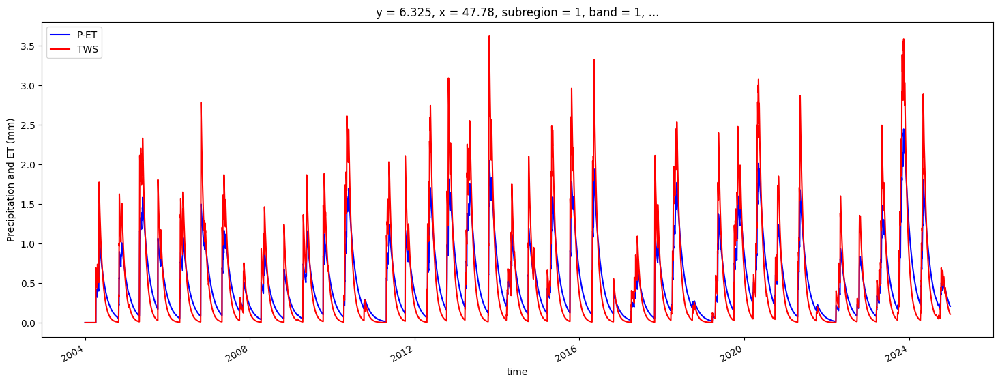

In [90]:
# Set up the figure
plt.figure(figsize=(18, 6))

# Create the first axis for ppt and et2.239800447168621, 44.209413834531375
ax1 = plt.gca()  # Get current axis
zone['p_ema120'].sel(y=6.30, x=47.76, method='nearest').plot(ax=ax1, label='P-ET', color='blue')
# zone_1_stacked['et'].sel(y=6.30, x=47.76, method='nearest').plot(ax=ax1, label='ET', color='green')
# zone_1_stacked['precipitation'].sel(y=6.30, x=47.76, method='nearest').plot(ax=ax1, label='Precipitation', color='yellow')
zone['precipitation_60'].sel(y=6.30, x=47.76, method='nearest').plot(ax=ax1, label='TWS', color='red')
# zone_1_stacked['et'].sel(y=0, x=40, method='nearest').plot(ax=ax1, label='ET', color='green')

# Customize the first axis
ax1.set_ylabel('Precipitation and ET (mm)')  # Assuming ppt and et are in mm
ax1.legend(loc='upper left')

# Create the second axis for tws
# ax2 = ax1.twinx()
# zone_1_stacked['tws'].sel(y=2.23, x=44.20, method='nearest').plot(ax=ax2, label='TWS', color='red')

# # Customize the second axis
# ax2.set_ylabel('TWS (unit)')  # Replace 'unit' with the actual unit of tws
# ax2.legend(loc='upper right')
# plt.ylim(-4, 8)
# Show the plot
plt.show()

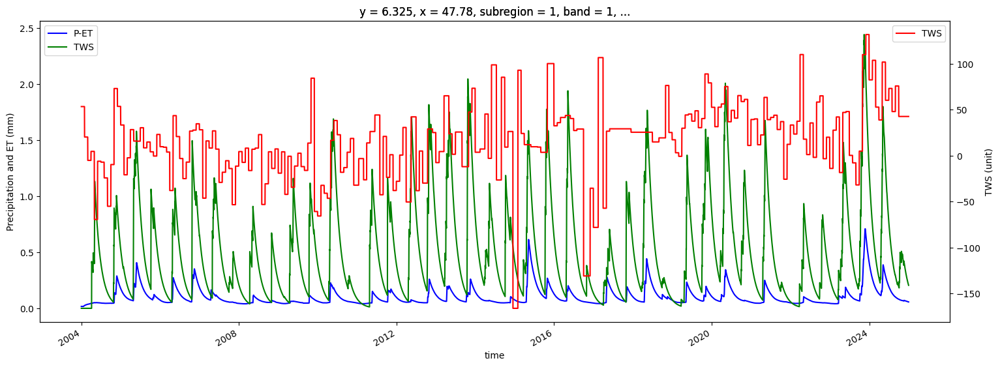

In [40]:
# Set up the figure
plt.figure(figsize=(18, 6))

# Create the first axis for ppt and et2.239800447168621, 44.209413834531375
ax1 = plt.gca()  # Get current axis
zone['et_12'].sel(y=6.30, x=47.76, method='nearest').plot(ax=ax1, label='P-ET', color='blue')
# zone_1_stacked['et'].sel(y=6.30, x=47.76, method='nearest').plot(ax=ax1, label='ET', color='green')
# zone_1_stacked['precipitation'].sel(y=6.30, x=47.76, method='nearest').plot(ax=ax1, label='Precipitation', color='yellow')
zone['precipitation_12'].sel(y=6.30, x=47.76, method='nearest').plot(ax=ax1, label='TWS', color='green')
# zone_1_stacked['et'].sel(y=0, x=40, method='nearest').plot(ax=ax1, label='ET', color='green')

# Customize the first axis
ax1.set_ylabel('Precipitation and ET (mm)')  # Assuming ppt and et are in mm
ax1.legend(loc='upper left')

# Create the second axis for tws
ax2 = ax1.twinx()
zone['tws'].sel(y=6.30, x=47.76, method='nearest').plot(ax=ax2, label='TWS', color='red')

# # Customize the second axis
ax2.set_ylabel('TWS (unit)')  # Replace 'unit' with the actual unit of tws
ax2.legend(loc='upper right')
# plt.ylim(-4, 8)
# Show the plot
plt.show()

In [18]:

start = time.time()
variable_1 = zone_1.copy()
variable_1 = variable_1.p_ema120 - variable_1.et_ema120

end = time.time()
print(f"Stacking done in {end - start:.2f} seconds.")

zone_1['pet'] = variable_1

Stacking done in 0.02 seconds.


In [19]:
# Extract and clean data
pet = zone_1['pet'].values
tws = zone_1['tws'].values
valid_mask = ~np.isnan(pet) & ~np.isnan(tws)


In [20]:
pet_valid = pet[valid_mask] # Compute if Dask
tws_valid = tws[valid_mask]

In [21]:
len(tws_valid)

49370556

In [22]:
# Fit ECDF
ecdf_funcs = {}

with ProgressBar():
    print('Processing PET...')

    # Fit ECDF for pet
    ecdf_pet = ECDF(pet_valid)
    ecdf_funcs['pet'] = ecdf_pet
    u_pet = ecdf_pet(pet_valid)  # Uniform [0,1]

with ProgressBar():

    # Fit ECDF for tws
    ecdf_tws = ECDF(tws_valid)
    ecdf_funcs['tws'] = ecdf_tws
    u_tws = ecdf_tws(tws_valid)  # Uniform [0,1]

Processing PET...


In [1]:
ecdf_funcs

NameError: name 'ecdf_funcs' is not defined

In [24]:
# Set parameters
sample_size = 10000
extreme_fraction = 0.1  # 10% for extremes
extreme_sample_size = int(sample_size * 0.4)  # 40% of sample from extremes (20% pet, 20% tws)
random_sample_size = sample_size - extreme_sample_size
np.random.seed(42)  # For reproducibility

# Identify lower 10% of pet and tws
pet_threshold = np.quantile(pet_valid, extreme_fraction)
tws_threshold = np.quantile(tws_valid, extreme_fraction)
pet_extreme_idx = np.where(pet_valid <= pet_threshold)[0]
tws_extreme_idx = np.where(tws_valid <= tws_threshold)[0]

# Sample from extreme indices (with replacement to handle overlap)
n_extreme_per_var = extreme_sample_size // 2
pet_extreme_sample_idx = np.random.choice(pet_extreme_idx, size=n_extreme_per_var, replace=False)
tws_extreme_sample_idx = np.random.choice(tws_extreme_idx, size=n_extreme_per_var, replace=False)

# Combine extreme indices, removing duplicates
extreme_idx = np.unique(np.concatenate([pet_extreme_sample_idx, tws_extreme_sample_idx]))

# Sample remaining points randomly from non-extreme data
non_extreme_idx = np.setdiff1d(np.arange(len(pet_valid)), extreme_idx)
random_idx = np.random.choice(non_extreme_idx, size=random_sample_size, replace=False)

# Combine all indices
sample_idx = np.concatenate([extreme_idx, random_idx])

# Extract sampled uniform marginals
u_pet_sample = u_pet[sample_idx]
u_tws_sample = u_tws[sample_idx]

# Validate dependence
from scipy.stats import kendalltau
tau_full, _ = kendalltau(u_pet, u_tws)
tau_sample, _ = kendalltau(u_pet_sample, u_tws_sample)
print(f"Kendall’s tau (full): {tau_full:.3f}, (sample): {tau_sample:.3f}")

Kendall’s tau (full): 0.065, (sample): -0.033


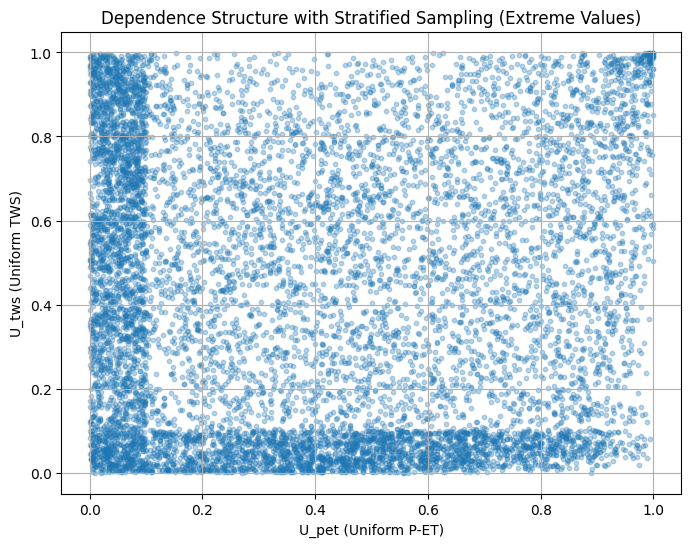

In [25]:
plt.figure(figsize=(8, 6))
plt.scatter(u_pet_sample, u_tws_sample, alpha=0.3, s=10)
plt.xlabel('U_pet (Uniform P-ET)')
plt.ylabel('U_tws (Uniform TWS)')
plt.title('Dependence Structure with Stratified Sampling (Extreme Values)')
plt.grid(True)
plt.show()

In [30]:
# Combine sampled data
data_sample = np.vstack((u_pet_sample, u_tws_sample)).T

# Test copulas
copulas = {
    # 'Gaussian': GaussianCopula(),
    # 'Clayton': ClaytonCopula(),
    # 'Gumbel': GumbelCopula(),
    # 'Frank': FrankCopula(),
    't-copula': StudentCopula()
}

best_copula = None
best_log_lik = -np.inf
for name, copula in copulas.items():
    try:
        copula.fit(data_sample)
        log_lik = copula.log_lik(data_sample)
        print(f"{name} Copula Log-Likelihood: {log_lik:.2f}")
        if log_lik > best_log_lik:
            best_log_lik = log_lik
            best_copula = (name, copula)
    except Exception as e:
        print(f"Error fitting {name} copula: {e}")

print(f"Best copula: {best_copula[0]} with log-likelihood: {best_log_lik:.2f}")

t-copula Copula Log-Likelihood: 43.64
Best copula: t-copula with log-likelihood: 43.64


In [27]:
best_copula

('Gumbel', <copulae.archimedean.gumbel.GumbelCopula at 0x7fc6a09ced60>)

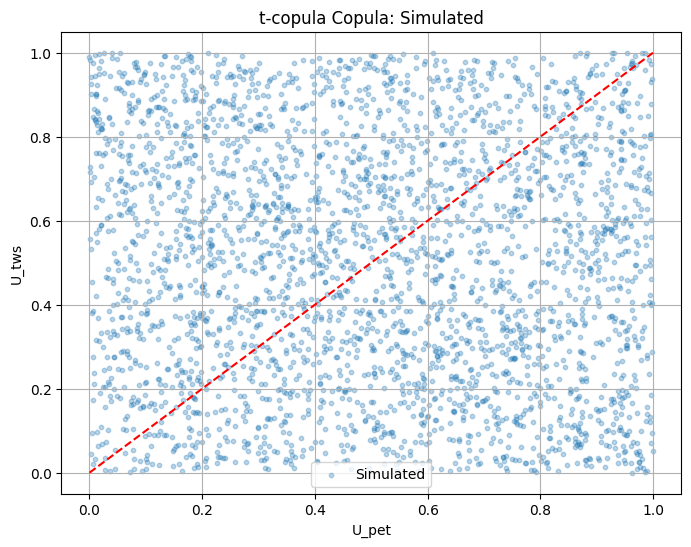

In [53]:
simulated_data = best_copula[1].random(3000)
plt.figure(figsize=(8, 6))
# plt.scatter(u_pet_sample, u_tws_sample, alpha=0.3, s=10, label='Observed')
plt.scatter(simulated_data[:, 0], simulated_data[:, 1], alpha=0.3, s=10, label='Simulated')
plt.plot([0,1], [0,1], 'r--') 
plt.xlabel('U_pet')
plt.ylabel('U_tws')
plt.title(f'{best_copula[0]} Copula: Simulated')
plt.legend()
plt.grid(True)
plt.show()

In [33]:
from scipy.stats import kendalltau
tau_full, _ = kendalltau(u_pet, u_tws)
tau_sample, _ = kendalltau(u_pet_sample, u_tws_sample)
print(f"Kendall's tau (full): {tau_full:.3f}, (sample): {tau_sample:.3f}")

Kendall's tau (full): 0.065, (sample): -0.033


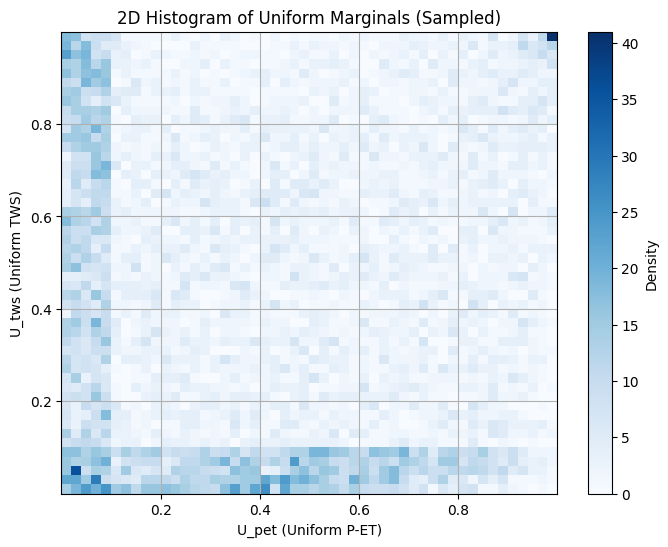

In [32]:
plt.figure(figsize=(8, 6))
plt.hist2d(u_pet_sample, u_tws_sample, bins=50, cmap='Blues')
plt.colorbar(label='Density')
plt.xlabel('U_pet (Uniform P-ET)')
plt.ylabel('U_tws (Uniform TWS)')
plt.title('2D Histogram of Uniform Marginals (Sampled)')
plt.grid(True)
plt.show()

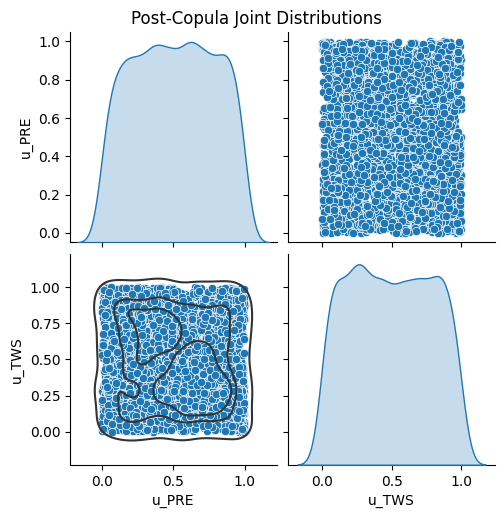

In [34]:
df = pd.DataFrame(simulated_data, columns=['u_PRE', 'u_TWS'])

# Add joint distribution diagnostics
g = sns.pairplot(df, diag_kind='kde', corner=False)
g.map_lower(sns.kdeplot, levels=4, color=".2")
plt.suptitle('Post-Copula Joint Distributions', y=1.02)
plt.show()

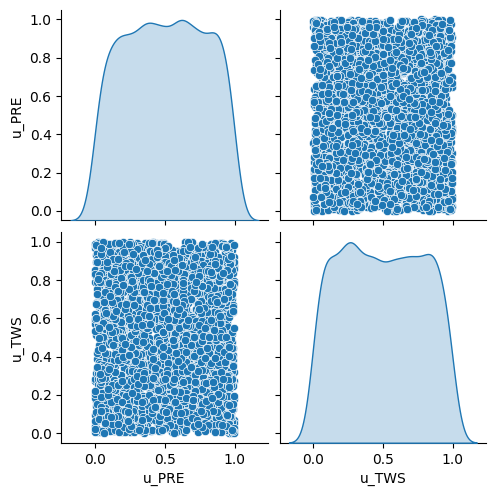

In [45]:
sns.pairplot(pd.DataFrame(simulated_data, columns=['u_PRE', 'u_TWS']), 
             diag_kind='kde', corner=False)

In [61]:
from copulae import GaussianCopula, ClaytonCopula, GumbelCopula, FrankCopula

# Combine sampled data
data_sample = np.vstack((u_pet_sample, u_tws_sample)).T

# Test copulas
copulas = {
    'Gaussian': GaussianCopula(),
    'Clayton': ClaytonCopula(),
    'Gumbel': GumbelCopula(),
    'Frank': FrankCopula()
}

best_copula = None
best_log_lik = -np.inf
for name, copula in copulas.items():
    try:
        copula.fit(data_sample)
        log_lik = copula.log_lik(data_sample)
        print(f"{name} Copula Log-Likelihood: {log_lik:.2f}")
        if log_lik > best_log_lik:
            best_log_lik = log_lik
            best_copula = (name, copula)
    except Exception as e:
        print(f"Error fitting {name} copula: {e}")

print(f"Best copula: {best_copula[0]} with log-likelihood: {best_log_lik:.2f}")

Gaussian Copula Log-Likelihood: 99.76
Clayton Copula Log-Likelihood: 6.00
Gumbel Copula Log-Likelihood: 261.60
Frank Copula Log-Likelihood: 54.09
Best copula: Gumbel with log-likelihood: 261.60


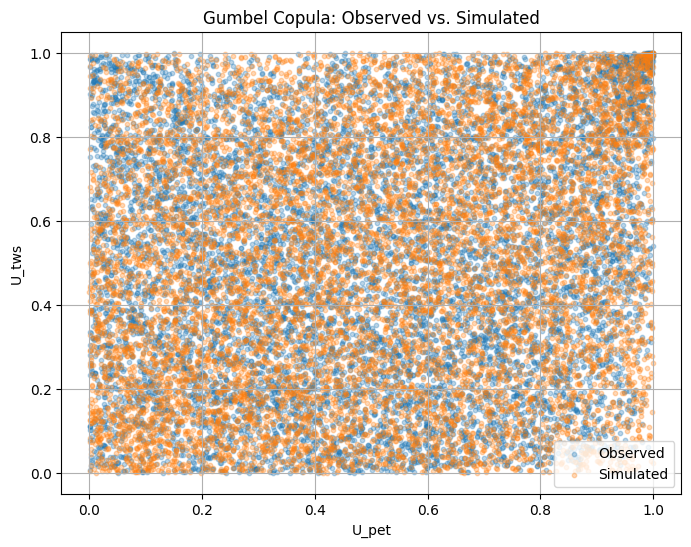

In [62]:
simulated_data = best_copula[1].random(sample_size)
plt.figure(figsize=(8, 6))
plt.scatter(u_pet_sample, u_tws_sample, alpha=0.3, s=10, label='Observed')
plt.scatter(simulated_data[:, 0], simulated_data[:, 1], alpha=0.3, s=10, label='Simulated')
plt.xlabel('U_pet')
plt.ylabel('U_tws')
plt.title(f'{best_copula[0]} Copula: Observed vs. Simulated')
plt.legend()
plt.grid(True)
plt.show()

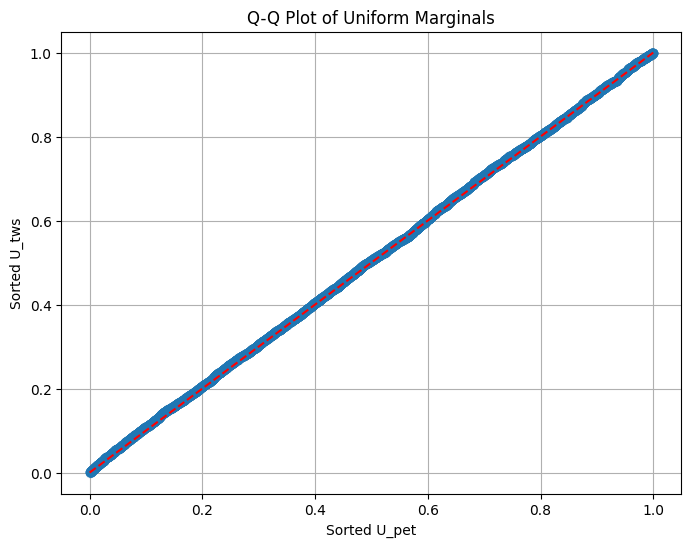

In [63]:
plt.figure(figsize=(8, 6))
plt.plot(np.sort(u_pet_sample), np.sort(u_tws_sample), 'o', alpha=0.3)
plt.plot([0, 1], [0, 1], 'r--')  # Diagonal for reference
plt.xlabel('Sorted U_pet')
plt.ylabel('Sorted U_tws')
plt.title('Q-Q Plot of Uniform Marginals')
plt.grid(True)
plt.show()

In [16]:
pet_p = zone_1['pet'].values[~np.isnan(zone_1['pet'].values)]

<AxesSubplot: ylabel='Count'>

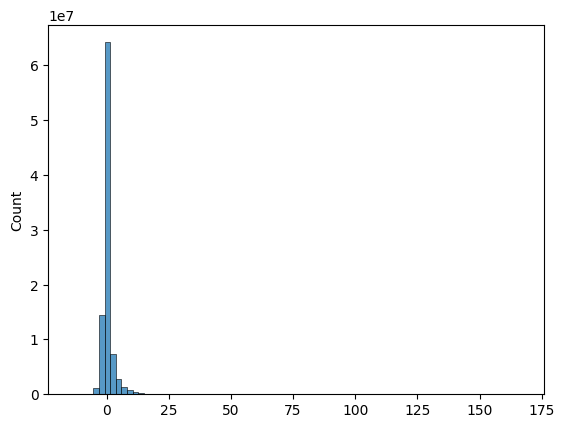

In [21]:
sns.histplot(pet_p, bins=80)

#### Standardise the data

In [83]:
# Normalize raw data by subtracting mean and dividing by standard deviation
stats_dict = {}
normalized_dict = {}
for var in ['pet_60', 'pet_90', 'pet_120', 'tws']:
    
    data = zone_1[var].compute()
    mean = data.mean().compute()
    std = data.std().compute()
    mean = float(mean)
    std = float(std)
    std = max(std, 1e-6)  # Avoid division by zero
    stats_dict[var] = {'mean': mean, 'std': std}  
    print(f"Statistics for {var}: mean={mean:.4f}, std={std:.4f}")

    # Normalize: (data - mean) / std
    normalized_data = (data - mean) / std
    normalized_dict[var] = normalized_data

Statistics for pet_60: mean=0.4162, std=1.3237
Statistics for pet_90: mean=0.4158, std=1.1362
Statistics for tws: mean=5.9288, std=62.7625


In [84]:
normalized_dict

{'pet_60': <xarray.DataArray 'pet_60' (time: 7671, space: 410198)>
 array([[nan, nan, nan, ..., nan, nan, nan],
        [nan, nan, nan, ..., nan, nan, nan],
        [nan, nan, nan, ..., nan, nan, nan],
        ...,
        [nan, nan, nan, ..., nan, nan, nan],
        [nan, nan, nan, ..., nan, nan, nan],
        [nan, nan, nan, ..., nan, nan, nan]])
 Coordinates:
   * time         (time) datetime64[ns] 2004-01-01 2004-01-02 ... 2024-12-31
   * space        (space) object MultiIndex
   * y            (space) float64 -11.73 -11.73 -11.73 ... 23.12 23.12 23.12
   * x            (space) float64 23.28 23.33 23.38 23.43 ... 51.28 51.33 51.38
     subregion    int64 1
     band         int64 1
     spatial_ref  int64 0
     lat          (space) float64 nan nan nan nan nan ... 23.12 23.12 23.12 23.12
     lon          (space) float64 nan nan nan nan nan ... 51.18 51.28 51.33 51.38,
 'pet_90': <xarray.DataArray 'pet_90' (time: 7671, space: 410198)>
 array([[nan, nan, nan, ..., nan, nan, nan],
  

In [107]:
# Normalize raw data by subtracting mean and dividing by standard deviation
stats_dict = {}
normalized_dict = {}
for var in ['pet', 'tws']:
    
    data = zone_1[var].compute()
    mean = data.mean().compute()
    std = data.std().compute()
    mean = float(mean)
    std = float(std)
    std = max(std, 1e-6)  # Avoid division by zero
    stats_dict[var] = {'mean': mean, 'std': std}  
    print(f"Statistics for {var}: mean={mean:.4f}, std={std:.4f}")

    # Normalize: (data - mean) / std
    normalized_data = (data - mean) / std
    normalized_dict[var] = normalized_data

Statistics for pet: mean=0.4157, std=1.0225
Statistics for tws: mean=5.9288, std=62.7625


In [132]:
# Normalize raw data by subtracting mean and dividing by standard deviation

stats_dict = {}
normalized_dict = {}
for var in ['precipitation', 'et', 'pet', 'tws']:
    
    data = zone_1[var].compute()
    mean = data.mean().compute()
    std = data.std().compute()
    mean = float(mean)
    std = float(std)
    #std = max(std, 1e-6)  # Avoid division by zero
    stats_dict[var] = {'mean': mean, 'std': std}  
    print(f"Statistics for {var}: mean={mean:.4f}, std={std:.4f}")

    # Normalize: (data - mean) / std
    normalized_data = (data - mean) / std
    normalized_dict[var] = normalized_data

Statistics for precipitation: mean=1.3224, std=5.8509
Statistics for et: mean=0.9190, std=1.2840
Statistics for pet: mean=0.4157, std=1.0225
Statistics for tws: mean=5.9288, std=62.7625


In [97]:
normalized_dict

{'pet': <xarray.DataArray 'pet' (time: 7671, space: 226127)>
 array([[nan, nan, nan, ..., nan, nan, nan],
        [nan, nan, nan, ..., nan, nan, nan],
        [nan, nan, nan, ..., nan, nan, nan],
        ...,
        [nan, nan, nan, ..., nan, nan, nan],
        [nan, nan, nan, ..., nan, nan, nan],
        [nan, nan, nan, ..., nan, nan, nan]], dtype=float32)
 Coordinates:
     band         int64 1
   * time         (time) datetime64[ns] 2004-01-01 2004-01-02 ... 2024-12-31
     spatial_ref  int64 0
     lat          (space) float64 23.12 23.12 23.12 ... -11.38 -11.38 -11.38
     lon          (space) float64 30.33 30.38 30.48 30.53 ... 51.28 51.33 51.38
   * space        (space) object MultiIndex
   * y            (space) float64 23.12 23.12 23.12 ... -11.38 -11.38 -11.38
   * x            (space) float64 30.33 30.38 30.48 30.53 ... 51.28 51.33 51.38
     subregion    int64 1,
 'tws': <xarray.DataArray 'tws' (time: 7671, space: 226127)>
 array([[nan, nan, nan, ..., nan, nan, nan],
      

In [85]:
zone_1_stacked = {}
for var in ['pet_60', 'pet_90', 'pet_120', 'tws']:
    zone_1_stacked[var] = normalized_dict[var].unstack('space')
# stack_time = time.time()a
# print(f"Stacking done in {stack_time - norm_time:.2f} seconds.")

In [86]:
zone_1_stacked

{'pet_60': <xarray.DataArray 'pet_60' (time: 7671, y: 698, x: 590)>
 array([[[nan, nan, nan, ..., nan, nan, nan],
         [nan, nan, nan, ..., nan, nan, nan],
         [nan, nan, nan, ..., nan, nan, nan],
         ...,
         [nan, nan, nan, ..., nan, nan, nan],
         [nan, nan, nan, ..., nan, nan, nan],
         [nan, nan, nan, ..., nan, nan, nan]],
 
        [[nan, nan, nan, ..., nan, nan, nan],
         [nan, nan, nan, ..., nan, nan, nan],
         [nan, nan, nan, ..., nan, nan, nan],
         ...,
         [nan, nan, nan, ..., nan, nan, nan],
         [nan, nan, nan, ..., nan, nan, nan],
         [nan, nan, nan, ..., nan, nan, nan]],
 
        [[nan, nan, nan, ..., nan, nan, nan],
         [nan, nan, nan, ..., nan, nan, nan],
         [nan, nan, nan, ..., nan, nan, nan],
         ...,
 ...
         ...,
         [nan, nan, nan, ..., nan, nan, nan],
         [nan, nan, nan, ..., nan, nan, nan],
         [nan, nan, nan, ..., nan, nan, nan]],
 
        [[nan, nan, nan, ..., nan,

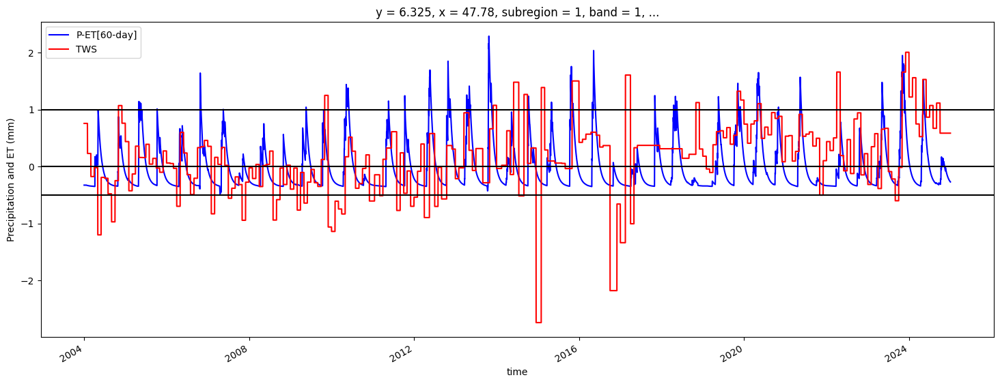

In [106]:
# Set up the figure
plt.figure(figsize=(18, 6))

# Create the first axis for ppt and et2.239800447168621, 44.209413834531375
ax1 = plt.gca()  # Get current axis
zone_1_stacked['pet_60'].sel(y=6.30, x=47.76, method='nearest').plot(ax=ax1, label='P-ET[60-day]', color='blue')
# zone_1_stacked['et'].sel(y=6.30, x=47.76, method='nearest').plot(ax=ax1, label='ET', color='green')
# zone_1_stacked['precipitation'].sel(y=6.30, x=47.76, method='nearest').plot(ax=ax1, label='Precipitation', color='yellow')
zone_1_stacked['tws'].sel(y=6.30, x=47.76, method='nearest').plot(ax=ax1, label='TWS', color='red')
# zone_1_stacked['et'].sel(y=0, x=40, method='nearest').plot(ax=ax1, label='ET', color='green')

# Customize the first axis
ax1.set_ylabel('Precipitation and ET (mm)')  # Assuming ppt and et are in mm
ax1.legend(loc='upper left')

# Create the second axis for tws
# ax2 = ax1.twinx()
# zone_1_stacked['tws'].sel(y=2.23, x=44.20, method='nearest').plot(ax=ax2, label='TWS', color='red')

# # Customize the second axis
# ax2.set_ylabel('TWS (unit)')  # Replace 'unit' with the actual unit of tws
# ax2.legend(loc='upper right')
# plt.ylim(-4, 8)
plt.axhline(y=1, color='black')
plt.axhline(y=0, color='black')
plt.axhline(y=-.5, color='black')
# Show the plot
plt.show()

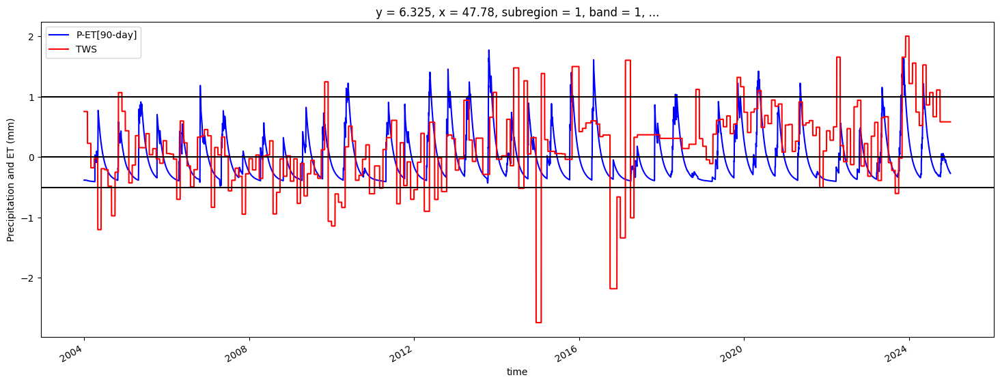

In [104]:
# Set up the figure
plt.figure(figsize=(18, 6))

# Create the first axis for ppt and et2.239800447168621, 44.209413834531375
ax1 = plt.gca()  # Get current axis
zone_1_stacked['pet_90'].sel(y=6.30, x=47.76, method='nearest').plot(ax=ax1, label='P-ET[90-day]', color='blue')
# zone_1_stacked['et'].sel(y=6.30, x=47.76, method='nearest').plot(ax=ax1, label='ET', color='green')
# zone_1_stacked['precipitation'].sel(y=6.30, x=47.76, method='nearest').plot(ax=ax1, label='Precipitation', color='yellow')
zone_1_stacked['tws'].sel(y=6.30, x=47.76, method='nearest').plot(ax=ax1, label='TWS', color='red')
# zone_1_stacked['et'].sel(y=0, x=40, method='nearest').plot(ax=ax1, label='ET', color='green')

# Customize the first axis
ax1.set_ylabel('Precipitation and ET (mm)')  # Assuming ppt and et are in mm
ax1.legend(loc='upper left')

# Create the second axis for tws
# ax2 = ax1.twinx()
# zone_1_stacked['tws'].sel(y=2.23, x=44.20, method='nearest').plot(ax=ax2, label='TWS', color='red')

# # Customize the second axis
# ax2.set_ylabel('TWS (unit)')  # Replace 'unit' with the actual unit of tws
# ax2.legend(loc='upper right')
# plt.ylim(-4, 8)
plt.axhline(y=1, color='black')
plt.axhline(y=0, color='black')
plt.axhline(y=-.5, color='black')
# Show the plot
plt.show()

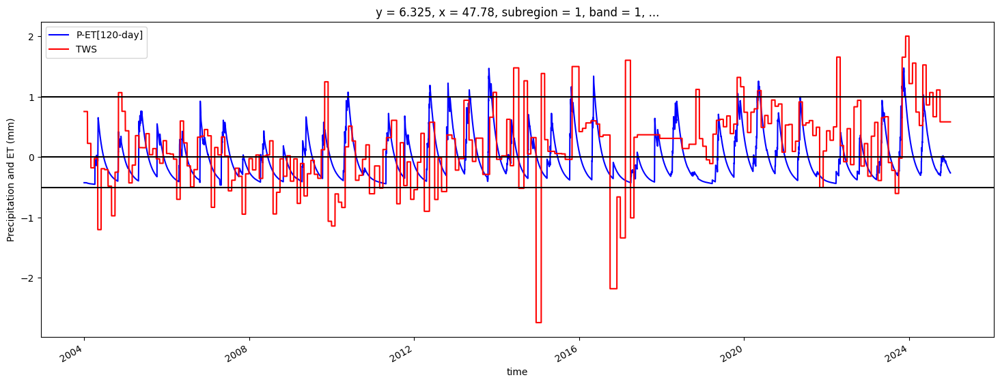

In [128]:
# Set up the figure
plt.figure(figsize=(18, 6))

# Create the first axis for ppt and et2.239800447168621, 44.209413834531375
ax1 = plt.gca()  # Get current axis
zone_1_stacked['pet_120'].sel(y=6.30, x=47.76, method='nearest').plot(ax=ax1, label='P-ET[120-day]', color='blue')
# zone_1_stacked['et'].sel(y=6.30, x=47.76, method='nearest').plot(ax=ax1, label='ET', color='green')
# zone_1_stacked['precipitation'].sel(y=6.30, x=47.76, method='nearest').plot(ax=ax1, label='Precipitation', color='yellow')
zone_1_stacked['tws'].sel(y=6.30, x=47.76, method='nearest').plot(ax=ax1, label='TWS', color='red')
# zone_1_stacked['et'].sel(y=0, x=40, method='nearest').plot(ax=ax1, label='ET', color='green')
# spei.spei.sel(time=slice('2004-01-01', None)).sel(lat=6.30, lon=47.76, method='nearest').plot(ax=ax1, label='SPEI-03', color='orange')

# Customize the first axis
ax1.set_ylabel('Precipitation and ET (mm)')  # Assuming ppt and et are in mm
ax1.legend(loc='upper left')

# Create the second axis for tws
# ax2 = ax1.twinx()
# zone_1_stacked['tws'].sel(y=2.23, x=44.20, method='nearest').plot(ax=ax2, label='TWS', color='red')

# # Customize the second axis
# ax2.set_ylabel('TWS (unit)')  # Replace 'unit' with the actual unit of tws
# ax2.legend(loc='upper right')
# plt.ylim(-4, 8)
plt.axhline(y=1, color='black')
plt.axhline(y=0, color='black')
plt.axhline(y=-.5, color='black')
# Show the plot
plt.show()

In [20]:
tws_all = zone_1_stacked['tws'].compute().values
p_et_all = zone_1_stacked['pet'].compute().values

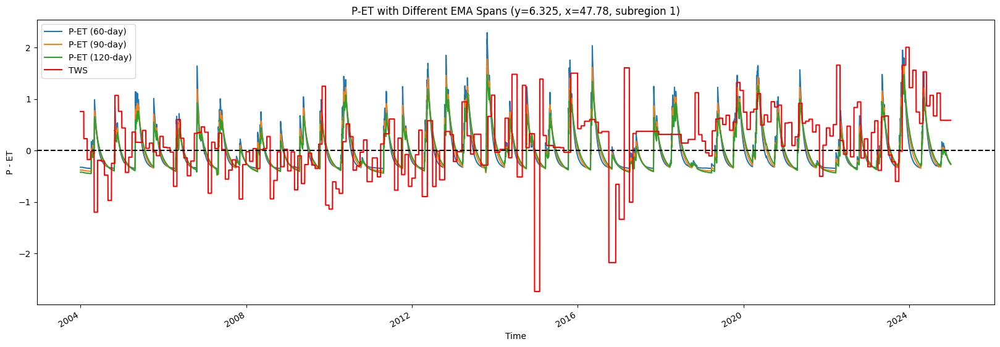

In [132]:
y, x = 6.325, 47.78
# Plot
plt.figure(figsize=(20, 6))
zone_1_stacked['pet_60'].sel(y=y, x=x, method='nearest').plot(label='P-ET (60-day)')
zone_1_stacked['pet_90'].sel(y=y, x=x, method='nearest').plot(label='P-ET (90-day)')
zone_1_stacked['pet_120'].sel(y=y, x=x, method='nearest').plot(label='P-ET (120-day)')
zone_1_stacked['tws'].sel(y=6.325, x=47.76, method='nearest').plot(label='TWS', color='red')

plt.axhline(0, color='k', linestyle='--')
plt.title(f"P-ET with Different EMA Spans (y={y}, x={x}, subregion 1)")
plt.xlabel("Time")
plt.ylabel("P - ET")
plt.legend()
plt.show()

In [1]:
spei.spei

NameError: name 'spei' is not defined

In [25]:
# Option 2: Take a random sample (better for large datasets)
sample_size = 1000  # adjust as needed
random_idx = np.random.choice((67777), size=sample_size, replace=False)
tws_sample = tws_all[random_idx]
p_et_sample = p_et_all[random_idx]

# Create the scatter plot
plt.figure(figsize=(10, 6))
plt.scatter(tws_sample, p_et_sample, s=5)  # alpha for transparency, s for point size

# Add labels and title
plt.xlabel('Terrestrial Water Storage (TWS)')
plt.ylabel('Precipitation minus Evapotranspiration (P-ET)')
plt.title('Scatter Plot: TWS vs P-ET')

# Add grid
plt.grid(True, alpha=0.3)

plt.show()

TypeError: 'method' object is not subscriptable

In [38]:
tws_allj = tws_all[~np.isnan(tws_all)]

In [110]:
p_et_allj = p_et_all[~np.isnan(p_et_all)]

In [111]:
p_et_allj.max()

30.698474257190615

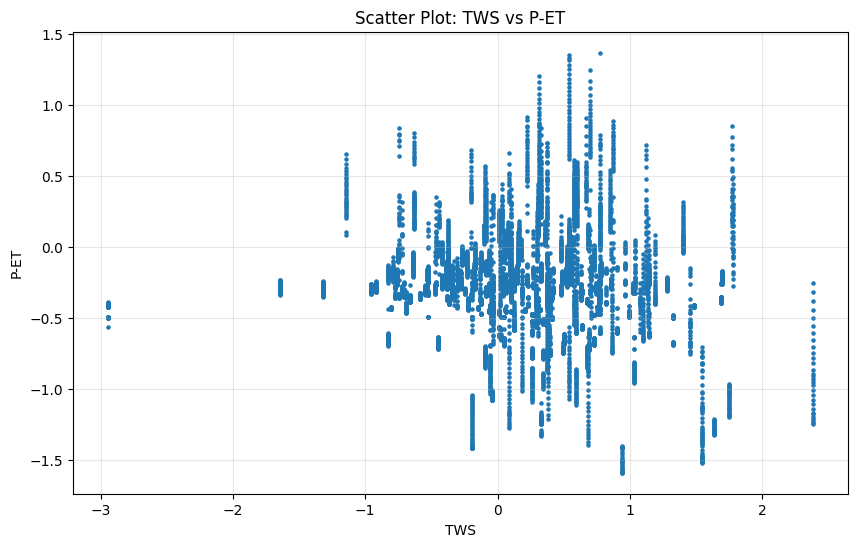

In [112]:
# # Option 2: Take a random sample (better for large datasets)
# sample_size = 800000  # adjust as needed
# random_idx = np.random.choice(len(tws_all), size=sample_size, replace=False)
tws_sample = zone_1_stacked['tws'].sel(y=5, x=47.76, method='nearest').values
p_et_sample = zone_1_stacked['pet'].sel(y=5, x=47.76, method='nearest').values

# Create the scatter plot
plt.figure(figsize=(10, 6))
plt.scatter(tws_sample, p_et_sample, s=5)  # alpha for transparency, s for point size

# Add labels and title
plt.xlabel('TWS')
plt.ylabel('P-ET')
plt.title('Scatter Plot: TWS vs P-ET')

# Add grid
plt.grid(True, alpha=0.3)

plt.show()

In [126]:
# # Option 2: Take a random sample (better for large datasets)
# sample_size = 800000  # adjust as needed
# random_idx = np.random.choice(len(tws_all), size=sample_size, replace=False)
tws_sample = zone_1_stacked['tws'].sel(time=slice('2004-01-01', '2016-12-01')).sel(y=5, x=47.76, method='nearest').compute().values
p_et_sample = zone_1_stacked['pet_90'].sel(time=slice('2004-01-01', '2016-12-01')).sel(y=5, x=47.76, method='nearest').compute().values
sp = spei.spei.sel(time=slice('2004-01-01', '2016-12-01')).sel(lat=5, lon=47.76, method='nearest').values



ValueError: x and y must be the same size

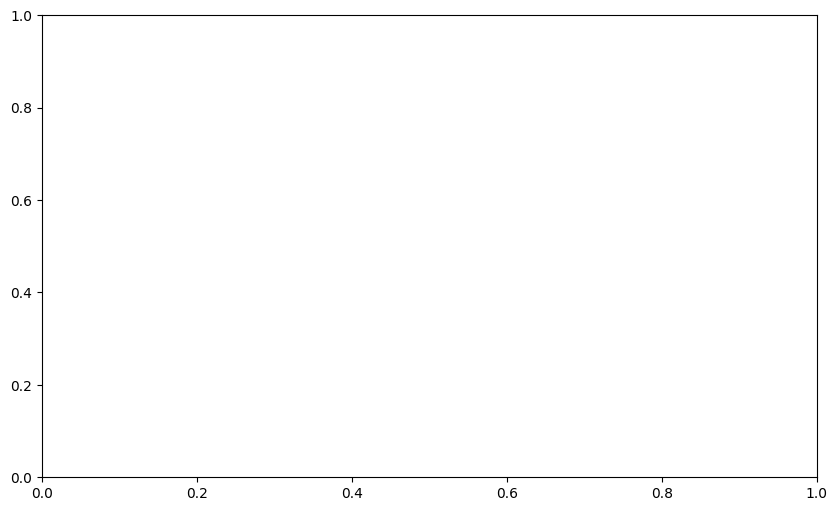

In [127]:
# Create the scatter plot
plt.figure(figsize=(10, 6))
plt.scatter(tws_sample, sp, s=5)  # alpha for transparency, s for point size

# Add labels and title
plt.xlabel('TWS')
plt.ylabel('P-ET')
plt.title('Scatter Plot: TWS vs P-ET')

# Add grid
plt.grid(True, alpha=0.3)

plt.show()

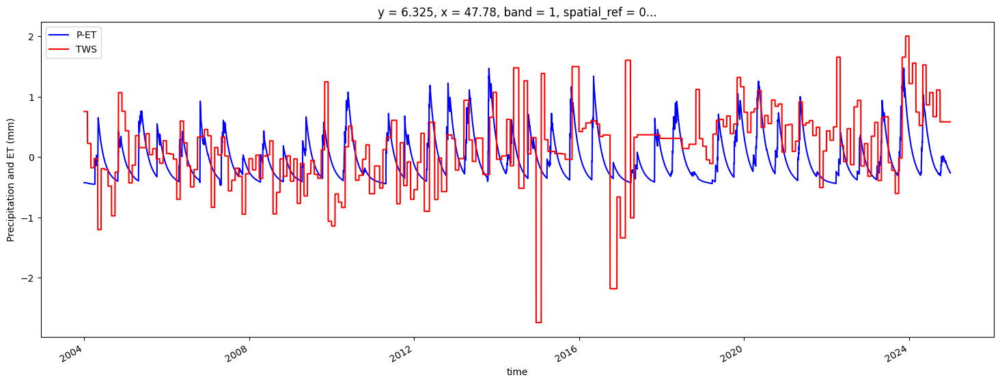

In [113]:
# Set up the figure
plt.figure(figsize=(18, 6))

# Create the first axis for ppt and et2.239800447168621, 44.209413834531375
ax1 = plt.gca()  # Get current axis
zone_1_stacked['pet'].sel(y=6.30, x=47.76, method='nearest').plot(ax=ax1, label='P-ET', color='blue')
# zone_1_stacked['et'].sel(y=6.30, x=47.76, method='nearest').plot(ax=ax1, label='ET', color='green')
# zone_1_stacked['precipitation'].sel(y=6.30, x=47.76, method='nearest').plot(ax=ax1, label='Precipitation', color='yellow')
zone_1_stacked['tws'].sel(y=6.30, x=47.76, method='nearest').plot(ax=ax1, label='TWS', color='red')
# zone_1_stacked['et'].sel(y=0, x=40, method='nearest').plot(ax=ax1, label='ET', color='green')

# Customize the first axis
ax1.set_ylabel('Precipitation and ET (mm)')  # Assuming ppt and et are in mm
ax1.legend(loc='upper left')

# Create the second axis for tws
# ax2 = ax1.twinx()
# zone_1_stacked['tws'].sel(y=2.23, x=44.20, method='nearest').plot(ax=ax2, label='TWS', color='red')

# # Customize the second axis
# ax2.set_ylabel('TWS (unit)')  # Replace 'unit' with the actual unit of tws
# ax2.legend(loc='upper right')
# plt.ylim(-4, 8)
# Show the plot
plt.show()

In [115]:
spei

<xarray.Dataset>
Dimensions:  (lat: 1800, lon: 2080, time: 432)
Coordinates:
  * lat      (lat) float32 47.97 47.92 47.88 47.83 ... -41.88 -41.92 -41.97
  * lon      (lon) float32 -27.98 -27.92 -27.88 -27.83 ... 75.88 75.93 75.97
  * time     (time) datetime64[ns] 1981-01-01 1981-02-01 ... 2016-12-01
Data variables:
    spei     (time, lat, lon) float32 ...
Attributes:
    title:                     High resolution Standardized Precipitation Eva...
    institution:               School of Geography and the Environment, Unive...
    version:                   1.0
    creators:                  Jian Peng, Simon Dadson, Feyera Hirpa, Ellen D...
    source:                    The dataset was produced using CHIRPS precipit...
    comment:                   The dataset was produced as part of the UK Spa...
    time_coverage:             1981.01-2016.12
    time_coverage_resolution:  monthly
    spatial_resolution:        5km

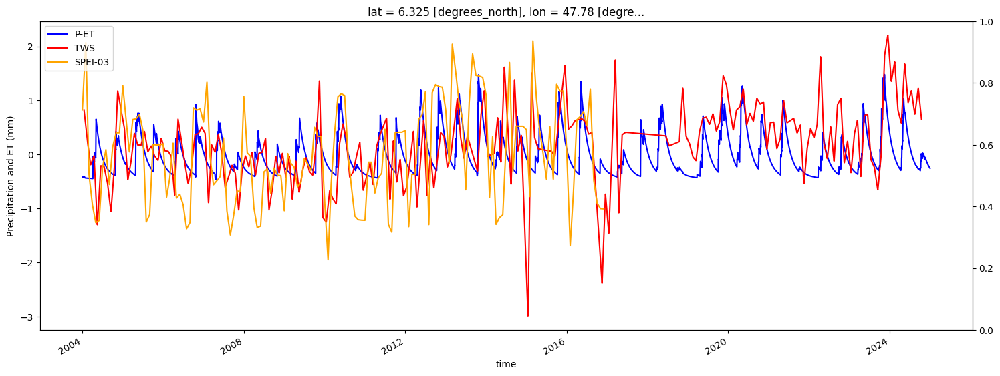

In [102]:
# Set up the figure
plt.figure(figsize=(18, 6))

# Create the first axis for ppt and et2.239800447168621, 44.209413834531375
ax1 = plt.gca()  # Get current axis

zone_1_stacked['pet'].sel(y=6.30, x=47.76, method='nearest').plot(ax=ax1, label='P-ET', color='blue')
# zone_1_stacked['et'].sel(y=6.30, x=47.76, method='nearest').plot(ax=ax1, label='ET', color='green')
# zone_1_stacked['precipitation'].sel(y=6.30, x=47.76, method='nearest').plot(ax=ax1, label='Precipitation', color='yellow')
zone_1_stacked['tws'].sel(y=6.30, x=47.76, method='nearest').plot(ax=ax1, label='TWS', color='red')

spei.spei.sel(time=slice('2004-01-01', None)).sel(lat=6.30, lon=47.76, method='nearest').plot(ax=ax1, label='SPEI-03', color='orange')
# zone_1_stacked['et'].sel(y=0, x=40, method='nearest').plot(ax=ax1, label='ET', color='green')

# Customize the first axis
ax1.set_ylabel('Precipitation and ET (mm)')  # Assuming ppt and et are in mm
ax1.legend(loc='upper left')

# Create the second axis for tws
ax2 = ax1.twinx()
# # zone_1_stacked['tws'].sel(y=2.23, x=44.20, method='nearest').plot(ax=ax2, label='TWS', color='red')
# spei.spei.sel(time=slice('2004-01-01', None)).sel(lat=6.30, lon=47.76, method='nearest').plot(ax=ax2, label='SPEI-03', color='orange')
# # Customize the second axis
# ax2.set_ylabel('TWS (unit)')  # Replace 'unit' with the actual unit of tws
# ax2.legend(loc='upper right')
# plt.ylim(-4, 8)
# Show the plot
plt.show()

In [4]:
zone_1_stacked = {}
for var in ['precipitation', 'et', 'tws']:
    zone_1_stacked[var] = normalized_dict[var].stack(space=('y', 'x'), create_index=False)
# stack_time = time.time()a
# print(f"Stacking done in {stack_time - norm_time:.2f} seconds.")

NameError: name 'normalized_dict' is not defined

In [116]:
zone_1_stacked

{'pet': <xarray.DataArray 'pet' (time: 7671, space: 226127)>
 array([[nan, nan, nan, ..., nan, nan, nan],
        [nan, nan, nan, ..., nan, nan, nan],
        [nan, nan, nan, ..., nan, nan, nan],
        ...,
        [nan, nan, nan, ..., nan, nan, nan],
        [nan, nan, nan, ..., nan, nan, nan],
        [nan, nan, nan, ..., nan, nan, nan]])
 Coordinates:
     band         int64 1
   * time         (time) datetime64[ns] 2004-01-01 2004-01-02 ... 2024-12-31
     spatial_ref  int64 0
     lat          (space) float64 23.12 23.12 23.12 ... -11.38 -11.38 -11.38
     lon          (space) float64 30.33 30.38 30.48 30.53 ... 51.28 51.33 51.38
   * space        (space) object MultiIndex
   * y            (space) float64 23.12 23.12 23.12 ... -11.38 -11.38 -11.38
   * x            (space) float64 30.33 30.38 30.48 30.53 ... 51.28 51.33 51.38
     subregion    int64 1,
 'tws': <xarray.DataArray 'tws' (time: 7671, space: 226127)>
 array([[nan, nan, nan, ..., nan, nan, nan],
        [nan, nan, na

In [136]:
# Step 3: Compute Zone-Level ECDF and Transform to Uniform Margins
ecdf_funcs = {}
uniform_data = {}
variables = ['precipitation', 'et', 'tws']
for var in variables:
    print(f"Computing ECDF for {var} in subregion 1...")
    # Convert to Dask array and flatten across all pixels and time steps
    data_flat = zone_1_stacked[var].data  # Dask array
    data_flat = da.from_array(data.flatten(), rechunks='auto')
    valid_data = data_flat[~da.isnan(data_flat)]  # Compute to fit ECDF
    
    # Check for sufficient data
    if len(valid_data) < 2:
        print(f"Warning: Insufficient data for {var} in subregion 1")
        uniform_data[var] = xr.full_like(zone_1_stacked[var], np.nan)
        continue
    
    # Fit ECDF on the entire zone's data
    ecdf_model = ECDF(valid_data)
    ecdf_funcs[var] = ecdf_model
    
    # Transform the entire dataset to uniform margins
    def apply_ecdf(data, ecdf_model):
        valid_mask = ~np.isnan(data)
        result = np.full_like(data, np.nan, dtype=np.float64)
        if valid_mask.any():
            result[valid_mask] = ecdf_model(data[valid_mask])
        # Clip probabilities to avoid exactly 0 or 1
        epsilon = 1e-7
        result = np.where(np.isnan(result), np.nan)
        return result
    
    # Apply the ECDF to the entire dataset
    uniform_data[var] = xr.apply_ufunc(
        apply_ecdf,
        zone_1_stacked[var],
        ecdf_model,
        input_core_dims=[['time', 'points'], []],
        output_core_dims=[['time', 'points']],
        exclude_dims=set(('time', 'points')),
        dask='parallelized',
        output_dtypes=[np.float64]
    ).rename(f'u_{var.upper()[:3]}')

print("ECDF computation and transformation submitted to Dask.")
ecdf_time = time.time()
print(f"ECDF setup done in {ecdf_time - stack_time:.2f} seconds (computation pending).")

Computing ECDF for precipitation in subregion 1...


AttributeError: 'DataArray' object has no attribute 'flatten'

In [16]:
uniform_data

{'pet': <xarray.DataArray 'u_PET' (time: 7671, space: 226127)>
 array([[nan, nan, nan, ..., nan, nan, nan],
        [nan, nan, nan, ..., nan, nan, nan],
        [nan, nan, nan, ..., nan, nan, nan],
        ...,
        [nan, nan, nan, ..., nan, nan, nan],
        [nan, nan, nan, ..., nan, nan, nan],
        [nan, nan, nan, ..., nan, nan, nan]])
 Coordinates:
     band         int64 1
     spatial_ref  int64 0
     subregion    int64 1
 Dimensions without coordinates: time, space,
 'tws': <xarray.DataArray 'u_TWS' (time: 7671, space: 226127)>
 array([[nan, nan, nan, ..., nan, nan, nan],
        [nan, nan, nan, ..., nan, nan, nan],
        [nan, nan, nan, ..., nan, nan, nan],
        ...,
        [nan, nan, nan, ..., nan, nan, nan],
        [nan, nan, nan, ..., nan, nan, nan],
        [nan, nan, nan, ..., nan, nan, nan]])
 Coordinates:
     band         int64 1
     spatial_ref  int64 0
     subregion    int64 1
 Dimensions without coordinates: time, space}

In [121]:
# Step 4: Prepare Data for Sampling
ecdf_time = time.time()
print("Preparing data for sampling...")
# Create a dataset with both uniform probabilities and actual (accumulated) values
pseudo_obs_ds = xr.merge([uniform_data['pet'],
                         uniform_data['tws'],
                         zone_1_stacked['pet'].rename('accum_PET'),
                         zone_1_stacked['tws'].rename('accum_TWS')])
pseudo_obs_flat = pseudo_obs_ds.stack(point=('time', 'space'), create_index=False).dropna(dim='point', how='any')
pseudo_obs_ddf = pseudo_obs_flat.to_dask_dataframe()
print("Converted valid pseudo-observations to Dask DataFrame.")
prep_time = time.time()
print(f"Preparation done in {prep_time - ecdf_time:.2f} seconds.")

Preparing data for sampling...
Converted valid pseudo-observations to Dask DataFrame.
Preparation done in 166.33 seconds.


In [ ]:
# Step 5: Sample for Copula Fitting
sample_fraction = 0.00055  # Adjust as needed
random_seed = 42
print(f"Sampling data ({sample_fraction*100:.2f}%) for copula fitting...")
if sample_fraction > 0 and sample_fraction <= 1.0:
    sampled_ddf = pseudo_obs_ddf.sample(frac=sample_fraction, random_state=random_seed)
    start_compute_sample = time.time()
    sampled_df_in_memory = sampled_ddf.compute()
    end_compute_sample = time.time()
    print(f"Sample computed in {end_compute_sample - start_compute_sample:.2f} seconds.")
    print(f"Sample size brought into memory: {len(sampled_df_in_memory)}")
    if len(sampled_df_in_memory) < 1000:
        print(f"Warning: Sample size ({len(sampled_df_in_memory)}) is very small...")
        if len(sampled_df_in_memory) < 50:
            raise ValueError("Sample size too small to fit copula reliably.")
else:
    raise ValueError(f"Invalid sample_fraction: {sample_fraction}...")

In [70]:
(sampled_df_in_memory['u_TWS'])

45312531    0.368135
17498657    0.395914
39923128    0.815967
30744317    0.262111
30758993    0.839072
              ...   
45931231    0.124138
41880765    0.470896
19983296    0.422451
2777697     0.541005
30039919    0.728525
Name: u_TWS, Length: 2439, dtype: float64

In [122]:
(sampled_df_in_memory['u_TWS'])

45312531    0.368135
17498657    0.395914
39923128    0.815967
30744317    0.262111
30758993    0.839072
              ...   
45931231    0.124138
41880765    0.470896
19983296    0.422451
2777697     0.541005
30039919    0.728525
Name: u_TWS, Length: 2439, dtype: float64

In [35]:
import dask.dataframe as dd
import pandas as pd

# --- Conceptual Stratified Sampling ---
# (Replace Step 5's sampling part)

print("Performing Stratified Sampling (Conceptual)...")
n_quantiles = 3 # e.g., terciles (low, medium, high) - choose appropriate number
target_sample_size_per_stratum = 50_000 # Example: sample fixed number from each stratum

# 1. Calculate quantiles for each variable (requires computation)
print("Calculating quantiles for stratification...")
# quantiles_p = pseudo_obs_ddf['u_P'].quantile(np.linspace(0, 1, n_quantiles + 1)).compute()
quantiles_et = pseudo_obs_ddf['u_PET'].quantile(np.linspace(0, 1, n_quantiles + 1)).compute()
quantiles_tws = pseudo_obs_ddf['u_TWS'].quantile(np.linspace(0, 1, n_quantiles + 1)).compute()
print("Quantiles computed.")


Performing Stratified Sampling (Conceptual)...
Calculating quantiles for stratification...
Quantiles computed.


In [80]:
# 2. Define a function to assign stratum labels based on quantiles
def assign_stratum(row, qet, qtws):
    # pd.cut assigns bins based on quantiles
    # Labels could be integers or tuples representing the bin combination
    # p_bin = pd.cut([row['u_P']], bins=qp, labels=False, include_lowest=True)[0]
    et_bin = pd.cut([row['u_PET']], bins=qet, labels=False, include_lowest=True)[0]
    tws_bin = pd.cut([row['u_TWS']], bins=qtws, labels=False, include_lowest=True)[0]
    return f"_PET{et_bin}_TWS{tws_bin}" # Example string label

In [81]:
# 3. Apply stratum assignment (can be slow)
# This might require map_partitions for efficiency
print("Assigning strata...")
# Note: Applying complex functions row-wise is slow in Dask.
# A better approach uses dd.to_delayed and custom partition processing or vectorized pd.cut if possible.
# This is a simplified illustration:
strata_labels = pseudo_obs_ddf.apply(
    assign_stratum, axis=1, meta=('stratum', 'str'),
    qet=quantiles_et, qtws=quantiles_tws # Pass quantiles
)
pseudo_obs_ddf_stratified = pseudo_obs_ddf.assign(stratum=strata_labels)
print("Strata assigned.")

Assigning strata...
Strata assigned.


In [82]:
# 4. Group by stratum and sample within each group
# This is the tricky part in Dask - sampling after grouping
print("Sampling within strata...")
# Define a sampling function per group
def sample_group(df, n_samples):
    return df.sample(n=min(len(df), n_samples), random_state=random_seed)

# Apply sampling per group - requires careful use of groupby().apply() or map_partitions
# This syntax might need adjustment based on Dask version and complexity
# It often involves computing group sizes first or handling unequal group sampling
# This is highly conceptual and likely needs refinement:
sampled_ddf = pseudo_obs_ddf_stratified.groupby('stratum').apply(
    sample_group, meta=pseudo_obs_ddf._meta, n_samples=target_sample_size_per_stratum
).reset_index(drop=True) # _meta needs to match output schema


Sampling within strata...


In [36]:
# 5. Compute the final sample
print("Computing stratified sample...")
start_compute_sample = time.time()
sampled_df_in_memory = sampled_ddf.compute() # Compute the potentially complex graph
end_compute_sample = time.time()
# ... rest of the checks ...


Computing stratified sample...


In [123]:
# Step 6: Prepare Data for Copula Fitting
copula_dat = sampled_df_in_memory[['u_PET', 'u_TWS']].values
print("Copula data shape:", copula_data.shape)
print("Copula data min/max:", copula_data.min(), copula_data.max())
print("Copula data NaN count:", np.isnan(copula_data).sum())
print("First 5 rows:\n", copula_data[:5])

# Check correlations
corr = np.corrcoef(copula_data.T)
print("Correlation matrix:\n", corr)

# Check variability
stds = copula_data.std(axis=0)
print("Standard deviations:", stds)
if any(stds < 1e-5):
    print("Warning: Low variability in some variables, Copula fitting may fail")
    raise ValueError("Copula data lacks variability")

#

Copula data shape: (21950, 2)
Copula data min/max: 1.9979024687947615e-05 0.9999882584808757
Copula data NaN count: 0
First 5 rows:
 [[0.98309183 0.36813468]
 [0.881909   0.39591378]
 [0.56576192 0.81596675]
 [0.14840567 0.2621114 ]
 [0.29449466 0.83907174]]
Correlation matrix:
 [[1.         0.08389291]
 [0.08389291 1.        ]]
Standard deviations: [0.2688942  0.28915561]


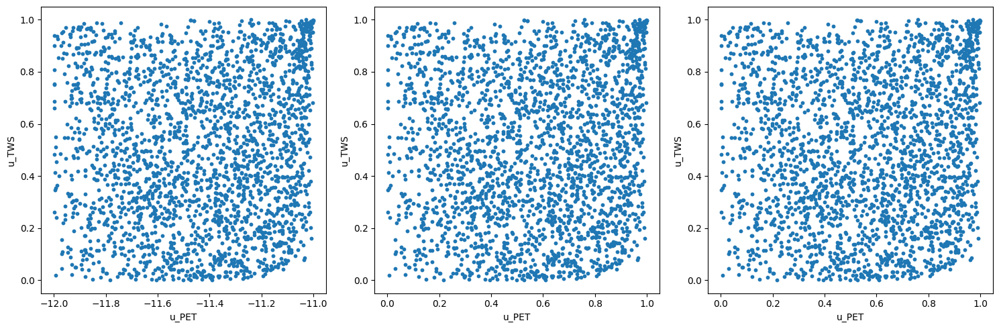

In [131]:
# Plot scatter plots of sampled data
fig, axes = plt.subplots(1, 3, figsize=(15, 5))
axes[0].scatter(copula_dat[:, 0], copula_dat[:, 1], s=10)
axes[0].set_xlabel('u_PET')
axes[0].set_ylabel('u_TWS')
axes[1].scatter(copula_dat[:, 0], copula_dat[:, 1], s=10)
axes[1].set_xlabel('u_PET')
axes[1].set_ylabel('u_TWS')
axes[2].scatter(copula_dat[:, 0], copula_dat[:, 1], s=10)
axes[2].set_xlabel('u_PET')
axes[2].set_ylabel('u_TWS')
plt.tight_layout()
plt.show()

In [127]:
#  Step 7: Fit Copulas
subregion_id = 1

# Define Copulas (assuming these are from a library like 'copulae')
copulas = {
    'Gaussian': GaussianCopula(dim=2),
    'Clayton': ClaytonCopula(dim=2),
    'Frank': FrankCopula(dim=2),
    'Gumbel': GumbelCopula(dim=2),
    'tCopula': StudentCopula(dim=2)
}

# Fit Copulas
results = {}
for name, copula in copulas.items():
    try:
        print(f'Fitting {name}...')
        start_time = time.time()
        copula.fit(copula_data)  # Assuming copula_data is defined elsewhere
        log_likelihood = copula.log_lik(copula_data)
        # Calculate AIC: -2 * log_likelihood + 2 * number_of_parameters
        num_params = copula.dim  # Adjust based on your copula library's parameter count
        aic = -2 * log_likelihood + 2 * num_params
        results[name] = {'copula': copula, 'log_likelihood': log_likelihood, 'AIC': aic}
        print(f"{name} Copula fitted for subregion {subregion_id}, log-likelihood: {log_likelihood:.2f}")
    except Exception as e:
        print(f"Failed to fit {name} Copula: {e}")

# Select best copula
if results:
    best_copula_name = max(results, key=lambda x: results[x]['log_likelihood'])  # Fixed key
    best_copula = results[best_copula_name]['copula']
    print(f"Best copula (by log_likelihood): {best_copula_name} (log_likelihood: {results[best_copula_name]['log_likelihood']:.2f})")
else:
    print("No copulas were successfully fitted to the data.")


# Total runtime
end_time = time.time()
print(f"Total runtime: {end_time - start_time:.2f} seconds.")

Fitting Gaussian...
Gaussian Copula fitted for subregion 1, log-likelihood: 202.69
Fitting Clayton...
Clayton Copula fitted for subregion 1, log-likelihood: 6.74
Fitting Frank...
Frank Copula fitted for subregion 1, log-likelihood: 114.80
Fitting Gumbel...
Gumbel Copula fitted for subregion 1, log-likelihood: 529.83
Fitting tCopula...
tCopula Copula fitted for subregion 1, log-likelihood: 315.10
Best copula (by AIC): Gumbel (AIC: -1055.66)
Total runtime: 74.91 seconds.


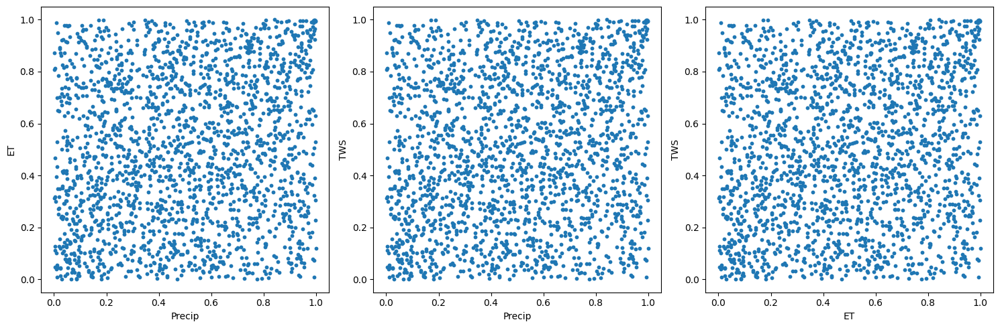

In [129]:
# Generate samples and plot
sample = best_copula.random(2000)
fig, axes = plt.subplots(1, 3, figsize=(15, 5))
axes[0].scatter(sample[:,0], sample[:,1], s=10)
axes[0].set_xlabel('Precip')
axes[0].set_ylabel('ET')
axes[1].scatter(sample[:,0], sample[:,1], s=10)
axes[1].set_xlabel('Precip')
axes[1].set_ylabel('TWS')
axes[2].scatter(sample[:,0], sample[:,1], s=10)
axes[2].set_xlabel('ET')
axes[2].set_ylabel('TWS')
plt.tight_layout()
plt.show()

In [29]:
# Step 6: Prepare Data for Copula Fitting
copula_data = sampled_df_in_memory[['u_PET', 'u_TWS']].values
print("Copula data shape:", copula_data.shape)
print("Copula data min/max:", copula_data.min(), copula_data.max())
print("Copula data NaN count:", np.isnan(copula_data).sum())
print("First 5 rows:\n", copula_data[:5])

# Check correlations
corr = np.corrcoef(copula_data.T)
print("Correlation matrix:\n", corr)

# Check variability
stds = copula_data.std(axis=0)
print("Standard deviations:", stds)
if any(stds < 1e-5):
    print("Warning: Low variability in some variables, Copula fitting may fail")
    raise ValueError("Copula data lacks variability")

#

Copula data shape: (21950, 2)
Copula data min/max: 1.9979024687947615e-05 0.9999882584808757
Copula data NaN count: 0
First 5 rows:
 [[0.98309183 0.36813468]
 [0.881909   0.39591378]
 [0.56576192 0.81596675]
 [0.14840567 0.2621114 ]
 [0.29449466 0.83907174]]
Correlation matrix:
 [[1.         0.08389291]
 [0.08389291 1.        ]]
Standard deviations: [0.2688942  0.28915561]


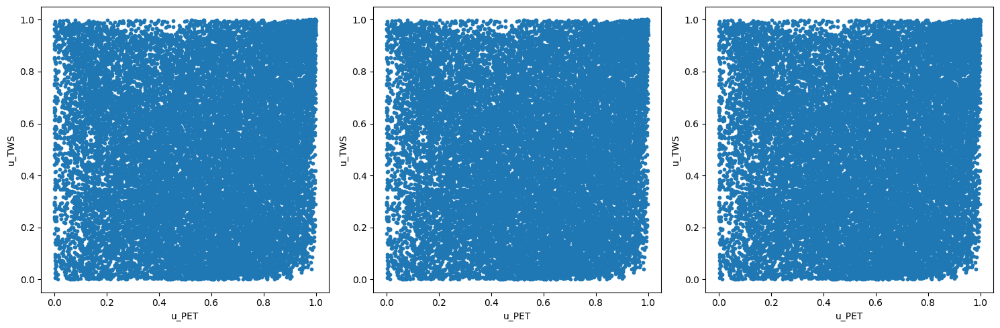

In [30]:
# Plot scatter plots of sampled data
fig, axes = plt.subplots(1, 3, figsize=(15, 5))
axes[0].scatter(copula_data[:, 0], copula_data[:, 1], s=10)
axes[0].set_xlabel('u_PET')
axes[0].set_ylabel('u_TWS')
axes[1].scatter(copula_data[:, 0], copula_data[:, 1], s=10)
axes[1].set_xlabel('u_PET')
axes[1].set_ylabel('u_TWS')
axes[2].scatter(copula_data[:, 0], copula_data[:, 1], s=10)
axes[2].set_xlabel('u_PET')
axes[2].set_ylabel('u_TWS')
plt.tight_layout()
plt.show()

In [31]:
#  Step 7: Fit Copulas
subregion_id = 1

# Define Copulas (assuming these are from a library like 'copulae')
copulas = {
    'Gaussian': GaussianCopula(dim=2),
    'Clayton': ClaytonCopula(dim=2),
    'Frank': FrankCopula(dim=2),
    'Gumbel': GumbelCopula(dim=2),
    'tCopula': StudentCopula(dim=2)
}

# Fit Copulas
results = {}
for name, copula in copulas.items():
    try:
        print(f'Fitting {name}...')
        start_time = time.time()
        copula.fit(copula_data)  # Assuming copula_data is defined elsewhere
        log_likelihood = copula.log_lik(copula_data)
        # Calculate AIC: -2 * log_likelihood + 2 * number_of_parameters
        num_params = copula.dim  # Adjust based on your copula library's parameter count
        aic = -2 * log_likelihood + 2 * num_params
        results[name] = {'copula': copula, 'log_likelihood': log_likelihood, 'AIC': aic}
        print(f"{name} Copula fitted for subregion {subregion_id}, log-likelihood: {log_likelihood:.2f}")
    except Exception as e:
        print(f"Failed to fit {name} Copula: {e}")

# Select best copula
if results:
    best_copula_name = max(results, key=lambda x: results[x]['log_likelihood'])  # Fixed key
    best_copula = results[best_copula_name]['copula']
    print(f"Best copula (by AIC): {best_copula_name} (AIC: {results[best_copula_name]['AIC']:.2f})")
else:
    print("No copulas were successfully fitted to the data.")


# Total runtime
end_time = time.time()
print(f"Total runtime: {end_time - start_time:.2f} seconds.")

Fitting Gaussian...
Gaussian Copula fitted for subregion 1, log-likelihood: 202.69
Fitting Clayton...
Clayton Copula fitted for subregion 1, log-likelihood: 6.74
Fitting Frank...
Frank Copula fitted for subregion 1, log-likelihood: 114.80
Fitting Gumbel...
Gumbel Copula fitted for subregion 1, log-likelihood: 529.83
Fitting tCopula...
tCopula Copula fitted for subregion 1, log-likelihood: 315.10
Best copula (by AIC): Gumbel (AIC: -1055.66)
Total runtime: 79.14 seconds.


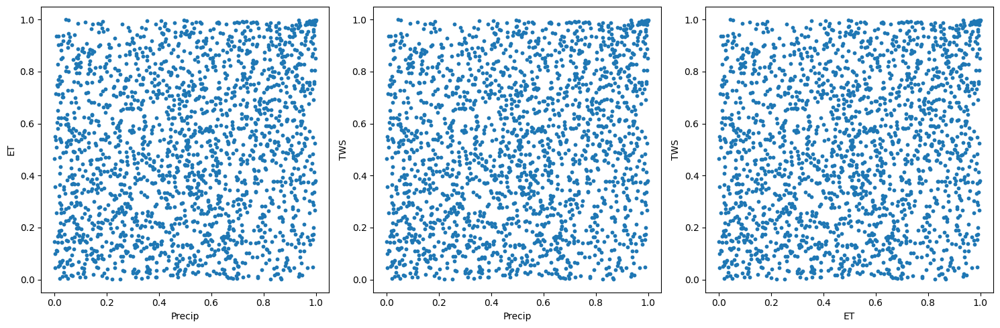

In [32]:
# Generate samples and plot
sample = best_copula.random(2000)
fig, axes = plt.subplots(1, 3, figsize=(15, 5))
axes[0].scatter(sample[:,0], sample[:,1], s=10)
axes[0].set_xlabel('Precip')
axes[0].set_ylabel('ET')
axes[1].scatter(sample[:,0], sample[:,1], s=10)
axes[1].set_xlabel('Precip')
axes[1].set_ylabel('TWS')
axes[2].scatter(sample[:,0], sample[:,1], s=10)
axes[2].set_xlabel('ET')
axes[2].set_ylabel('TWS')
plt.tight_layout()
plt.show()

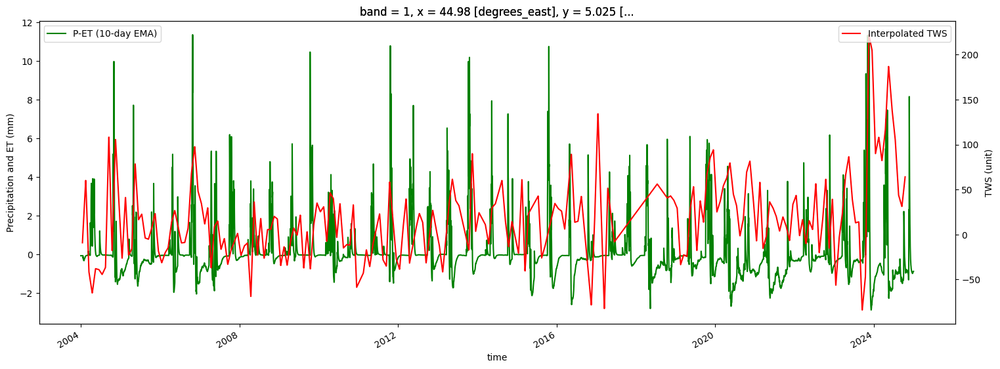

In [22]:
import matplotlib.pyplot as plt

# Set up the figure
plt.figure(figsize=(18, 6))

# Create the first axis for ppt and et
ax1 = plt.gca()  # Get current axis
# variables.ppt.sel(y=5, x=45, method='nearest').plot(ax=ax1, label='Smoothed P (10-day EMA)', color='blue')
variables.pet.sel(y=5, x=45, method='nearest').plot(ax=ax1, label='P-ET (10-day EMA)', color='green')

# Customize the first axis
ax1.set_ylabel('Precipitation and ET (mm)')  # Assuming ppt and et are in mm
ax1.legend(loc='upper left')

# Create the second axis for tws
ax2 = ax1.twinx()
variables.tws.sel(y=5, x=45, method='nearest').plot(ax=ax2, label='Interpolated TWS', color='red')

# Customize the second axis
ax2.set_ylabel('TWS (unit)')  # Replace 'unit' with the actual unit of tws
ax2.legend(loc='upper right')

# Show the plot
plt.show()

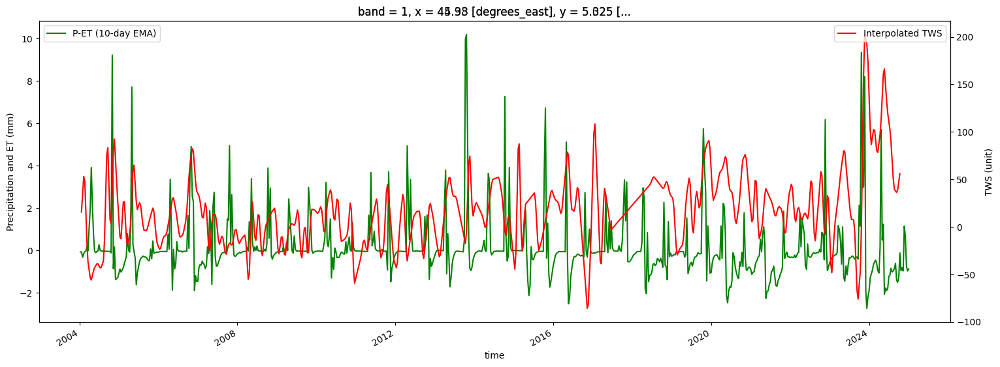

In [221]:
import matplotlib.pyplot as plt

# Set up the figure
plt.figure(figsize=(18, 6))

# Create the first axis for ppt and et
ax1 = plt.gca()  # Get current axis
# variables.ppt.sel(y=5, x=45, method='nearest').plot(ax=ax1, label='Smoothed P (10-day EMA)', color='blue')
variables.pet.sel(y=5, x=45, method='nearest').plot(ax=ax1, label='P-ET (10-day EMA)', color='green')

# Customize the first axis
ax1.set_ylabel('Precipitation and ET (mm)')  # Assuming ppt and et are in mm
ax1.legend(loc='upper left')

# Create the second axis for tws
ax2 = ax1.twinx()
variable.tws.sel(y=lat, x=lon, method='nearest').plot(ax=ax2, label='Interpolated TWS', color='red')

# Customize the second axis
ax2.set_ylabel('TWS (unit)')  # Replace 'unit' with the actual unit of tws
ax2.legend(loc='upper right')

# Show the plot
plt.show()

#### Spatial Plots

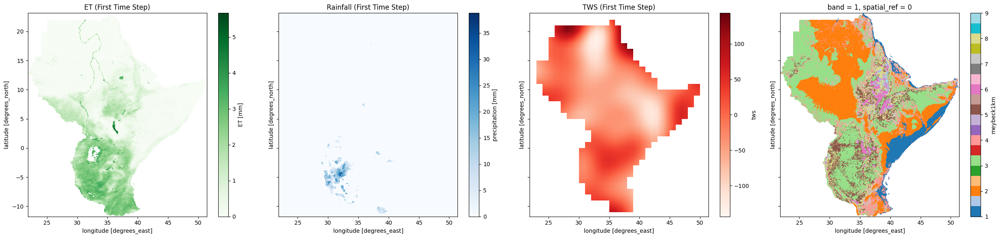

In [7]:
# Plot the regrided datasets

et2 = variables.et.isel(time=0)
precip2 = variables.precipitation.isel(time=0)
tws2 = variables.tws.isel(time=15)


# Set up the figure and axes (1 row, 3 columns)
fig, axes = plt.subplots(1, 4, figsize=(25, 6), sharey=True)


# Plot ET
et2.plot(ax=axes[0], cmap="Greens", add_colorbar=True)
axes[0].set_title("ET (First Time Step)")

# Plot Rainfall
precip2.plot(ax=axes[1], cmap="Blues", add_colorbar=True)
axes[1].set_title("Rainfall (First Time Step)")

# Plot TWS
tws2.plot(ax=axes[2], cmap="Reds", add_colorbar=True)
axes[2].set_title("TWS (First Time Step)")

variables.landform.plot(ax=axes[3], cmap="tab20", add_colorbar=True)

plt.tight_layout()
plt.show()

#### Select 10-day time step

In [5]:
# Generate dekadal dates (1-10, 11-20, 21-end)
def get_dekadal_dates(start_date, end_date):
    dates = date_range(start=start_date, end=end_date, freq="D")
    dekadal_dates = []
    for year in range(dates[0].year, dates[-1].year + 1):
        for month in range(1, 13):
            last_day = (to_datetime(f"{year}-{month+1}-01") - pd.Timedelta(days=1)).day if month < 12 else 31
            if month == 2:
                last_day = 29 if pd.Timestamp(year, 2, 1).is_leap_year else 28
            dekadal_dates.extend([
                pd.Timestamp(year, month, 10),  # 1st-10th
                pd.Timestamp(year, month, 20),  # 11th-20th
                pd.Timestamp(year, month, last_day)  # 21st-end
            ])
    return xr.DataArray(dekadal_dates, dims=["time"], coords={"time": dekadal_dates})

In [6]:
# Dekadal time for your range
dekadal_time = get_dekadal_dates("2004-01-01", "2024-12-31")

# Extract dekadal values
ds_precip_dekadal = variables["precipitation"].sel(time=dekadal_time, method="nearest")
ds_et_dekadal = variables["et"].sel(time=dekadal_time, method="nearest")
ds_tws_dekadal = variables["tws"].sel(time=dekadal_time, method="nearest")
ds_landform = variables["landform"]  # Static, no time dim

In [7]:
print(ds_tws_dekadal)

<xarray.DataArray 'tws' (time: 756, y: 698, x: 591)>
dask.array<getitem, shape=(756, 698, 591), dtype=float64, chunksize=(756, 175, 148), chunktype=numpy.ndarray>
Coordinates:
    band         int64 ...
  * x            (x) float64 21.88 21.93 21.98 22.03 ... 51.23 51.28 51.33 51.38
  * y            (y) float64 23.12 23.07 23.02 22.97 ... -11.63 -11.68 -11.73
  * time         (time) datetime64[ns] 2004-01-10 2004-01-20 ... 2024-12-31
    spatial_ref  int64 ...
    lat          (y) float64 dask.array<chunksize=(175,), meta=np.ndarray>
    lon          (x) float64 dask.array<chunksize=(148,), meta=np.ndarray>


In [8]:
# Merge dekadal dataset
ds_combined = xr.Dataset({
    "tws": ds_tws_dekadal,
    "et": ds_et_dekadal,
    "ppt": ds_precip_dekadal,
    "landform": variables.landform
})

In [28]:
print(ds_combined)

<xarray.Dataset>
Dimensions:      (x: 591, y: 698, time: 756)
Coordinates:
    band         int64 1
  * x            (x) float64 21.88 21.93 21.98 22.03 ... 51.23 51.28 51.33 51.38
  * y            (y) float64 23.12 23.07 23.02 22.97 ... -11.63 -11.68 -11.73
  * time         (time) datetime64[ns] 2004-01-10 2004-01-20 ... 2024-12-31
    spatial_ref  int64 0
    lat          (y) float64 23.12 23.07 23.02 22.97 ... -11.63 -11.68 -11.73
    lon          (x) float64 21.88 21.93 21.98 22.03 ... 51.23 51.28 51.33 51.38
Data variables:
    tws          (time, y, x) float64 ...
    et           (time, y, x) float64 ...
    ppt          (time, y, x) float32 ...
    landform     (y, x) float64 ...


#### Timeseries Visualisation

In [205]:
lat = 5.34
lon = 45.34

et_poi = ds_et_dekadal.sel(y=lat, x=lon, method='nearest')
pre_poi = ds_precip_dekadal.sel(y=lat, x=lon, method='nearest')
tws_poi = ds_tws_dekadal.sel(y=lat, x=lon, method='nearest')

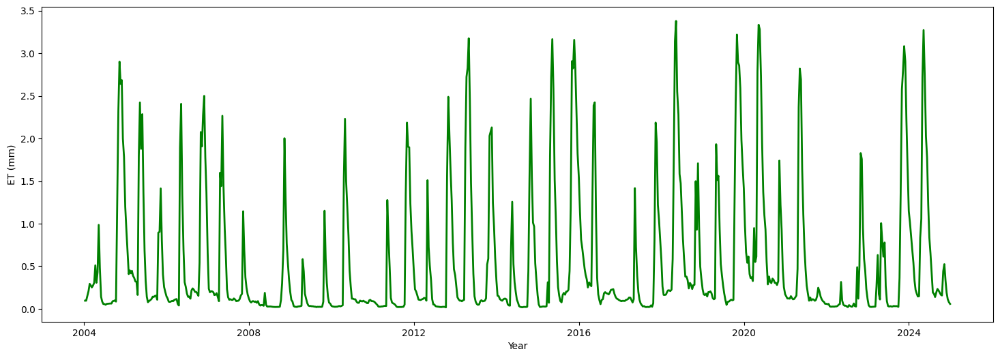

In [206]:
plt.figure(figsize=(18, 6))  # Adjust width and height as needed
plt.plot(et_poi.time, et_poi.values, color='green', linewidth=2)
plt.xlabel("Year")
plt.ylabel("ET (mm)")
# plt.title("Time Series Plot")
plt.show()

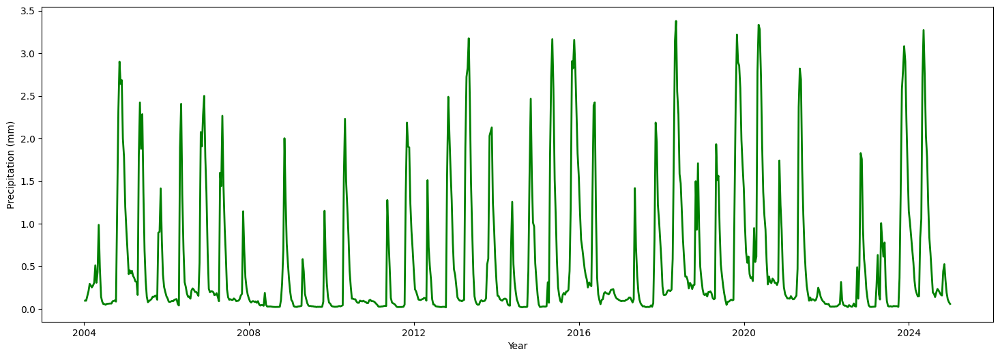

In [18]:
plt.figure(figsize=(18, 6))  # Adjust width and height as needed
plt.plot(et_poi.time, et_poi.values, color='green', linewidth=2)
plt.xlabel("Year")
plt.ylabel("Precipitation (mm)")
# plt.title("Time Series Plot")
plt.show()

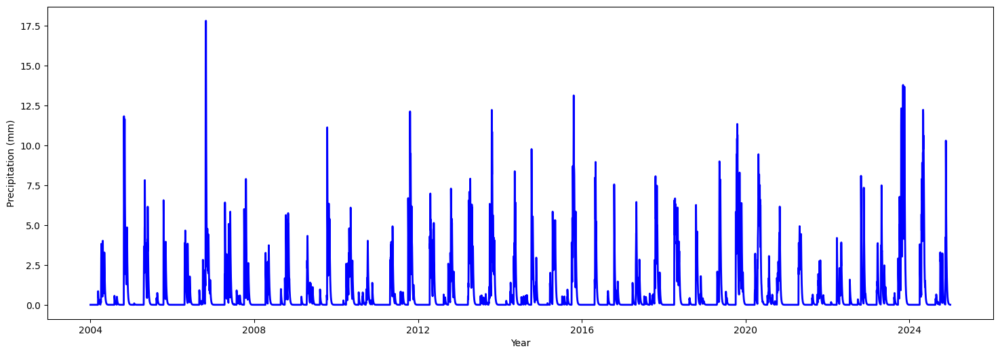

In [81]:
plt.figure(figsize=(18, 6))  # Adjust width and height as needed
plt.plot(pre_poi.time, pre_poi.values, color='blue', linewidth=2)
plt.xlabel("Year")
plt.ylabel("Precipitation (mm)")
# plt.title("Time Series Plot")
plt.show()

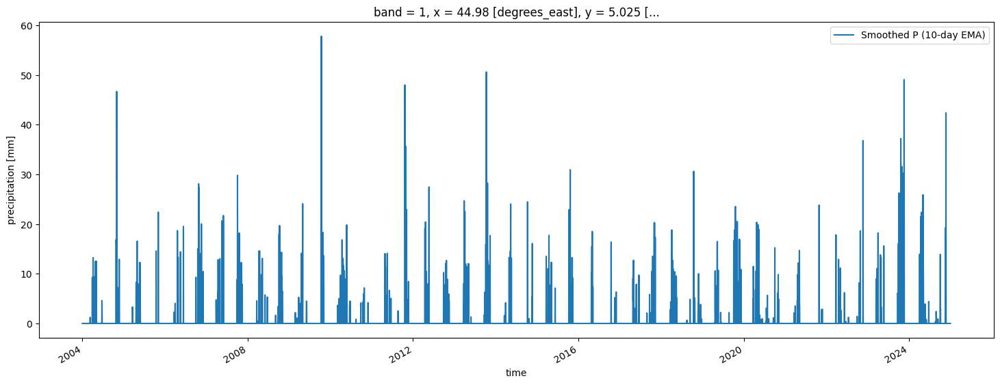

In [8]:
lat = 5
lon = 45
plt.figure(figsize=(18, 6))
precipitation_data.sel(y=lat, x=lon, method='nearest').plot(label='Smoothed P (10-day EMA)')
# et_smoothed.sel(y=lat, x=lon, method='nearest').plot(label='Smoothed ET (10-day EMA)')
# tws_daily.sel(y=5, x=45, method='nearest').plot(label='Interpolated TWS')
plt.legend()
plt.show()



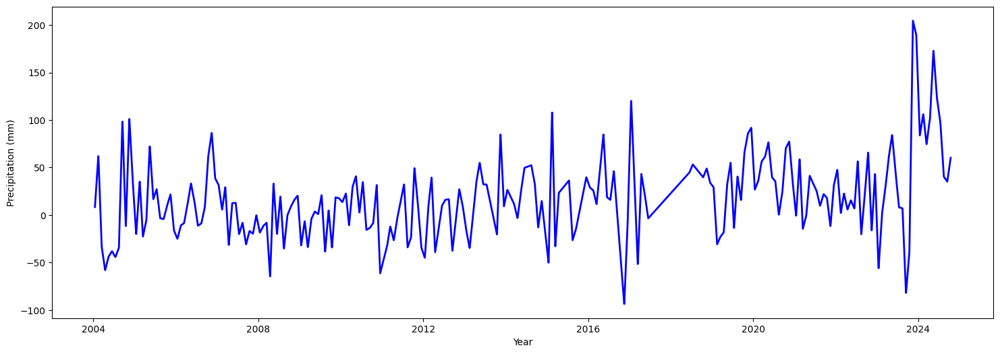

In [45]:
plt.figure(figsize=(18, 6))  # Adjust width and height as needed
plt.plot(tws_poi.time, tws_poi.values, color='blue', linewidth=2)
plt.xlabel("Year")
plt.ylabel("Precipitation (mm)")
# plt.title("Time Series Plot")
plt.show()

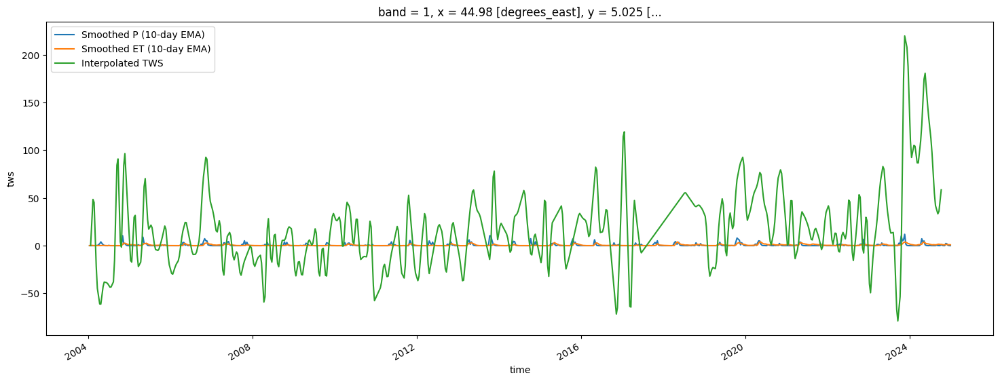

In [24]:
lat = 5
lon = 45
plt.figure(figsize=(18, 6))
ds_combined.ppt.sel(y=lat, x=lon, method='nearest').plot(label='Smoothed P (10-day EMA)')
ds_combined.et.sel(y=lat, x=lon, method='nearest').plot(label='Smoothed ET (10-day EMA)')
ds_combined.tws.sel(y=5, x=45, method='nearest').plot(label='Interpolated TWS')
plt.legend()
plt.show()

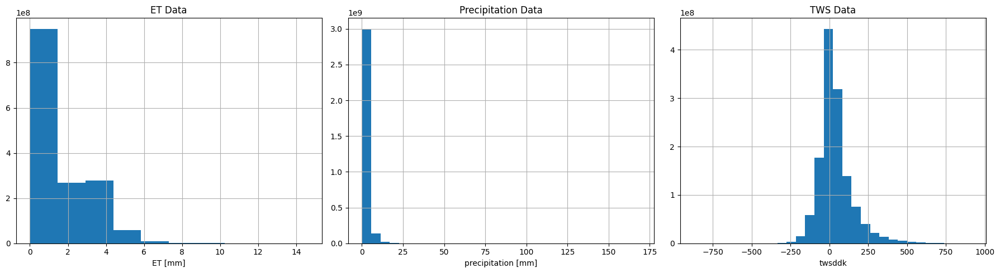

In [53]:
# Histogram distribution
fig, axes = plt.subplots(1, 3, figsize=(18, 5), sharey=False)

et.plot.hist(ax=axes[0], bins=10)
axes[0].grid(True)
axes[0].set_title('ET Data')

precipitation.plot.hist(ax=axes[1], bins=30)
axes[1].grid(True)
axes[1].set_title('Precipitation Data')

tws.plot.hist(ax=axes[2], bins=30)
axes[2].grid(True)
axes[2].set_title('TWS Data')

plt.tight_layout()
plt.show()

### Subzone Processing

In [119]:
print("Precipitation data type:", type(variables['et'].data))
print("Variables memory usage (GB):", variables.nbytes / 1e9)

Precipitation data type: <class 'dask.array.core.Array'>
Variables memory usage (GB): 88.607298336


#### Stacked dims Approach

In [74]:
#stack varaibles over x,y
dsst=variables.stack(yx=['y','x'])
month = variables.time.dt.month

In [76]:
display((dsst))

<xarray.Dataset>
Dimensions:        (time: 7671, yx: 412518)
Coordinates:
    band           int64 ...
  * time           (time) datetime64[ns] 2004-01-01 2004-01-02 ... 2024-12-31
    spatial_ref    int64 ...
    lat            (yx) float64 dask.array<chunksize=(103425,), meta=np.ndarray>
    lon            (yx) float64 dask.array<chunksize=(102834,), meta=np.ndarray>
  * yx             (yx) object MultiIndex
  * y              (yx) float64 23.12 23.12 23.12 23.12 ... -11.73 -11.73 -11.73
  * x              (yx) float64 21.88 21.93 21.98 22.03 ... 51.28 51.33 51.38
Data variables:
    precipitation  (time, yx) float32 dask.array<chunksize=(500, 25413), meta=np.ndarray>
    et             (time, yx) float64 dask.array<chunksize=(500, 25413), meta=np.ndarray>
    tws            (time, yx) float64 dask.array<chunksize=(500, 25413), meta=np.ndarray>
    landform       (yx) float64 dask.array<chunksize=(25413,), meta=np.ndarray>

In [85]:

for region_val in range(9):
    idx=dsst.landform == region_val
    
    region_et_mean=dsst.et[:,idx].groupby('time.month').mean(skipna=True)
    region_et_std=dsst.et[:,idx].groupby('time.month').std(skipna=True)
    
#     #apply normalization
#     dsst.et[:,idx]-=region_et_mean.sel(month=month)
#     dsst.et[:,idx]/=region_et_std.sel(month=month)
#     break
# dsvarnew=dsst.unstack('yx')

In [ ]:
display(dsvarnew)

In [67]:
region_et_mean.compute()

<xarray.DataArray 'et' ()>
array(2.20386291)
Coordinates:
    band         int64 1
    spatial_ref  int64 0

#### Anomalies calculated on Chunk

In [21]:
# Anomaly function for stacked data
def calc_standardized_anomalies(data, var_name):
    month = data.time.dt.month
    monthly_clim = data[var_name].groupby('time.month').mean('time', skipna=True)
    monthly_std = data[var_name].groupby('time.month').std('time', skipna=True)
    monthly_std = monthly_std.where(monthly_std > 0, 1e-6)
    anomaly = data[var_name] - monthly_clim.sel(month=month)
    standardized_anomaly = anomaly / monthly_std.sel(month=month)
    return standardized_anomaly

In [22]:
# Process subregions and combine into one dataset
landform_classes = np.unique(variables['landform'].values[~np.isnan(variables['landform'].values)])
print('Extracted Landform classes')
subregion_list = []
with dask.config.set(**{'array.slicing.split_large_chunks': False}):
    for subregion_id in landform_classes[:3]:
        if np.isnan(subregion_id):
            continue
        print(f"Processing subregion {subregion_id}...")

        # Extract subregion
        mask = variables['landform'] == subregion_id
        subregion_ds = variables.where(mask, drop=True)

        # Stack spatial dimensions
        stacked_ds = subregion_ds.stack(points=['y', 'x'])

        # Debug raw data
        print(f"Subregion {subregion_id} raw stats:")
        print(f"PPET min/max: {stacked_ds['pet'].min().values:.2f}/{stacked_ds['pet'].max().values:.2f}")
        print(f"PPET NaN count: {stacked_ds['pet'].isnull().sum().compute()}")

        # Compute anomalies on stacked data
        stacked_ds['pet_anom'] = calc_standardized_anomalies(stacked_ds, 'pet')
        stacked_ds['tws_anom'] = calc_standardized_anomalies(stacked_ds, 'tws')

        # Add subregion coordinate
        stacked_ds = stacked_ds.assign_coords(subregion=int(subregion_id)).expand_dims('subregion')
        subregion_list.append(stacked_ds)

# Combine all subregions into one dataset
all_subregions_ds= xr.concat(subregion_list, dim='subregion')

# Inspect combined dataset
print("Combined subregions dataset:")
print(all_subregions_ds)
%time

Extracted Landform classes
Processing subregion 1.0...
Subregion 1.0 raw stats:
PPET min/max: -14.40/166.88
PPET NaN count: <xarray.DataArray 'pet' ()>
array(1641340885)
Coordinates:
    band         int64 1
    spatial_ref  int64 0


/home/jovyan/.local/lib/python3.8/site-packages/xarray/core/indexing.py:1379: PerformanceWarning: Slicing with an out-of-order index is generating 21 times more chunks
  return self.array[key]
/home/jovyan/.local/lib/python3.8/site-packages/xarray/core/indexing.py:1379: PerformanceWarning: Slicing with an out-of-order index is generating 21 times more chunks
  return self.array[key]
/home/jovyan/.local/lib/python3.8/site-packages/xarray/core/indexing.py:1379: PerformanceWarning: Slicing with an out-of-order index is generating 21 times more chunks
  return self.array[key]
/home/jovyan/.local/lib/python3.8/site-packages/xarray/core/indexing.py:1379: PerformanceWarning: Slicing with an out-of-order index is generating 21 times more chunks
  return self.array[key]


Processing subregion 2.0...
Subregion 2.0 raw stats:
PPET min/max: -14.49/99.15
PPET NaN count: <xarray.DataArray 'pet' ()>
array(2402861498)
Coordinates:
    band         int64 1
    spatial_ref  int64 0


/home/jovyan/.local/lib/python3.8/site-packages/xarray/core/indexing.py:1379: PerformanceWarning: Slicing with an out-of-order index is generating 21 times more chunks
  return self.array[key]
/home/jovyan/.local/lib/python3.8/site-packages/xarray/core/indexing.py:1379: PerformanceWarning: Slicing with an out-of-order index is generating 21 times more chunks
  return self.array[key]
/home/jovyan/.local/lib/python3.8/site-packages/xarray/core/indexing.py:1379: PerformanceWarning: Slicing with an out-of-order index is generating 21 times more chunks
  return self.array[key]
/home/jovyan/.local/lib/python3.8/site-packages/xarray/core/indexing.py:1379: PerformanceWarning: Slicing with an out-of-order index is generating 21 times more chunks
  return self.array[key]


Processing subregion 3.0...
Subregion 3.0 raw stats:
PPET min/max: -10.66/96.02
PPET NaN count: <xarray.DataArray 'pet' ()>
array(2521100083)
Coordinates:
    band         int64 1
    spatial_ref  int64 0


/home/jovyan/.local/lib/python3.8/site-packages/xarray/core/indexing.py:1379: PerformanceWarning: Slicing with an out-of-order index is generating 21 times more chunks
  return self.array[key]
/home/jovyan/.local/lib/python3.8/site-packages/xarray/core/indexing.py:1379: PerformanceWarning: Slicing with an out-of-order index is generating 21 times more chunks
  return self.array[key]
/home/jovyan/.local/lib/python3.8/site-packages/xarray/core/indexing.py:1379: PerformanceWarning: Slicing with an out-of-order index is generating 21 times more chunks
  return self.array[key]
/home/jovyan/.local/lib/python3.8/site-packages/xarray/core/indexing.py:1379: PerformanceWarning: Slicing with an out-of-order index is generating 21 times more chunks
  return self.array[key]
/home/jovyan/.local/lib/python3.8/site-packages/xarray/core/indexing.py:1379: PerformanceWarning: Slicing is producing a large chunk. To accept the large
chunk and silence this warning, set the option
    >>> with dask.config.se

Combined subregions dataset:
<xarray.Dataset>
Dimensions:        (time: 7671, points: 410198, subregion: 3)
Coordinates:
  * time           (time) datetime64[ns] 2004-01-01 2004-01-02 ... 2024-12-31
  * points         (points) object MultiIndex
  * y              (points) float64 -11.73 -11.73 -11.73 ... 23.12 23.12 23.12
  * x              (points) float64 23.28 23.33 23.38 ... 51.28 51.33 51.38
  * subregion      (subregion) int64 1 2 3
    band           int64 1
    spatial_ref    int64 0
    lat            (subregion, points) float64 dask.array<chunksize=(1, 101919), meta=np.ndarray>
    lon            (subregion, points) float64 dask.array<chunksize=(1, 103099), meta=np.ndarray>
    month          (time) int64 1 1 1 1 1 1 1 1 1 ... 12 12 12 12 12 12 12 12 12
Data variables:
    precipitation  (subregion, time, points) float32 dask.array<chunksize=(1, 7671, 25269), meta=np.ndarray>
    et             (subregion, time, points) float64 dask.array<chunksize=(1, 7671, 25269), meta=np.n

In [121]:
# all_subregions_ds = all_subregions_ds.unstack('points')
subregion_1 = all_subregions_ds.isel(subregion=0)
subregion_2 = all_subregions_ds.isel(subregion=1)
subregion_3 = all_subregions_ds.isel(subregion=2)

In [123]:
print(subregion_1)

<xarray.Dataset>
Dimensions:        (y: 698, x: 590, time: 7671)
Coordinates:
  * y              (y) float64 -11.73 -11.68 -11.63 -11.58 ... 23.02 23.07 23.12
  * x              (x) float64 21.88 21.93 21.98 22.03 ... 51.28 51.33 51.38
  * time           (time) datetime64[ns] 2004-01-01 2004-01-02 ... 2024-12-31
    subregion      int64 1
    band           int64 1
    spatial_ref    int64 0
    lat            (y, x) float64 dask.array<chunksize=(173, 590), meta=np.ndarray>
    lon            (y, x) float64 dask.array<chunksize=(175, 590), meta=np.ndarray>
    month          (time) int64 1 1 1 1 1 1 1 1 1 ... 12 12 12 12 12 12 12 12 12
Data variables:
    precipitation  (time, y, x) float32 dask.array<chunksize=(7671, 43, 590), meta=np.ndarray>
    et             (time, y, x) float64 dask.array<chunksize=(7671, 43, 590), meta=np.ndarray>
    tws            (time, y, x) float64 dask.array<chunksize=(7671, 43, 590), meta=np.ndarray>
    landform       (y, x) float64 dask.array<chunksize=

In [124]:
pet_data = subregion_1['pet_anom'].values.flatten()
tws_data = subregion_1['tws_anom'].values.flatten()

# Optional: Remove NaN values if they exist
mask = ~np.isnan(pet_data) & ~np.isnan(tws_data)
pet_data = pet_data[mask]
tws_data = tws_data[mask]



NameError: name 'spearmanr' is not defined

In [126]:
from scipy.stats import spearmanr, kendalltau
# 1. Calculate Spearman's rank correlation coefficient
spearman_corr, spearman_p = spearmanr(pet_data, tws_data)
print("Spearman correlation:", spearman_corr)
print("Spearman p-value:", spearman_p)

# 2. Calculate Kendall's tau correlation coefficient
kendall_corr, kendall_p = kendalltau(pet_data, tws_data)
print("Kendall tau correlation:", kendall_corr)
print("Kendall tau p-value:", kendall_p)

Spearman correlation: -0.06908732949767124
Spearman p-value: 0.0
Kendall tau correlation: -0.046486678844667256
Kendall tau p-value: 0.0


In [129]:
len(pet_data)

48778444

<AxesSubplot: ylabel='Count'>

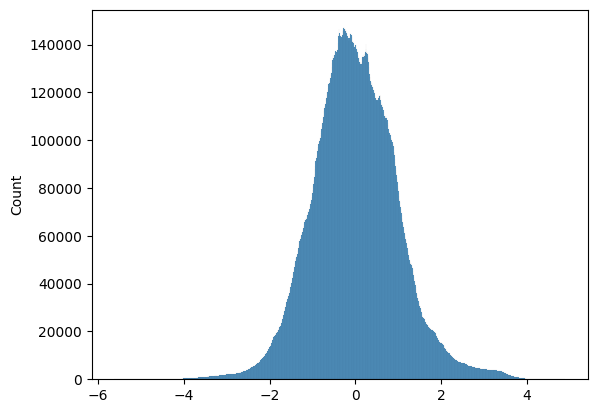

In [130]:
sns.histplot(tws_data)

### Anomalies calculated `WITHOUT` Chunk

In [5]:
# Anomaly function for stacked data
def calc_standardized_anomalies(data, var_name):
    month = data.time.dt.month
    monthly_clim = data[var_name].groupby('time.month').mean('time', skipna=True)
    monthly_std = data[var_name].groupby('time.month').std('time', skipna=True)
    anomaly = data[var_name] - monthly_clim.sel(month=month)
    standardized_anomaly = anomaly / monthly_std.sel(month=month)
    return standardized_anomaly

In [ ]:
# Process subregions and combine into one dataset
landform_classes = np.unique(input_vars['landform'].values[~np.isnan(input_vars['landform'].values)])
subregion_list = []

for subregion_id in landform_classes[:2]:
    if np.isnan(subregion_id):
        continue
    print(f"Processing subregion {subregion_id}...")
    
    # Extract subregion
    mask = input_vars['landform'] == subregion_id
    subregion_ds = input_vars.where(mask, drop=True)
    
    # Stack spatial dimensions
    stacked_ds = subregion_ds.stack(points=['lat', 'lon'])
    
    # Debug raw data
    print(f"Subregion {subregion_id} raw stats:")
    print(f"Precip min/max: {stacked_ds['precipitation'].min().values:.2f}/{stacked_ds['precipitation'].max().values:.2f}")
    print(f"Precip NaN count: {stacked_ds['precipitation'].isnull().sum().values}")
    
    # Compute anomalies on stacked data
    stacked_ds['precip_anom'] = calc_standardized_anomalies(stacked_ds, 'precipitation')
    stacked_ds['et_anom'] = calc_standardized_anomalies(stacked_ds, 'et')
    stacked_ds['tws_anom'] = calc_standardized_anomalies(stacked_ds, 'tws')
    
    # Add subregion coordinate
    stacked_ds = stacked_ds.assign_coords(subregion=int(subregion_id)).expand_dims('subregion')
    subregion_list.append(stacked_ds)

# Combine all subregions into one dataset
all_subregions_ds_sample = xr.concat(subregion_list, dim='subregion')

# Inspect combined dataset
print("Combined subregions dataset:")
print(all_subregions_ds_sample)

# # Plot example: subregion 2, first point
# subregion_2 = all_subregions_ds_sample.sel(subregion=2)
# subregion_2['precip_anom'].isel(points=0).plot(label='Precip Anomaly')
# subregion_2['et_anom'].isel(points=0).plot(label='ET Anomaly')
# subregion_2['tws_anom'].isel(points=0).plot(label='TWS Anomaly')
# plt.legend()
# plt.title("Standardized Anomalies (Subregion 2, First Point)")
# plt.show()

%time

Processing subregion 1.0...


In [146]:
# Save sampled CDFs
np.savez(f"sampled_cdf_region_3.npz", x_vals=sampled_x, y_vals=sampled_y)

### Standardization Anomalies [Original Data]

In [7]:
def calc_standardized_anomalies(data, var_name):
    month = data.time.dt.month
    monthly_clim = data[var_name].groupby('time.month').mean('time', skipna=True)
    monthly_std = data[var_name].groupby('time.month').std('time', skipna=True)

    anomaly = data[var_name] - monthly_clim.sel(month=month)
    standardized_anomaly = anomaly / monthly_std.sel(month=month)
    
    return standardized_anomaly


In [52]:
# Apply to each subregion
for subregion_id, ds in subregion_datasets.items():
    ds['tws_anom'] = calc_standardized_anomalies(ds, 'tws')
    ds['precip_anom'] = calc_standardized_anomalies(ds, 'precip')
    ds['et_anom'] = calc_standardized_anomalies(ds, 'et')
    
    # Update the dataset
    subregion_datasets[subregion_id] = ds

# Check anomalies for subregion 1
print(subregion_datasets[1][['tws_anom', 'precip_anom', 'et_anom']])
%time

<xarray.Dataset>
Dimensions:      (y: 671, x: 337, time: 219)
Coordinates:
  * time         (time) datetime64[ns] 2004-01-15T12:00:00 ... 2024-10-15T12:...
    lat          (y) float64 23.12 23.07 23.02 22.97 ... -11.28 -11.33 -11.38
    lon          (x) float64 30.33 30.38 30.48 30.53 ... 51.18 51.28 51.33 51.38
    band         int64 1
  * y            (y) float64 23.12 23.07 23.02 22.97 ... -11.28 -11.33 -11.38
  * x            (x) float64 30.33 30.38 30.48 30.53 ... 51.18 51.28 51.33 51.38
    spatial_ref  int64 0
    month        (time) int64 1 2 3 4 5 6 7 8 9 10 11 ... 1 2 3 4 5 6 7 8 9 10
Data variables:
    tws_anom     (y, x, time) float64 nan nan nan nan nan ... nan nan nan nan
    precip_anom  (time, y, x) float64 nan nan nan nan nan ... nan nan nan nan
    et_anom      (time, y, x) float64 nan nan nan nan nan ... nan nan nan nan


UsageError: Line magic function `%%time` not found.


In [ ]:
lat = 5
lon = 45

# Anomaly function for stacked data
def calc_standardized_anomalies(data, var_name):
    month = data.time.dt.month
    monthly_clim = data[var_name].groupby('time.month').mean('time', skipna=True)
    monthly_std = data[var_name].groupby('time.month').std('time', skipna=True)
    anomaly = data[var_name] - monthly_clim.sel(month=month)
    standardized_anomaly = anomaly / monthly_std.sel(month=month)
    return standardized_anomaly

# Process anomalies per subregion
for subregion_id, ds in subregion_datasets.items():
    print(f"Calculating anomalies for subregion {subregion_id}...")
    
    # Compute anomalies
    ds['precip_anom'] = calc_standardized_anomalies(ds, 'precipitation')
    ds['et_anom'] = calc_standardized_anomalies(ds, 'et')
    ds['tws_anom'] = calc_standardized_anomalies(ds, 'tws')
    
    # Save to NetCDF
    output_file = os.path.join(dataset, f'subregion_{subregion_id}.nc')
    ds.to_netcdf(output_file)
    print(f"Saved subregion {subregion_id} to {output_file}")
    

Calculating anomalies for subregion 1...
Saved subregion 1 to ../../datasets/subregion_1.nc
Calculating anomalies for subregion 2...
Saved subregion 2 to ../../datasets/subregion_2.nc
Calculating anomalies for subregion 3...
Saved subregion 3 to ../../datasets/subregion_3.nc
Calculating anomalies for subregion 4...


In [4]:
# Open processed zone
zone_1 =  xr.open_dataset(os.path.join(dataset, 'subregion_1.nc'))
zone_2 =  xr.open_dataset(os.path.join(dataset, 'subregion_2.nc'), chunks={'time': 500, 'y': 175, 'x': 148})
zone_3 =  xr.open_dataset(os.path.join(dataset, 'subregion_3.nc'), chunks={'time': 500, 'y': 175, 'x': 148})

Text(0.5, 1.0, 'TWS (First Time Step)')

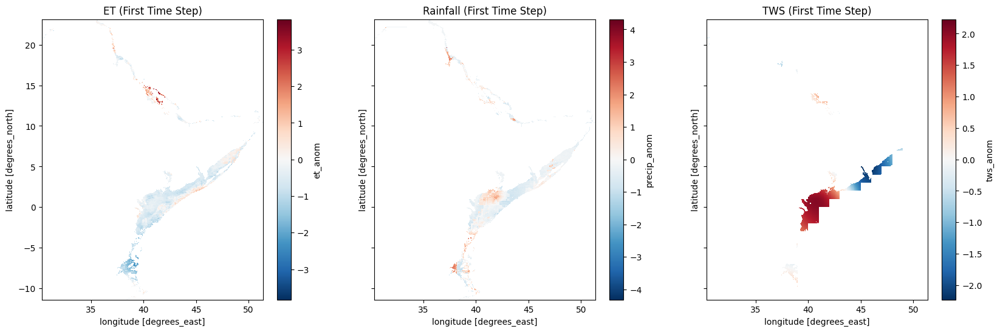

In [6]:
fig, axes = plt.subplots(1, 3, figsize=(20, 6), sharey=True)


# Plot ET
zone_1.et_anom.isel(time=200).plot(ax=axes[0], add_colorbar=True)
axes[0].set_title("ET (First Time Step)")

# Plot Rainfall
zone_1.precip_anom.isel(time=200).plot(ax=axes[1], add_colorbar=True)
axes[1].set_title("Rainfall (First Time Step)")

# Plot TWS
zone_1.tws_anom.isel(time=200).plot(ax=axes[2], add_colorbar=True)
axes[2].set_title("TWS (First Time Step)")

Text(0.5, 1.0, 'TWS (First Time Step)')

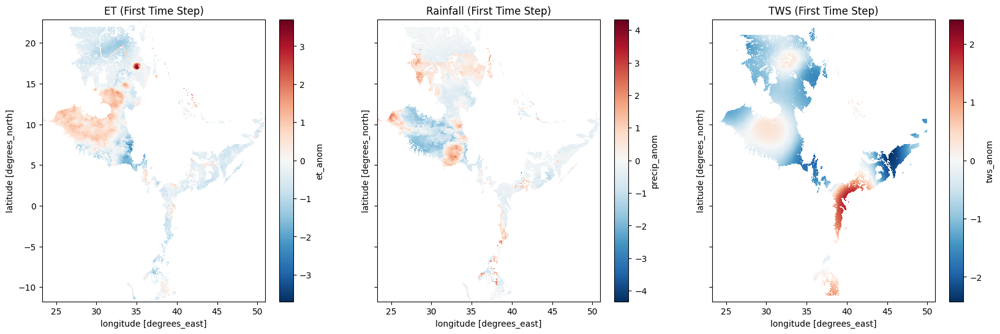

In [160]:
fig, axes = plt.subplots(1, 3, figsize=(20, 6), sharey=True)


# Plot ET
zone_2.et_anom.isel(time=200).plot(ax=axes[0], add_colorbar=True)
axes[0].set_title("ET (First Time Step)")

# Plot Rainfall
zone_2.precip_anom.isel(time=200).plot(ax=axes[1], add_colorbar=True)
axes[1].set_title("Rainfall (First Time Step)")

# Plot TWS
zone_2.tws_anom.isel(time=200).plot(ax=axes[2], add_colorbar=True)
axes[2].set_title("TWS (First Time Step)")

Text(0.5, 1.0, 'TWS (First Time Step)')

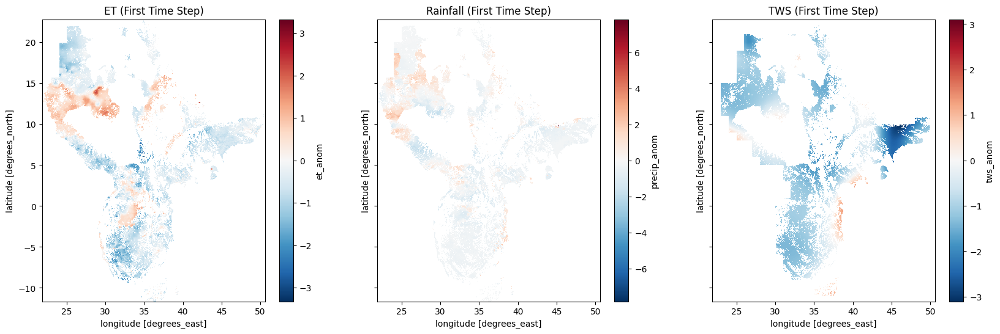

In [161]:
fig, axes = plt.subplots(1, 3, figsize=(20, 6), sharey=True)


# Plot ET
zone_3.et_anom.isel(time=200).plot(ax=axes[0], add_colorbar=True)
axes[0].set_title("ET (First Time Step)")

# Plot Rainfall
zone_3.precip_anom.isel(time=200).plot(ax=axes[1], add_colorbar=True)
axes[1].set_title("Rainfall (First Time Step)")

# Plot TWS
zone_3.tws_anom.isel(time=200).plot(ax=axes[2], add_colorbar=True)
axes[2].set_title("TWS (First Time Step)")

In [25]:
sub_region3 = all_subregions_ds.isel(subregion=1)

Text(0.5, 1.0, 'TWS (First Time Step)')

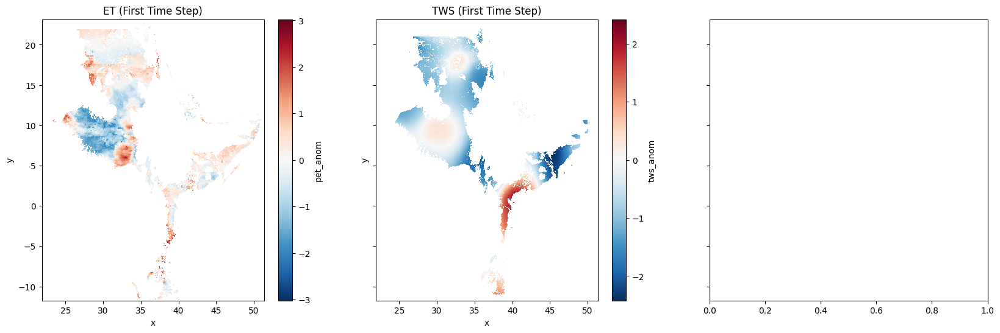

In [41]:
fig, axes = plt.subplots(1, 3, figsize=(20, 6), sharey=True)


# Plot ET
subregion_1.pet_anom.isel(time=200).plot(ax=axes[0], add_colorbar=True)
axes[0].set_title("ET (First Time Step)")

# Plot Rainfall
# sub_region3.precip_anom.isel(time=200).plot(ax=axes[1], add_colorbar=True)
# axes[1].set_title("Rainfall (First Time Step)")

# Plot TWS
subregion_1.tws_anom.isel(time=200).plot(ax=axes[1], add_colorbar=True)
axes[1].set_title("TWS (First Time Step)")

/home/jovyan/.local/lib/python3.8/site-packages/dask/core.py:119: RuntimeWarning: invalid value encountered in divide
  return func(*(_execute_task(a, cache) for a in args))


Text(0.5, 1.0, 'TWS (First Time Step)')

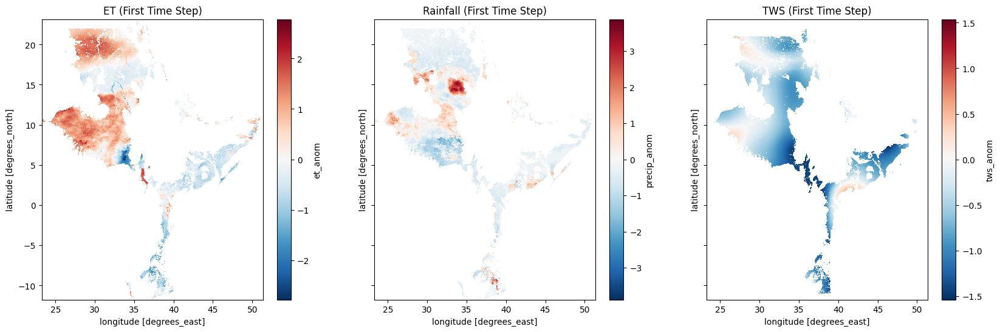

In [17]:
fig, axes = plt.subplots(1, 3, figsize=(20, 6), sharey=True)


# Plot ET
sub_region3.et_anom.isel(time=200).plot(ax=axes[0], add_colorbar=True)
axes[0].set_title("ET (First Time Step)")

# Plot Rainfall
sub_region3.precip_anom.isel(time=200).plot(ax=axes[1], add_colorbar=True)
axes[1].set_title("Rainfall (First Time Step)")

# Plot TWS
sub_region3.tws_anom.isel(time=200).plot(ax=axes[2], add_colorbar=True)
axes[2].set_title("TWS (First Time Step)")

Text(0.5, 1.0, 'TWS (First Time Step)')

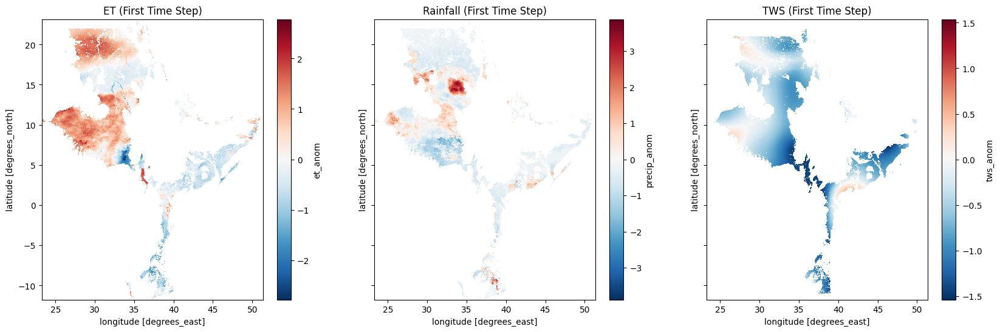

In [18]:
fig, axes = plt.subplots(1, 3, figsize=(20, 6), sharey=True)


# Plot ET
sub_region3.et_anom.isel(time=200).plot(ax=axes[0], add_colorbar=True)
axes[0].set_title("ET (First Time Step)")

# Plot Rainfall
sub_region3.precip_anom.isel(time=200).plot(ax=axes[1], add_colorbar=True)
axes[1].set_title("Rainfall (First Time Step)")

# Plot TWS
sub_region3.tws_anom.isel(time=200).plot(ax=axes[2], add_colorbar=True)
axes[2].set_title("TWS (First Time Step)")

#### Testing for Zone 1 `without Chunking`

In [26]:
zone_1 = all_subregions_ds.isel(subregion=0).unstack('points')
zone_1

<xarray.Dataset>
Dimensions:      (lat: 697, lon: 550, x: 550, y: 697, time: 756)
Coordinates:
  * lat          (lat) float64 -11.73 -11.68 -11.63 -11.58 ... 23.02 23.07 23.12
  * lon          (lon) float64 23.28 23.33 23.38 23.43 ... 51.28 51.33 51.38
  * x            (x) float64 23.28 23.33 23.38 23.43 ... 51.18 51.28 51.33 51.38
  * y            (y) float64 -11.73 -11.68 -11.63 -11.58 ... 23.02 23.07 23.12
  * time         (time) datetime64[ns] 2004-01-10 2004-01-20 ... 2024-12-31
    subregion    int64 1
    band         int64 1
    spatial_ref  int64 0
    month        (time) int64 1 1 1 2 2 2 3 3 3 4 ... 10 10 10 11 11 11 12 12 12
Data variables:
    tws          (time, y, x) float64 dask.array<chunksize=(756, 172, 108), meta=np.ndarray>
    et           (time, y, x) float64 dask.array<chunksize=(756, 172, 108), meta=np.ndarray>
    ppt          (time, y, x) float32 dask.array<chunksize=(756, 172, 108), meta=np.ndarray>
    landform     (y, x) float64 dask.array<chunksize=(172, 108), meta=np.ndarray>
    precip_anom  (time, y, x) float32 dask.array<chunksize=(3, 172, 108), meta=np.ndarray>
    et_anom      (time, y, x) float64 dask.array<chunksize=(3, 172, 108), meta=np.ndarray>
    tws_anom     (time, y, x) float64 dask.array<chunksize=(3, 172, 108), meta=np.ndarray>

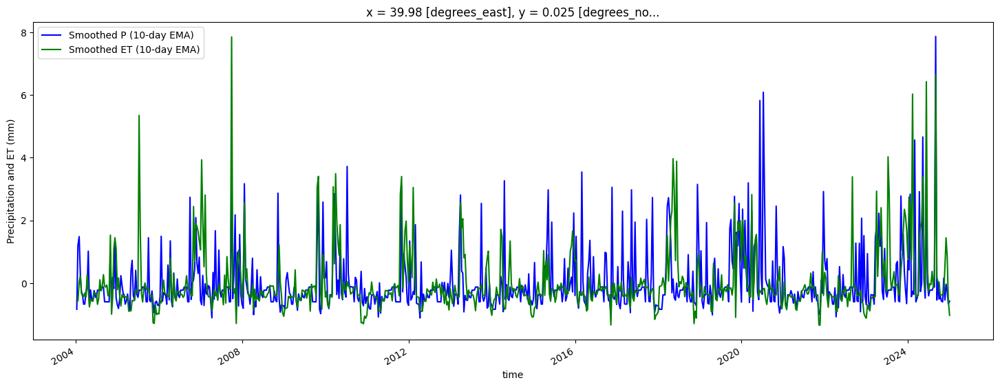

In [ ]:
import matplotlib.pyplot as plt

# Set up the figure
plt.figure(figsize=(18, 6))

# Create the first axis for ppt and et
ax1 = plt.gca()  # Get current axis
zone_1.precip_anom.sel(y=0, x=40, method='nearest').plot(ax=ax1, label='Smoothed P (10-day EMA)', color='blue')
zone_1.et_anom.sel(y=0, x=40, method='nearest').plot(ax=ax1, label='Smoothed ET (10-day EMA)', color='green')

# Customize the first axis
ax1.set_ylabel('Precipitation and ET (mm)')  # Assuming ppt and et are in mm
ax1.legend(loc='upper left')

# Create the second axis for tws
# ax2 = ax1.twinx()
zone_1.tws_anom.sel(y=0, x=40, method='nearest').plot(ax=ax2, label='Interpolated TWS', color='red')

# Customize the second axis
ax2.set_ylabel('TWS (unit)')  # Replace 'unit' with the actual unit of tws
ax2.legend(loc='upper right')

# Show the plot
plt.show()

/home/jovyan/.local/lib/python3.8/site-packages/dask/array/numpy_compat.py:41: RuntimeWarning: invalid value encountered in divide
  x = np.divide(x1, x2, out)


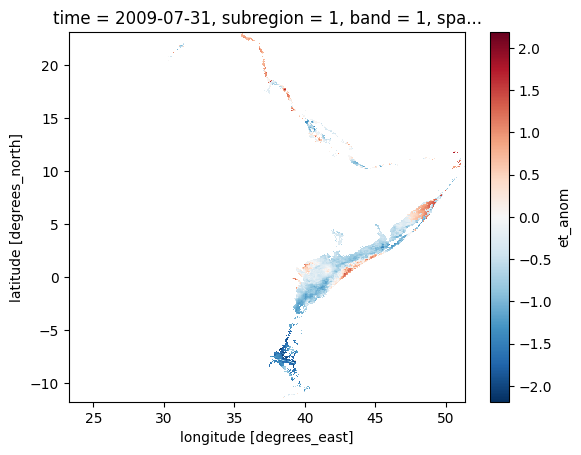

In [27]:
zone_1.et_anom.isel(time=200).plot()

#### Uniform Sampling `np.linsapce`

In [43]:
ecdf_dict = {}
for var in ['pet_anom', 'tws_anom']:
    stacked = subregion_1[var].compute().values.flatten()
    stacked = stacked[~np.isnan(stacked)]
        
    if len(stacked) == 0:
        print(f"Warning: No valid data for {var} in Zone")
        # ecdf_values = np.full(200, np.nan)
        # anom_points = np.linspace(-1, 1, 200)
    else:
        print(f"Subregion Zone - {var} valid points: {len(stacked)}")
        ecdf_func = ECDF(stacked)
        anom_min, anom_max = np.nanmin(stacked), np.nanmax(stacked)
        anom_points = np.linspace(anom_min, anom_max, 400)
        ecdf_values = ecdf_func(anom_points)
        
    ecdf_dict[f'{var.split("_")[0]}_ecdf'] = xr.DataArray(
        ecdf_values,
        coords={'ecdf_points': anom_points},
        dims=['ecdf_points']
    )
    
# subregion_ecdf_ds = xr.Dataset(ecdf_dict).assign_coords(subregion=int(subregion_id)).expand_dims('subregion')
# ecdf_ds_list.append(subregion_ecdf_ds)

# # Combine ECDFs
# all_ecdf_ds = xr.concat(ecdf_ds_list, dim='subregion')
print("ECDF dataset:")
print(ecdf_dict)


Subregion Zone - pet_anom valid points: 454570660
Subregion Zone - tws_anom valid points: 415200357
ECDF dataset:
{'pet_ecdf': <xarray.DataArray (ecdf_points: 400)>
array([2.19987801e-09, 4.39975602e-09, 4.39975602e-09, 4.39975602e-09,
       4.39975602e-09, 4.39975602e-09, 4.39975602e-09, 6.59963404e-09,
       6.59963404e-09, 6.59963404e-09, 6.59963404e-09, 8.79951205e-09,
       8.79951205e-09, 8.79951205e-09, 8.79951205e-09, 1.09993901e-08,
       1.09993901e-08, 1.31992681e-08, 1.53991461e-08, 1.97989021e-08,
       1.97989021e-08, 2.41986581e-08, 2.63985361e-08, 2.63985361e-08,
       3.07982922e-08, 3.29981702e-08, 3.51980482e-08, 3.95978042e-08,
       4.17976822e-08, 5.27970723e-08, 5.71968283e-08, 6.81962184e-08,
       7.25959744e-08, 7.25959744e-08, 7.69957304e-08, 7.91956084e-08,
       8.79951205e-08, 8.79951205e-08, 8.79951205e-08, 9.01949985e-08,
       9.45947545e-08, 1.05594145e-07, 1.14393657e-07, 1.23193169e-07,
       1.29792803e-07, 1.29792803e-07, 1.29792803e-07,

In [229]:
# Function to compute ECDF with a common mask
def compute_ecdf_statsmodels_consistent(ds):
    '''Parameters:
        ds (xarray.Dataset): Input dataset containing 'tws_anom', 'precip_anom', and 'et_anom'.

    Returns:
        tws_cdf (xarray.DataArray): ECDF values for TWS anomaly.
        precip_cdf (xarray.DataArray): ECDF values for precipitation anomaly.
        et_cdf (xarray.DataArray): ECDF values for ET anomaly.
    '''
    # Convert the selected variables to a single DataArray with 'variable' dimension
    data_vars = ds[['tws_anom', 'precip_anom', 'et_anom']].to_array(dim='variable')
    
    # Stack spatial and temporal dimensions
    stacked_data = data_vars.stack(all_points=['time', 'y', 'x'])
    
    # Create a common mask where all variables are non-NaN
    common_mask = stacked_data.notnull().all(dim='variable')
    valid_data = stacked_data.where(common_mask, drop=True)
    # print(valid_data)
    
    # Compute ECDF for each variable
    ecdf_dict = {}
    for var_name in ['tws_anom', 'precip_anom', 'et_anom']:
        flat_data = valid_data.sel(variable=var_name).values
        ecdf = ECDF(flat_data)
        anom_points = np.linspace(np.min(flat_data), np.max(flat_data), 500)
        cdf_values = ecdf(anom_points)
        ecdf_dict[var_name] = xr.DataArray(
            cdf_values,
            coords={'all_points': anom_points},
            dims=['all_points']
        )
    
    return ecdf_dict['tws_anom'], ecdf_dict['precip_anom'], ecdf_dict['et_anom']



In [192]:
# Check correclation matrix
corr_matrix = np.corrcoef([sampled_data['precip_sample'], sampled_data['et_sample'], sampled_data['tws_sample']])
print("Correlation Matrix:\n", corr_matrix)

# If correlations are too weak (e.g., < 0.1), consider alternative copulas


Correlation Matrix:
 [[1.         0.97570919 0.76906156]
 [0.97570919 1.         0.84319856]
 [0.76906156 0.84319856 1.        ]]


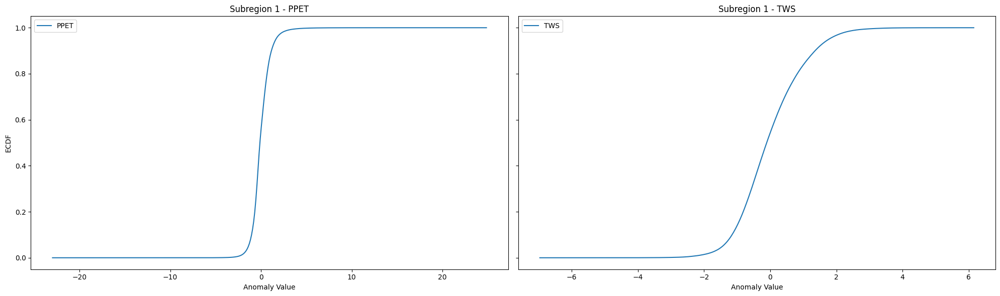

In [45]:
fig, axes = plt.subplots(1, 2, figsize=(20, 6), sharey=True)

    
for j, (var, label) in enumerate([('pet_ecdf', 'PPET'), ('tws_ecdf', 'TWS')]):
        ax = axes[ j]
        ecdf_dict[var].plot(ax=ax, label=label)
        ax.set_title(f"Subregion 1 - {label}")
        ax.set_xlabel("Anomaly Value")
        if j == 0:
            ax.set_ylabel("ECDF")
        ax.legend()

plt.tight_layout()
plt.show()

In [193]:
ecdf_dict = {}
sampled_data = {}
for var in ['precip_anom', 'et_anom', 'tws_anom']:
    stacked = zone_1[var].values.flatten()
    stacked = stacked[~np.isnan(stacked)]
        
    if len(stacked) == 0:
        print(f"Warning: No valid data for {var} in Zone")
        # ecdf_values = np.full(200, np.nan)
        # anom_points = np.linspace(-1, 1, 200)
    else:
        print(f"Subregion Zone - {var} valid points: {len(stacked)}")
        ecdf_func = ECDF(stacked)
        anom_points = np.linspace(0, 1, 1000)
        sampled_points = np.quantile(stacked, anom_points,  method='inverted_cdf')
        # sns.histplot(sampled_points)
        ecdf_values = anom_points
        
    sampled_data[f'{var.split("_")[0]}_sample'] = sampled_points

        
        
    ecdf_dict[f'{var.split("_")[0]}_ecdf'] = xr.DataArray(
        ecdf_values,
        coords={'ecdf_points': anom_points},
        dims=['ecdf_points']
    )
    
# subregion_ecdf_ds = xr.Dataset(ecdf_dict).assign_coords(subregion=int(subregion_id)).expand_dims('subregion')
# ecdf_ds_list.append(subregion_ecdf_ds)

# # Combine ECDFs
# all_ecdf_ds = xr.concat(ecdf_ds_list, dim='subregion')
print("ECDF dataset:")
# print(ecdf_dict)


Subregion Zone - precip_anom valid points: 96562548
Subregion Zone - et_anom valid points: 93279332
Subregion Zone - tws_anom valid points: 48801181
ECDF dataset:


In [103]:
subregion_1

<xarray.Dataset>
Dimensions:        (y: 698, x: 590, time: 7671)
Coordinates:
  * y              (y) float64 -11.73 -11.68 -11.63 -11.58 ... 23.02 23.07 23.12
  * x              (x) float64 21.88 21.93 21.98 22.03 ... 51.28 51.33 51.38
  * time           (time) datetime64[ns] 2004-01-01 2004-01-02 ... 2024-12-31
    subregion      int64 1
    band           int64 1
    spatial_ref    int64 0
    lat            (y, x) float64 dask.array<chunksize=(173, 590), meta=np.ndarray>
    lon            (y, x) float64 dask.array<chunksize=(175, 590), meta=np.ndarray>
    month          (time) int64 1 1 1 1 1 1 1 1 1 ... 12 12 12 12 12 12 12 12 12
Data variables:
    precipitation  (time, y, x) float32 dask.array<chunksize=(7671, 43, 590), meta=np.ndarray>
    et             (time, y, x) float64 dask.array<chunksize=(7671, 43, 590), meta=np.ndarray>
    tws            (time, y, x) float64 dask.array<chunksize=(7671, 43, 590), meta=np.ndarray>
    landform       (y, x) float64 dask.array<chunksize=(43, 590), meta=np.ndarray>
    pet            (time, y, x) float64 dask.array<chunksize=(7671, 43, 590), meta=np.ndarray>
    pet_anom       (time, y, x) float64 dask.array<chunksize=(31, 43, 590), meta=np.ndarray>
    tws_anom       (time, y, x) float64 dask.array<chunksize=(31, 43, 590), meta=np.ndarray>

#### Stratified Samoling

In [105]:
df = pd.DataFrame({
    # 'p': subregion_1['precip_anom'].values.flatten(),
    'pet': subregion_1['pet_anom'].values.flatten(),
    'tws': subregion_1['tws_anom'].values.flatten()
}).dropna()  # Remove any missing values


# ------ Stratified Sampling Based on Combined Variables ------

# Use fewer bins for each variable to keep the total number of strata reasonable
n_bins = 4
# df['p_bin'] = pd.qcut(df['p'], q=n_bins, duplicates='drop')
df['pet_bin'] = pd.qcut(df['pet'], q=n_bins, duplicates='drop')
df['tws_bin'] = pd.qcut(df['tws'], q=n_bins, duplicates='drop')

# Create a combined stratification label
df['combined_bin'] = (
    # df['p_bin'].astype(str) + "_" +
    df['pet_bin'].astype(str) + "_" +
    df['tws_bin'].astype(str)
)

# Sample from each combined bin
sample_list = []
sample_per_bin = 100  # adjust sample count as desired
for _, group in df.groupby('combined_bin'):
    sample = group.sample(n=sample_per_bin, replace=(len(group) < sample_per_bin))
    sample_list.append(sample)
df_sample_combined = pd.concat(sample_list)

# ------ Use one of the samples for further analysis ------
# For example, we use the combined stratification sample:
df_sample = df_sample_combined.copy()



In [106]:
df_sample

,pet,tws,pet_bin,tws_bin,combined_bin
157892666,0.132625,0.337419,"(-0.167, 0.372]","(-0.0338, 0.627]","(-0.167, 0.372]_(-0.0338, 0.627]"
1624152307,-0.062808,0.523438,"(-0.167, 0.372]","(-0.0338, 0.627]","(-0.167, 0.372]_(-0.0338, 0.627]"
1535821104,0.204577,0.165891,"(-0.167, 0.372]","(-0.0338, 0.627]","(-0.167, 0.372]_(-0.0338, 0.627]"
1371923246,0.228643,0.019387,"(-0.167, 0.372]","(-0.0338, 0.627]","(-0.167, 0.372]_(-0.0338, 0.627]"
337843226,0.220413,0.401576,"(-0.167, 0.372]","(-0.0338, 0.627]","(-0.167, 0.372]_(-0.0338, 0.627]"
...,...,...,...,...,...
2412148685,0.467874,1.123077,"(0.372, 23.882]","(0.627, 4.897]","(0.372, 23.882]_(0.627, 4.897]"
212638170,0.581995,0.705756,"(0.372, 23.882]","(0.627, 4.897]","(0.372, 23.882]_(0.627, 4.897]"
876103815,3.481419,0.821812,"(0.372, 23.882]","(0.627, 4.897]","(0.372, 23.882]_(0.627, 4.897]"
2150683755,1.320930,1.218008,"(0.372, 23.882]","(0.627, 4.897]","(0.372, 23.882]_(0.627, 4.897]"


In [108]:
# Calculate the ECDF for each variable over the sample:
# df_sample['p_ecdf'] = ECDF(df_sample['p'])(df_sample['p'])
df_sample['pet_ecdf'] = ECDF(df_sample['pet'])(df_sample['pet'])
df_sample['tws_ecdf'] = ECDF(df_sample['tws'])(df_sample['tws'])

# Prepare the data for copula fitting (using the uniform [0,1] marginals)
df_ecdf = df_sample[['pet_ecdf', 'tws_ecdf']]

In [109]:
df_ecdf

,pet_ecdf,tws_ecdf
157892666,0.646875,0.650625
1624152307,0.556250,0.715625
1535821104,0.676875,0.575000
1371923246,0.688125,0.519375
337843226,0.683750,0.676875
...,...,...
2412148685,0.790000,0.885625
212638170,0.821250,0.775625
876103815,0.989375,0.809375
2150683755,0.928750,0.905000


In [110]:
# Check correclation matrix
corr_matrix = np.corrcoef([df_ecdf['pet_ecdf'], df_ecdf['tws_ecdf']])
print("Correlation Matrix:\n", corr_matrix)

# If correlations are too weak (e.g., < 0.1), consider alternative copulas


Correlation Matrix:
 [[1.         0.00418018]
 [0.00418018 1.        ]]


In [111]:
copula_data = np.column_stack([
    df_ecdf['pet_ecdf'].values,
    df_ecdf['tws_ecdf'].values
])

In [112]:
copula_data

array([[0.646875, 0.650625],
       [0.55625 , 0.715625],
       [0.676875, 0.575   ],
       ...,
       [0.989375, 0.809375],
       [0.92875 , 0.905   ],
       [0.850625, 0.848125]])

Copula data shape: (1600, 2)


IndexError: index 2 is out of bounds for axis 1 with size 2

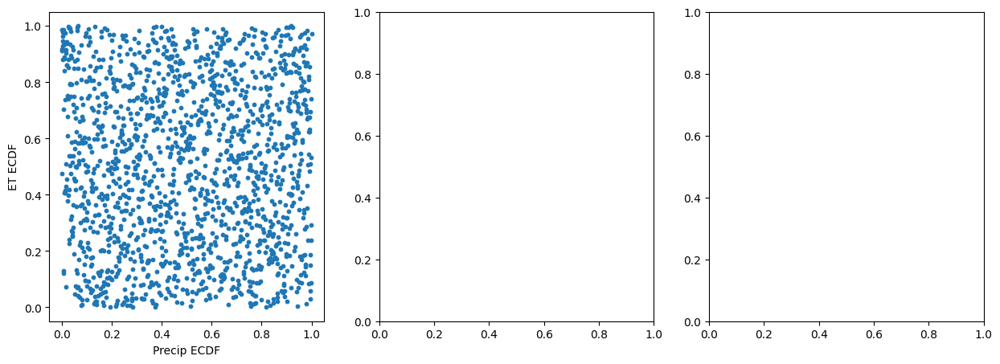

In [113]:
print(f"Copula data shape: {copula_data.shape}")  # Should be (200, 3)
# Visualize dependence
fig, axes = plt.subplots(1, 3, figsize=(15, 5))
axes[0].scatter(copula_data[:, 0], copula_data[:, 1], s=10)
axes[0].set_xlabel('Precip ECDF')
axes[0].set_ylabel('ET ECDF')
axes[1].scatter(copula_data[:, 0], copula_data[:, 2], s=10)
axes[1].set_xlabel('Precip ECDF')
axes[1].set_ylabel('TWS ECDF')
axes[2].scatter(copula_data[:, 1], copula_data[:, 2], s=10)
axes[2].set_xlabel('ET ECDF')
axes[2].set_ylabel('TWS ECDF')
plt.tight_layout()
plt.show()

In [114]:
subregion_id = 1

# Define Copulas (assuming these are from a library like 'copulae')
copulas = {
    'Gaussian': GaussianCopula(dim=2),
    'Clayton': ClaytonCopula(dim=2),
    'Frank': FrankCopula(dim=2),
    'Gumbel': GumbelCopula(dim=2),
    'tCopula': StudentCopula(dim=2)
}

# Fit Copulas
results = {}
for name, copula in copulas.items():
    try:
        print(f'Fitting {name}...')
        copula.fit(copula_data)  # Assuming copula_data is defined elsewhere
        log_likelihood = copula.log_lik(copula_data)
        # Calculate AIC: -2 * log_likelihood + 2 * number_of_parameters
        num_params = copula.dim  # Adjust based on your copula library's parameter count
        aic = -2 * log_likelihood + 2 * num_params
        results[name] = {'copula': copula, 'log_likelihood': log_likelihood, 'AIC': aic}
        print(f"{name} Copula fitted for subregion {subregion_id}, log-likelihood: {log_likelihood:.2f}")
    except Exception as e:
        print(f"Failed to fit {name} Copula: {e}")

# Select best copula
if results:
    best_copula_name = max(results, key=lambda x: results[x]['log_likelihood'])  # Fixed key
    best_copula = results[best_copula_name]['copula']
    print(f"Best copula (by AIC): {best_copula_name} (AIC: {results[best_copula_name]['AIC']:.2f})")
else:
    print("No copulas were successfully fitted to the data.")

Fitting Gaussian...
Gaussian Copula fitted for subregion 1, log-likelihood: 0.18
Fitting Clayton...
Clayton Copula fitted for subregion 1, log-likelihood: 0.83
Fitting Frank...
Frank Copula fitted for subregion 1, log-likelihood: 0.01
Fitting Gumbel...
Gumbel Copula fitted for subregion 1, log-likelihood: 0.07
Fitting tCopula...
tCopula Copula fitted for subregion 1, log-likelihood: 3.83
Best copula (by AIC): tCopula (AIC: -3.65)


In [115]:
best_copula

In [116]:
print("Fitted Copula Correlation Matrix:")
print(copula.params)

Fitted Copula Correlation Matrix:
StudentParams(df=13.499736489350207, rho=array([-0.00625819]))


In [117]:
# Generate new samples from the fitted copula
simulated_uniform = best_copula.random(500)

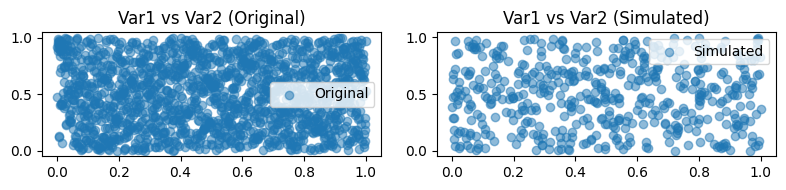

In [118]:
# Visualize: Scatter plots to compare original vs simulated data
plt.figure(figsize=(12, 2))

plt.subplot(131)
plt.scatter(copula_data[:, 0], copula_data[:, 1], alpha=0.5, label="Original")
plt.title("Var1 vs Var2 (Original)")
plt.legend()

plt.subplot(132)
plt.scatter(simulated_uniform[:, 0], simulated_uniform[:, 1], alpha=0.5, label="Simulated")
plt.title("Var1 vs Var2 (Simulated)")
plt.legend()

plt.tight_layout()
plt.show()

# # Optional: Print first 5 rows of original and transformed data for inspection
# print("\nFirst 5 rows of Original Data:")
# print(data[:5])
# print("\nFirst 5 rows of ECDF-Transformed Data:")
# print(uniform_data[:5])

#### Random sampling

In [86]:
# vars = ['precip_anom', 'et_anom', 'tws_anom']
# stacked_data = {}
# for var in vars:
#     stacked = zone_1[var].compute().values.flatten()
#     stacked_data[var] = stacked

# # Combine into a matrix and remove rows with any NaNs
# data_matrix = np.column_stack([stacked_data[var] for var in vars])
# valid_mask = ~np.any(np.isnan(data_matrix), axis=1)
# data_matrix = data_matrix[valid_mask]

# # Update stacked_data with valid paired data
# for i, var in enumerate(vars):
#     stacked_data[var] = data_matrix[:, i]

# Step 2: Randomly sample paired indices
n_sample = 10000

# Step 3: Compute ECDF for each variable and transform the sampled data
ecdf_dict = {}
uniform_data_list = []
for var in ['pet_anom', 'tws_anom']:
    stacked = subregion_1[var].values.flatten()
    stacked = stacked[~np.isnan(stacked)]
    
    sample_indices = np.random.choice(len(stacked), size=n_sample, replace=False)

    # Compute ECDF on the full data
    ecdf_func = ECDF(stacked)
    
    # Sample the same indices for all variables to preserve dependence
    anom_points = stacked[sample_indices]
    ecdf_values = ecdf_func(anom_points)
    
    # Store in ecdf_dict as an xarray.DataArray
    ecdf_dict[f'{var.split("_")[0]}_ecdf'] = xr.DataArray(
        ecdf_values,
        coords={'ecdf_points': anom_points},
        dims=['ecdf_points']
    )
    
    # Collect ECDF-transformed values for copula modeling
    uniform_data_list.append(ecdf_values)

# Combine ECDF-transformed values into a matrix for copula modeling
uniform_data = np.column_stack(uniform_data_list)


In [87]:
np.sort(uniform_data)

array([[0.94767037, 0.95276573],
       [0.23073453, 0.40837794],
       [0.04032522, 0.32050505],
       ...,
       [0.27408081, 0.95686685],
       [0.00422504, 0.83013455],
       [0.43707944, 0.62612336]])

#### Plot ECDFs


In [88]:
corr = np.corrcoef(uniform_data.T)
print("Correlation matrix:\n", corr)

Correlation matrix:
 [[ 1.         -0.00821068]
 [-0.00821068  1.        ]]


In [177]:
ecdf_dict['precip_ecdf']

<xarray.DataArray (ecdf_points: 500)>
array([7.88869218e-01, 6.24204016e-01, 3.70293241e-01, 8.19024123e-01,
       4.82440129e-01, 1.32711951e-01, 5.44137526e-03, 9.46031578e-01,
       3.03136081e-01, 7.59725606e-01, 2.55602358e-01, 6.69155284e-01,
       1.84558171e-01, 4.39841820e-01, 9.24400054e-01, 2.04550546e-01,
       8.75329112e-01, 8.12782141e-01, 8.53637062e-01, 8.41503435e-01,
       2.61242966e-01, 8.88805770e-01, 3.98853447e-01, 7.93992830e-01,
       9.71324941e-01, 3.05782739e-02, 2.64473451e-01, 6.87991986e-01,
       4.61511068e-01, 8.46607292e-01, 3.61958689e-01, 4.33635986e-01,
       7.73822764e-01, 3.13268347e-01, 7.94794908e-01, 9.64543687e-01,
       9.64381653e-01, 7.51545417e-01, 7.91800014e-01, 2.24618474e-01,
       2.10231400e-01, 2.19090828e-01, 9.63330954e-01, 3.80847721e-01,
       2.07970491e-01, 1.78222562e-02, 3.69089441e-02, 5.24356047e-01,
       8.73363374e-01, 7.94238613e-01, 6.87991461e-01, 1.47364879e-01,
       8.53171976e-01, 7.64919097e-01, 8.23406394e-01, 3.93007198e-01,
       1.99834330e-01, 2.82023654e-01, 4.70441531e-01, 3.99771850e-01,
       3.08142528e-01, 3.28023519e-01, 4.70559536e-01, 3.76570846e-01,
       2.69479583e-01, 1.08947087e-01, 2.43483338e-01, 6.60106291e-02,
       1.02742303e-02, 9.94789276e-02, 7.23143777e-01, 8.07205842e-01,
       3.36436041e-01, 5.29416085e-01, 3.19881263e-01, 5.45027977e-01,
       7.61754707e-01, 7.53124774e-01, 5.44001342e-01, 2.28593664e-01,
...
       7.72044174e-02, 8.04927175e-01, 4.91016892e-01, 6.74438093e-01,
       3.30696657e-01, 9.30626064e-01, 5.65267291e-01, 5.17508696e-01,
       9.08700631e-01, 9.07748919e-01, 7.25654566e-01, 8.14250744e-02,
       8.71277424e-01, 4.47599692e-01, 2.06820702e-01, 3.18036893e-01,
       8.44948073e-01, 3.99837630e-01, 6.39631176e-01, 1.62305412e-01,
       6.43428360e-01, 4.06888941e-01, 9.75559574e-02, 4.76141509e-01,
       9.53479672e-01, 7.18203950e-01, 5.87695533e-01, 9.45587824e-01,
       5.68233078e-01, 5.54315818e-01, 6.35609226e-01, 2.70536481e-01,
       5.84052083e-01, 6.62922864e-01, 7.05101167e-01, 9.93570764e-01,
       3.17391280e-01, 3.30824015e-01, 4.66971778e-02, 8.56219411e-01,
       9.58050667e-01, 3.99395872e-01, 6.73918366e-01, 1.72853377e-01,
       2.89120675e-01, 3.95255707e-01, 8.67944801e-01, 2.35371451e-01,
       6.87322519e-01, 4.93903344e-01, 8.54160047e-01, 2.15574840e-01,
       4.81311987e-01, 8.52405940e-01, 5.60015060e-01, 7.95100272e-01,
       4.82624756e-01, 4.69211145e-01, 3.38559294e-01, 3.97476685e-01,
       8.23930114e-01, 8.91608053e-01, 9.76704844e-01, 2.09289039e-01,
       5.80043478e-04, 9.53454663e-01, 9.73529001e-01, 6.83126346e-01,
       4.84494975e-02, 9.98709298e-01, 3.60023319e-01, 6.50951902e-01,
       6.69360716e-02, 8.60926905e-01, 4.02540822e-01, 2.04080417e-01,
       7.15397464e-03, 8.54434096e-01, 3.39352335e-01, 9.52576297e-01])
Coordinates:
  * ecdf_points  (ecdf_points) float32 0.4019 -0.166 -0.4289 ... -0.4653 2.059

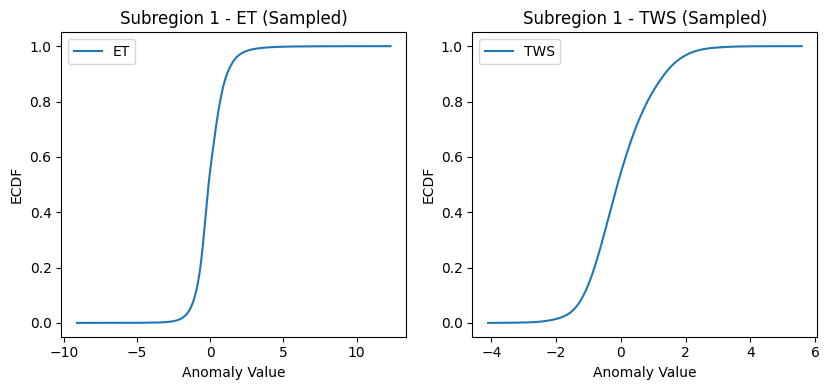

In [89]:
# Step 4: Plot the ECDFs of the sampled data
plt.figure(figsize=(12, 4))

# plt.subplot(131)
# plt.plot(np.sort(ecdf_dict['precip_ecdf'].ecdf_points), np.sort(ecdf_dict['precip_ecdf']), label="Precip")
# plt.xlabel("Anomaly Value")
# plt.ylabel("ECDF")
# plt.title("Subregion 1 - Precip (Sampled)")
# plt.legend()

plt.subplot(132)
plt.plot(np.sort(ecdf_dict['pet_ecdf'].ecdf_points), np.sort(ecdf_dict['pet_ecdf']), label="ET")
plt.xlabel("Anomaly Value")
plt.ylabel("ECDF")
plt.title("Subregion 1 - ET (Sampled)")
plt.legend()

plt.subplot(133)
plt.plot(np.sort(ecdf_dict['tws_ecdf'].ecdf_points), np.sort(ecdf_dict['tws_ecdf']), label="TWS")
plt.xlabel("Anomaly Value")
plt.ylabel("ECDF")
plt.title("Subregion 1 - TWS (Sampled)")
plt.legend()

plt.tight_layout()
plt.show()

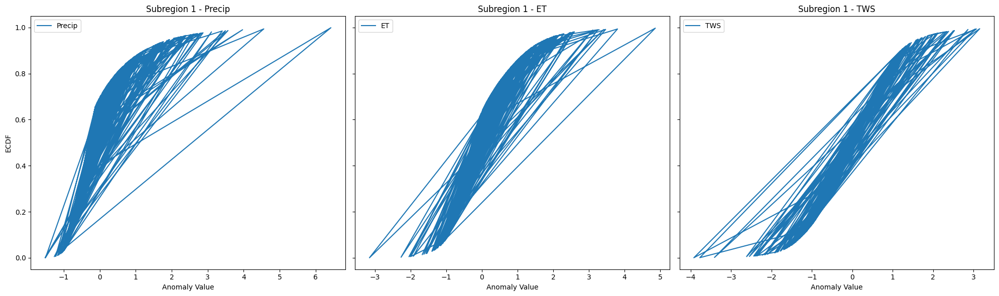

In [180]:
fig, axes = plt.subplots(1, 3, figsize=(20, 6), sharey=True)

    
for j, (var, label) in enumerate([('precip_ecdf', 'Precip'), ('et_ecdf', 'ET'), ('tws_ecdf', 'TWS')]):
        ax = axes[ j]
        ecdf_dict[var].plot(ax=ax, label=label)
        ax.set_title(f"Subregion 1 - {label}")
        ax.set_xlabel("Anomaly Value")
        if j == 0:
            ax.set_ylabel("ECDF")
        ax.legend()

plt.tight_layout()
plt.show()

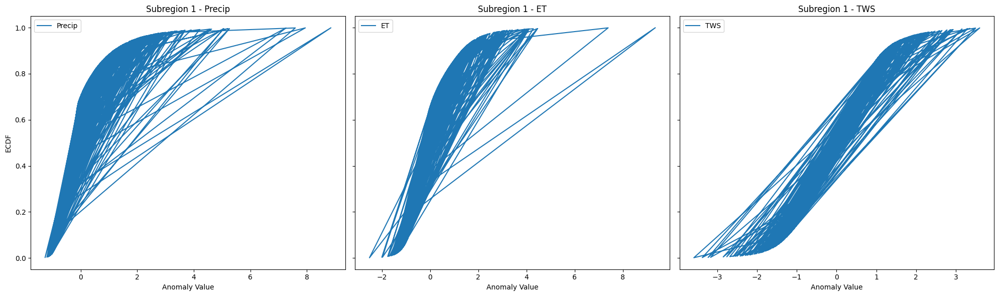

In [106]:
fig, axes = plt.subplots(1, 3, figsize=(20, 6), sharey=True)

    
for j, (var, label) in enumerate([('precip_ecdf', 'Precip'), ('et_ecdf', 'ET'), ('tws_ecdf', 'TWS')]):
        ax = axes[ j]
        ecdf_dict[var].plot(ax=ax, label=label)
        ax.set_title(f"Subregion 1 - {label}")
        ax.set_xlabel("Anomaly Value")
        if j == 0:
            ax.set_ylabel("ECDF")
        ax.legend()

plt.tight_layout()
plt.show()

#### Save sample ECDF

In [27]:
# Save sampled ECDF dataset
ecdf_output_file = os.path.join(output_dir, 'cdfs/zone1_ecdf_200.nc')
xr.Dataset(ecdf_dict).to_netcdf(ecdf_output_file)
print(f"Saved ECDFs to {ecdf_output_file}")

Saved ECDFs to ../../datasets/results/cdfs/zone1_ecdf_200.nc


#### Subregional 

In [168]:
# Function to test and select the best copula
def fit_best_copula(tws_cdf, precip_cdf, et_cdf):
    uniform_data = pd.DataFrame({
        'tws': tws_cdf.values,
        'precip': precip_cdf.values,
        'et': et_cdf.values
    }).dropna()
    
    copulas = {
        'Gaussian': GaussianCopula(dim=3),
        'Clayton': ClaytonCopula(dim=3),
        'Frank': FrankCopula(dim=3),
        'Gumbel': GumbelCopula(dim=3),
        'tCopula': StudentCopula(dim=3)
    }
    
    results = {}
    for name, copula in copulas.items():
        try:
            copula.fit(uniform_data)
            log_lik = copula.log_lik(uniform_data)
            if name in ['Clayton', 'Gumbel', 'Frank']:
                n_params = np.array(copula.params).size
            elif name == 'Gaussian':
                n_params = copula.params.size
            aic = -2 * log_lik + 2 * n_params
            bic = -2 * log_lik + np.log(uniform_data.shape[0]) * n_params
            results[name] = {
                "Log-Likelihood": log_lik,
                "AIC": aic,
                "BIC": bic,
                "Parameters": copula.params,
                "copula": copula
            }
            print(f"{name} Copula: Log-Likelihood={log_lik:.2f}, AIC={aic:.2f}, BIC={bic:.2f}")
        except Exception as e:
            print(f"Error fitting {name} copula: {e}")
            results[name] = {
                "Log-Likelihood": -np.inf,
                "AIC": np.inf,
                "BIC": np.inf,
                "Parameters": None,
                "copula": None
            }
    
    best_copula_name = min(results, key=lambda x: results[x]['AIC'])
    best_copula = results[best_copula_name]['copula']
    print(f"Best copula (by AIC): {best_copula_name} (AIC: {results[best_copula_name]['AIC']:.2f})")
    return best_copula, results


In [170]:
# Function to compute drought index
def compute_copula_index(ds):
    stacked_data = ds[['tws_cdf', 'precip_cdf', 'et_cdf']].stack(all_points=['time', 'y', 'x'])
    
    # Extract CDF values
    tws_cdf = stacked_data['tws_cdf']
    precip_cdf = stacked_data['precip_cdf']
    et_cdf = stacked_data['et_cdf']
    
    best_copula, copula_results = fit_best_copula(tws_cdf, precip_cdf, et_cdf)
    
    return best_copula, copula_results

In [169]:
best_copulas = {}
copula_metrics = {}
for subregion_id, ds in subregion_datasets.items():
    # Compute ECDFs once
    tws_cdf, precip_cdf, et_cdf = compute_ecdf_statsmodels_consistent(ds)
    ds['tws_cdf'] = tws_cdf
    ds['precip_cdf'] = precip_cdf
    ds['et_cdf'] = et_cdf
    subregion_datasets[subregion_id] = ds
    
    # Fit copula using precomputed CDFs
    best_copula = fit_best_copula(tws_cdf, precip_cdf, et_cdf)
    best_copulas[subregion_id] = best_copula
    copula_metrics[subregion_id] = copula_results

ValueError: Per-column arrays must each be 1-dimensional

In [171]:
# Process all subregions and store results
best_copulas = {}
copula_metrics = {}
for subregion_id, ds in subregion_datasets.items():
    print(f"Processing subregion: {subregion_id}")
    # drought_index, best_copula, copula_results = compute_copula_index(ds)
    # ds['drought_index'] = drought_index
    best_copula, copula_results = compute_copula_index(ds)
    subregion_datasets[subregion_id] = ds
    best_copulas[subregion_id] = best_copula
    copula_metrics[subregion_id] = copula_results


Processing subregion: 1.0
                tws        precip            et
count  1.390176e+06  1.390176e+06  1.390176e+06
mean   5.000000e-01  5.000000e-01  5.000000e-01
std    2.886750e-01  2.886750e-01  2.886750e-01
min    7.193329e-07  7.193329e-07  7.193329e-07
25%    2.500004e-01  2.500004e-01  2.500004e-01
50%    5.000000e-01  5.000000e-01  5.000000e-01
75%    7.499996e-01  7.499996e-01  7.499996e-01
max    9.999993e-01  9.999993e-01  9.999993e-01
Gaussian Copula: Log-Likelihood=62230.99, AIC=-124455.98, BIC=-124419.55
                tws        precip            et
count  1.390176e+06  1.390176e+06  1.390176e+06
mean   5.000000e-01  5.000000e-01  5.000000e-01
std    2.886750e-01  2.886750e-01  2.886750e-01
min    7.193329e-07  7.193329e-07  7.193329e-07
25%    2.500004e-01  2.500004e-01  2.500004e-01
50%    5.000000e-01  5.000000e-01  5.000000e-01
75%    7.499996e-01  7.499996e-01  7.499996e-01
max    9.999993e-01  9.999993e-01  9.999993e-01
Clayton Copula: Log-Likelihood=12341.

/home/jovyan/.local/lib/python3.8/site-packages/copulae/archimedean/gumbel.py:165: UserWarning: For the Gumbel copula, tau must be >= 0. Replacing negative values by 0.
  warnings.warn(warning_message)


                tws        precip            et
count  1.390176e+06  1.390176e+06  1.390176e+06
mean   5.000000e-01  5.000000e-01  5.000000e-01
std    2.886750e-01  2.886750e-01  2.886750e-01
min    7.193329e-07  7.193329e-07  7.193329e-07
25%    2.500004e-01  2.500004e-01  2.500004e-01
50%    5.000000e-01  5.000000e-01  5.000000e-01
75%    7.499996e-01  7.499996e-01  7.499996e-01
max    9.999993e-01  9.999993e-01  9.999993e-01


/home/jovyan/.local/lib/python3.8/site-packages/copulae/archimedean/gumbel.py:211: FutureWarning: Support for multi-dimensional indexing (e.g. `obj[:, None]`) is deprecated and will be removed in a future version.  Convert to a numpy array before indexing instead.
  ln = offset + np.log(np.exp(lip - offset[:, None]).sum(1))


Gumbel Copula: Log-Likelihood=23103.53, AIC=-46205.07, BIC=-46192.92
Error fitting tCopula copula: Unable to allocate 14.1 TiB for an array with shape (1390176, 1390176) and data type float64
Best copula (by AIC): Gaussian (AIC: -124455.98)
Processing subregion: 2.0
                tws        precip            et
count  1.183291e+07  1.183291e+07  1.183291e+07
mean   5.000000e-01  5.000000e-01  5.000000e-01
std    2.886751e-01  2.886751e-01  2.886751e-01
min    8.451004e-08  8.451004e-08  8.451004e-08
25%    2.500000e-01  2.500000e-01  2.500000e-01
50%    5.000000e-01  5.000000e-01  5.000000e-01
75%    7.500000e-01  7.500000e-01  7.500000e-01
max    9.999999e-01  9.999999e-01  9.999999e-01
Gaussian Copula: Log-Likelihood=15855.36, AIC=-31704.73, BIC=-31661.87
                tws        precip            et
count  1.183291e+07  1.183291e+07  1.183291e+07
mean   5.000000e-01  5.000000e-01  5.000000e-01
std    2.886751e-01  2.886751e-01  2.886751e-01
min    8.451004e-08  8.451004e-08  8.4

/home/jovyan/.local/lib/python3.8/site-packages/copulae/archimedean/gumbel.py:165: UserWarning: For the Gumbel copula, tau must be >= 0. Replacing negative values by 0.
  warnings.warn(warning_message)


                tws        precip            et
count  1.183291e+07  1.183291e+07  1.183291e+07
mean   5.000000e-01  5.000000e-01  5.000000e-01
std    2.886751e-01  2.886751e-01  2.886751e-01
min    8.451004e-08  8.451004e-08  8.451004e-08
25%    2.500000e-01  2.500000e-01  2.500000e-01
50%    5.000000e-01  5.000000e-01  5.000000e-01
75%    7.500000e-01  7.500000e-01  7.500000e-01
max    9.999999e-01  9.999999e-01  9.999999e-01


/home/jovyan/.local/lib/python3.8/site-packages/copulae/archimedean/gumbel.py:211: FutureWarning: Support for multi-dimensional indexing (e.g. `obj[:, None]`) is deprecated and will be removed in a future version.  Convert to a numpy array before indexing instead.
  ln = offset + np.log(np.exp(lip - offset[:, None]).sum(1))


Gumbel Copula: Log-Likelihood=10683.98, AIC=-21365.95, BIC=-21351.67
Error fitting tCopula copula: Unable to allocate 1019. TiB for an array with shape (11832912, 11832912) and data type float64
Best copula (by AIC): Clayton (AIC: -70997421.63)
Processing subregion: 3.0
                tws        precip            et
count  1.278634e+07  1.278634e+07  1.278634e+07
mean   5.000000e-01  5.000000e-01  5.000000e-01
std    2.886751e-01  2.886751e-01  2.886751e-01
min    7.820848e-08  7.820848e-08  7.820848e-08
25%    2.500000e-01  2.500000e-01  2.500000e-01
50%    5.000000e-01  5.000000e-01  5.000000e-01
75%    7.500000e-01  7.500000e-01  7.500000e-01
max    9.999999e-01  9.999999e-01  9.999999e-01
Gaussian Copula: Log-Likelihood=13447.63, AIC=-26889.25, BIC=-26846.16
                tws        precip            et
count  1.278634e+07  1.278634e+07  1.278634e+07
mean   5.000000e-01  5.000000e-01  5.000000e-01
std    2.886751e-01  2.886751e-01  2.886751e-01
min    7.820848e-08  7.820848e-08 

/home/jovyan/.local/lib/python3.8/site-packages/copulae/archimedean/gumbel.py:211: FutureWarning: Support for multi-dimensional indexing (e.g. `obj[:, None]`) is deprecated and will be removed in a future version.  Convert to a numpy array before indexing instead.
  ln = offset + np.log(np.exp(lip - offset[:, None]).sum(1))


Gumbel Copula: Log-Likelihood=14188.07, AIC=-28374.13, BIC=-28359.77
Error fitting tCopula copula: Unable to allocate 1.16 PiB for an array with shape (12786336, 12786336) and data type float64
Best copula (by AIC): Gumbel (AIC: -28374.13)
Processing subregion: 4.0
                tws        precip            et
count  3.183624e+06  3.183624e+06  3.183624e+06
mean   5.000000e-01  5.000000e-01  5.000000e-01
std    2.886751e-01  2.886751e-01  2.886751e-01
min    3.141073e-07  3.141073e-07  3.141073e-07
25%    2.500002e-01  2.500002e-01  2.500002e-01
50%    5.000000e-01  5.000000e-01  5.000000e-01
75%    7.499998e-01  7.499998e-01  7.499998e-01
max    9.999997e-01  9.999997e-01  9.999997e-01
Gaussian Copula: Log-Likelihood=13175.95, AIC=-26345.91, BIC=-26306.99
                tws        precip            et
count  3.183624e+06  3.183624e+06  3.183624e+06
mean   5.000000e-01  5.000000e-01  5.000000e-01
std    2.886751e-01  2.886751e-01  2.886751e-01
min    3.141073e-07  3.141073e-07  3.14

/home/jovyan/.local/lib/python3.8/site-packages/copulae/archimedean/gumbel.py:211: FutureWarning: Support for multi-dimensional indexing (e.g. `obj[:, None]`) is deprecated and will be removed in a future version.  Convert to a numpy array before indexing instead.
  ln = offset + np.log(np.exp(lip - offset[:, None]).sum(1))


Gumbel Copula: Log-Likelihood=10086.22, AIC=-20170.44, BIC=-20157.46
Error fitting tCopula copula: Unable to allocate 73.7 TiB for an array with shape (3183624, 3183624) and data type float64
Best copula (by AIC): Gaussian (AIC: -26345.91)
Processing subregion: 5.0
                tws        precip            et
count  3.338712e+06  3.338712e+06  3.338712e+06
mean   5.000000e-01  5.000000e-01  5.000000e-01
std    2.886751e-01  2.886751e-01  2.886751e-01
min    2.995166e-07  2.995166e-07  2.995166e-07
25%    2.500001e-01  2.500001e-01  2.500001e-01
50%    5.000000e-01  5.000000e-01  5.000000e-01
75%    7.499999e-01  7.499999e-01  7.499999e-01
max    9.999997e-01  9.999997e-01  9.999997e-01
Gaussian Copula: Log-Likelihood=4805.97, AIC=-9605.95, BIC=-9566.89
                tws        precip            et
count  3.338712e+06  3.338712e+06  3.338712e+06
mean   5.000000e-01  5.000000e-01  5.000000e-01
std    2.886751e-01  2.886751e-01  2.886751e-01
min    2.995166e-07  2.995166e-07  2.99516

/home/jovyan/.local/lib/python3.8/site-packages/copulae/archimedean/gumbel.py:211: FutureWarning: Support for multi-dimensional indexing (e.g. `obj[:, None]`) is deprecated and will be removed in a future version.  Convert to a numpy array before indexing instead.
  ln = offset + np.log(np.exp(lip - offset[:, None]).sum(1))


Gumbel Copula: Log-Likelihood=9508.60, AIC=-19015.20, BIC=-19002.18
Error fitting tCopula copula: Unable to allocate 81.1 TiB for an array with shape (3338712, 3338712) and data type float64
Best copula (by AIC): Gumbel (AIC: -19015.20)
Processing subregion: 6.0
                tws        precip            et
count  1.136160e+06  1.136160e+06  1.136160e+06
mean   5.000000e-01  5.000000e-01  5.000000e-01
std    2.886750e-01  2.886750e-01  2.886750e-01
min    8.801569e-07  8.801569e-07  8.801569e-07
25%    2.500004e-01  2.500004e-01  2.500004e-01
50%    5.000000e-01  5.000000e-01  5.000000e-01
75%    7.499996e-01  7.499996e-01  7.499996e-01
max    9.999991e-01  9.999991e-01  9.999991e-01
Gaussian Copula: Log-Likelihood=2074.84, AIC=-4143.68, BIC=-4107.85
Error fitting Clayton copula: theta must be positive when dim > 2
Error fitting Frank copula: theta must be positive when dim > 2


/home/jovyan/.local/lib/python3.8/site-packages/copulae/archimedean/gumbel.py:165: UserWarning: For the Gumbel copula, tau must be >= 0. Replacing negative values by 0.
  warnings.warn(warning_message)


                tws        precip            et
count  1.136160e+06  1.136160e+06  1.136160e+06
mean   5.000000e-01  5.000000e-01  5.000000e-01
std    2.886750e-01  2.886750e-01  2.886750e-01
min    8.801569e-07  8.801569e-07  8.801569e-07
25%    2.500004e-01  2.500004e-01  2.500004e-01
50%    5.000000e-01  5.000000e-01  5.000000e-01
75%    7.499996e-01  7.499996e-01  7.499996e-01
max    9.999991e-01  9.999991e-01  9.999991e-01


/home/jovyan/.local/lib/python3.8/site-packages/copulae/archimedean/gumbel.py:211: FutureWarning: Support for multi-dimensional indexing (e.g. `obj[:, None]`) is deprecated and will be removed in a future version.  Convert to a numpy array before indexing instead.
  ln = offset + np.log(np.exp(lip - offset[:, None]).sum(1))


Gumbel Copula: Log-Likelihood=1457.27, AIC=-2912.53, BIC=-2900.59
Error fitting tCopula copula: Unable to allocate 9.39 TiB for an array with shape (1136160, 1136160) and data type float64
Best copula (by AIC): Gaussian (AIC: -4143.68)
Processing subregion: 7.0
                tws        precip            et
count  1.093176e+06  1.093176e+06  1.093176e+06
mean   5.000000e-01  5.000000e-01  5.000000e-01
std    2.886750e-01  2.886750e-01  2.886750e-01
min    9.147649e-07  9.147649e-07  9.147649e-07
25%    2.500005e-01  2.500005e-01  2.500005e-01
50%    5.000000e-01  5.000000e-01  5.000000e-01
75%    7.499995e-01  7.499995e-01  7.499995e-01
max    9.999991e-01  9.999991e-01  9.999991e-01
Gaussian Copula: Log-Likelihood=604.36, AIC=-1202.72, BIC=-1167.00
                tws        precip            et
count  1.093176e+06  1.093176e+06  1.093176e+06
mean   5.000000e-01  5.000000e-01  5.000000e-01
std    2.886750e-01  2.886750e-01  2.886750e-01
min    9.147649e-07  9.147649e-07  9.147649e-07

/home/jovyan/.local/lib/python3.8/site-packages/copulae/archimedean/gumbel.py:211: FutureWarning: Support for multi-dimensional indexing (e.g. `obj[:, None]`) is deprecated and will be removed in a future version.  Convert to a numpy array before indexing instead.
  ln = offset + np.log(np.exp(lip - offset[:, None]).sum(1))


Gumbel Copula: Log-Likelihood=1151.15, AIC=-2300.29, BIC=-2288.39
Error fitting tCopula copula: Unable to allocate 8.70 TiB for an array with shape (1093176, 1093176) and data type float64
Best copula (by AIC): Gumbel (AIC: -2300.29)
Processing subregion: 8.0
                tws        precip            et
count  2.579904e+06  2.579904e+06  2.579904e+06
mean   5.000000e-01  5.000000e-01  5.000000e-01
std    2.886751e-01  2.886751e-01  2.886751e-01
min    3.876112e-07  3.876112e-07  3.876112e-07
25%    2.500002e-01  2.500002e-01  2.500002e-01
50%    5.000000e-01  5.000000e-01  5.000000e-01
75%    7.499998e-01  7.499998e-01  7.499998e-01
max    9.999996e-01  9.999996e-01  9.999996e-01
Gaussian Copula: Log-Likelihood=457.11, AIC=-908.22, BIC=-869.93
                tws        precip            et
count  2.579904e+06  2.579904e+06  2.579904e+06
mean   5.000000e-01  5.000000e-01  5.000000e-01
std    2.886751e-01  2.886751e-01  2.886751e-01
min    3.876112e-07  3.876112e-07  3.876112e-07
25%

/home/jovyan/.local/lib/python3.8/site-packages/copulae/archimedean/gumbel.py:165: UserWarning: For the Gumbel copula, tau must be >= 0. Replacing negative values by 0.
  warnings.warn(warning_message)


                tws        precip            et
count  2.579904e+06  2.579904e+06  2.579904e+06
mean   5.000000e-01  5.000000e-01  5.000000e-01
std    2.886751e-01  2.886751e-01  2.886751e-01
min    3.876112e-07  3.876112e-07  3.876112e-07
25%    2.500002e-01  2.500002e-01  2.500002e-01
50%    5.000000e-01  5.000000e-01  5.000000e-01
75%    7.499998e-01  7.499998e-01  7.499998e-01
max    9.999996e-01  9.999996e-01  9.999996e-01


/home/jovyan/.local/lib/python3.8/site-packages/copulae/archimedean/gumbel.py:211: FutureWarning: Support for multi-dimensional indexing (e.g. `obj[:, None]`) is deprecated and will be removed in a future version.  Convert to a numpy array before indexing instead.
  ln = offset + np.log(np.exp(lip - offset[:, None]).sum(1))


Gumbel Copula: Log-Likelihood=4780.79, AIC=-9559.57, BIC=-9546.81
Error fitting tCopula copula: Unable to allocate 48.4 TiB for an array with shape (2579904, 2579904) and data type float64
Best copula (by AIC): Clayton (AIC: -15479378.20)
Processing subregion: 9.0
                 tws         precip             et
count  492696.000000  492696.000000  492696.000000
mean        0.500000       0.500000       0.500000
std         0.288675       0.288675       0.288675
min         0.000002       0.000002       0.000002
25%         0.250001       0.250001       0.250001
50%         0.500000       0.500000       0.500000
75%         0.749999       0.749999       0.749999
max         0.999998       0.999998       0.999998
Gaussian Copula: Log-Likelihood=1135.29, AIC=-2264.59, BIC=-2231.26
Error fitting Clayton copula: theta must be positive when dim > 2
Error fitting Frank copula: theta must be positive when dim > 2


/home/jovyan/.local/lib/python3.8/site-packages/copulae/archimedean/gumbel.py:165: UserWarning: For the Gumbel copula, tau must be >= 0. Replacing negative values by 0.
  warnings.warn(warning_message)


                 tws         precip             et
count  492696.000000  492696.000000  492696.000000
mean        0.500000       0.500000       0.500000
std         0.288675       0.288675       0.288675
min         0.000002       0.000002       0.000002
25%         0.250001       0.250001       0.250001
50%         0.500000       0.500000       0.500000
75%         0.749999       0.749999       0.749999
max         0.999998       0.999998       0.999998


/home/jovyan/.local/lib/python3.8/site-packages/copulae/archimedean/gumbel.py:211: FutureWarning: Support for multi-dimensional indexing (e.g. `obj[:, None]`) is deprecated and will be removed in a future version.  Convert to a numpy array before indexing instead.
  ln = offset + np.log(np.exp(lip - offset[:, None]).sum(1))


Gumbel Copula: Log-Likelihood=960.34, AIC=-1918.68, BIC=-1907.57
Error fitting tCopula copula: Unable to allocate 1.77 TiB for an array with shape (492696, 492696) and data type float64
Best copula (by AIC): Gaussian (AIC: -2264.59)


In [142]:
for i in best_copulas.items():
    print ('Subregion - ',i[0],i[1]._name)

Subregion -  1.0 Gaussian
Subregion -  2.0 Clayton
Subregion -  3.0 Gumbel
Subregion -  4.0 Gaussian
Subregion -  5.0 Gumbel
Subregion -  6.0 Gaussian
Subregion -  7.0 Gumbel
Subregion -  8.0 Clayton
Subregion -  9.0 Gaussian


In [172]:
# 18/03/2025
for i in best_copulas.items():
    print ('Subregion - ',i[0],i[1]._name)

Subregion -  1.0 Gaussian
Subregion -  2.0 Clayton
Subregion -  3.0 Gumbel
Subregion -  4.0 Gaussian
Subregion -  5.0 Gumbel
Subregion -  6.0 Gaussian
Subregion -  7.0 Gumbel
Subregion -  8.0 Clayton
Subregion -  9.0 Gaussian


In [307]:
# Process all subregions and store results including tCopula
best_copulas = {}
copula_metrics = {}
for subregion_id, ds in subregion_datasets.items():
    print(f"Processing subregion: {subregion_id}")
    # drought_index, best_copula, copula_results = compute_copula_index(ds)
    # ds['drought_index'] = drought_index
    best_copula, copula_results = compute_copula_index(ds)
    subregion_datasets[subregion_id] = ds
    best_copulas[subregion_id] = best_copula
    copula_metrics[subregion_id] = copula_results

Processing subregion: 1.0
                tws        precip            et
count  1.390176e+06  1.390176e+06  1.390176e+06
mean   5.000000e-01  5.000000e-01  5.000000e-01
std    2.886750e-01  2.886750e-01  2.886750e-01
min    7.193329e-07  7.193329e-07  7.193329e-07
25%    2.500004e-01  2.500004e-01  2.500004e-01
50%    5.000000e-01  5.000000e-01  5.000000e-01
75%    7.499996e-01  7.499996e-01  7.499996e-01
max    9.999993e-01  9.999993e-01  9.999993e-01
Gaussian Copula: Log-Likelihood=62230.99, AIC=-124455.98, BIC=-124419.55
                tws        precip            et
count  1.390176e+06  1.390176e+06  1.390176e+06
mean   5.000000e-01  5.000000e-01  5.000000e-01
std    2.886750e-01  2.886750e-01  2.886750e-01
min    7.193329e-07  7.193329e-07  7.193329e-07
25%    2.500004e-01  2.500004e-01  2.500004e-01
50%    5.000000e-01  5.000000e-01  5.000000e-01
75%    7.499996e-01  7.499996e-01  7.499996e-01
max    9.999993e-01  9.999993e-01  9.999993e-01
Clayton Copula: Log-Likelihood=12341.

/home/jovyan/.local/lib/python3.8/site-packages/copulae/archimedean/gumbel.py:165: UserWarning: For the Gumbel copula, tau must be >= 0. Replacing negative values by 0.
  warnings.warn(warning_message)


                tws        precip            et
count  1.390176e+06  1.390176e+06  1.390176e+06
mean   5.000000e-01  5.000000e-01  5.000000e-01
std    2.886750e-01  2.886750e-01  2.886750e-01
min    7.193329e-07  7.193329e-07  7.193329e-07
25%    2.500004e-01  2.500004e-01  2.500004e-01
50%    5.000000e-01  5.000000e-01  5.000000e-01
75%    7.499996e-01  7.499996e-01  7.499996e-01
max    9.999993e-01  9.999993e-01  9.999993e-01


/home/jovyan/.local/lib/python3.8/site-packages/copulae/archimedean/gumbel.py:211: FutureWarning: Support for multi-dimensional indexing (e.g. `obj[:, None]`) is deprecated and will be removed in a future version.  Convert to a numpy array before indexing instead.
  ln = offset + np.log(np.exp(lip - offset[:, None]).sum(1))


Gumbel Copula: Log-Likelihood=23103.53, AIC=-46205.07, BIC=-46192.92
Error fitting tCopula copula: Unable to allocate 14.1 TiB for an array with shape (1390176, 1390176) and data type float64
Best copula (by AIC): Gaussian (AIC: -124455.98)
Processing subregion: 2.0
                tws        precip            et
count  1.183291e+07  1.183291e+07  1.183291e+07
mean   5.000000e-01  5.000000e-01  5.000000e-01
std    2.886751e-01  2.886751e-01  2.886751e-01
min    8.451004e-08  8.451004e-08  8.451004e-08
25%    2.500000e-01  2.500000e-01  2.500000e-01
50%    5.000000e-01  5.000000e-01  5.000000e-01
75%    7.500000e-01  7.500000e-01  7.500000e-01
max    9.999999e-01  9.999999e-01  9.999999e-01
Gaussian Copula: Log-Likelihood=15855.36, AIC=-31704.73, BIC=-31661.87
                tws        precip            et
count  1.183291e+07  1.183291e+07  1.183291e+07
mean   5.000000e-01  5.000000e-01  5.000000e-01
std    2.886751e-01  2.886751e-01  2.886751e-01
min    8.451004e-08  8.451004e-08  8.4

/home/jovyan/.local/lib/python3.8/site-packages/copulae/archimedean/gumbel.py:165: UserWarning: For the Gumbel copula, tau must be >= 0. Replacing negative values by 0.
  warnings.warn(warning_message)


                tws        precip            et
count  1.183291e+07  1.183291e+07  1.183291e+07
mean   5.000000e-01  5.000000e-01  5.000000e-01
std    2.886751e-01  2.886751e-01  2.886751e-01
min    8.451004e-08  8.451004e-08  8.451004e-08
25%    2.500000e-01  2.500000e-01  2.500000e-01
50%    5.000000e-01  5.000000e-01  5.000000e-01
75%    7.500000e-01  7.500000e-01  7.500000e-01
max    9.999999e-01  9.999999e-01  9.999999e-01


/home/jovyan/.local/lib/python3.8/site-packages/copulae/archimedean/gumbel.py:211: FutureWarning: Support for multi-dimensional indexing (e.g. `obj[:, None]`) is deprecated and will be removed in a future version.  Convert to a numpy array before indexing instead.
  ln = offset + np.log(np.exp(lip - offset[:, None]).sum(1))


Gumbel Copula: Log-Likelihood=10683.98, AIC=-21365.95, BIC=-21351.67
Error fitting tCopula copula: Unable to allocate 1019. TiB for an array with shape (11832912, 11832912) and data type float64
Best copula (by AIC): Clayton (AIC: -70997421.63)
Processing subregion: 3.0
                tws        precip            et
count  1.278634e+07  1.278634e+07  1.278634e+07
mean   5.000000e-01  5.000000e-01  5.000000e-01
std    2.886751e-01  2.886751e-01  2.886751e-01
min    7.820848e-08  7.820848e-08  7.820848e-08
25%    2.500000e-01  2.500000e-01  2.500000e-01
50%    5.000000e-01  5.000000e-01  5.000000e-01
75%    7.500000e-01  7.500000e-01  7.500000e-01
max    9.999999e-01  9.999999e-01  9.999999e-01
Gaussian Copula: Log-Likelihood=13447.63, AIC=-26889.25, BIC=-26846.16
                tws        precip            et
count  1.278634e+07  1.278634e+07  1.278634e+07
mean   5.000000e-01  5.000000e-01  5.000000e-01
std    2.886751e-01  2.886751e-01  2.886751e-01
min    7.820848e-08  7.820848e-08 

/home/jovyan/.local/lib/python3.8/site-packages/copulae/archimedean/gumbel.py:211: FutureWarning: Support for multi-dimensional indexing (e.g. `obj[:, None]`) is deprecated and will be removed in a future version.  Convert to a numpy array before indexing instead.
  ln = offset + np.log(np.exp(lip - offset[:, None]).sum(1))


Gumbel Copula: Log-Likelihood=14188.07, AIC=-28374.13, BIC=-28359.77
Error fitting tCopula copula: Unable to allocate 1.16 PiB for an array with shape (12786336, 12786336) and data type float64
Best copula (by AIC): Gumbel (AIC: -28374.13)
Processing subregion: 4.0
                tws        precip            et
count  3.183624e+06  3.183624e+06  3.183624e+06
mean   5.000000e-01  5.000000e-01  5.000000e-01
std    2.886751e-01  2.886751e-01  2.886751e-01
min    3.141073e-07  3.141073e-07  3.141073e-07
25%    2.500002e-01  2.500002e-01  2.500002e-01
50%    5.000000e-01  5.000000e-01  5.000000e-01
75%    7.499998e-01  7.499998e-01  7.499998e-01
max    9.999997e-01  9.999997e-01  9.999997e-01
Gaussian Copula: Log-Likelihood=13175.95, AIC=-26345.91, BIC=-26306.99
                tws        precip            et
count  3.183624e+06  3.183624e+06  3.183624e+06
mean   5.000000e-01  5.000000e-01  5.000000e-01
std    2.886751e-01  2.886751e-01  2.886751e-01
min    3.141073e-07  3.141073e-07  3.14

/home/jovyan/.local/lib/python3.8/site-packages/copulae/archimedean/gumbel.py:211: FutureWarning: Support for multi-dimensional indexing (e.g. `obj[:, None]`) is deprecated and will be removed in a future version.  Convert to a numpy array before indexing instead.
  ln = offset + np.log(np.exp(lip - offset[:, None]).sum(1))


Gumbel Copula: Log-Likelihood=10086.22, AIC=-20170.44, BIC=-20157.46
Error fitting tCopula copula: Unable to allocate 73.7 TiB for an array with shape (3183624, 3183624) and data type float64
Best copula (by AIC): Gaussian (AIC: -26345.91)
Processing subregion: 5.0
                tws        precip            et
count  3.338712e+06  3.338712e+06  3.338712e+06
mean   5.000000e-01  5.000000e-01  5.000000e-01
std    2.886751e-01  2.886751e-01  2.886751e-01
min    2.995166e-07  2.995166e-07  2.995166e-07
25%    2.500001e-01  2.500001e-01  2.500001e-01
50%    5.000000e-01  5.000000e-01  5.000000e-01
75%    7.499999e-01  7.499999e-01  7.499999e-01
max    9.999997e-01  9.999997e-01  9.999997e-01
Gaussian Copula: Log-Likelihood=4805.97, AIC=-9605.95, BIC=-9566.89
                tws        precip            et
count  3.338712e+06  3.338712e+06  3.338712e+06
mean   5.000000e-01  5.000000e-01  5.000000e-01
std    2.886751e-01  2.886751e-01  2.886751e-01
min    2.995166e-07  2.995166e-07  2.99516

/home/jovyan/.local/lib/python3.8/site-packages/copulae/archimedean/gumbel.py:211: FutureWarning: Support for multi-dimensional indexing (e.g. `obj[:, None]`) is deprecated and will be removed in a future version.  Convert to a numpy array before indexing instead.
  ln = offset + np.log(np.exp(lip - offset[:, None]).sum(1))


Gumbel Copula: Log-Likelihood=9508.60, AIC=-19015.20, BIC=-19002.18
Error fitting tCopula copula: Unable to allocate 81.1 TiB for an array with shape (3338712, 3338712) and data type float64
Best copula (by AIC): Gumbel (AIC: -19015.20)
Processing subregion: 6.0
                tws        precip            et
count  1.136160e+06  1.136160e+06  1.136160e+06
mean   5.000000e-01  5.000000e-01  5.000000e-01
std    2.886750e-01  2.886750e-01  2.886750e-01
min    8.801569e-07  8.801569e-07  8.801569e-07
25%    2.500004e-01  2.500004e-01  2.500004e-01
50%    5.000000e-01  5.000000e-01  5.000000e-01
75%    7.499996e-01  7.499996e-01  7.499996e-01
max    9.999991e-01  9.999991e-01  9.999991e-01
Gaussian Copula: Log-Likelihood=2074.84, AIC=-4143.68, BIC=-4107.85
Error fitting Clayton copula: theta must be positive when dim > 2
Error fitting Frank copula: theta must be positive when dim > 2


/home/jovyan/.local/lib/python3.8/site-packages/copulae/archimedean/gumbel.py:165: UserWarning: For the Gumbel copula, tau must be >= 0. Replacing negative values by 0.
  warnings.warn(warning_message)


                tws        precip            et
count  1.136160e+06  1.136160e+06  1.136160e+06
mean   5.000000e-01  5.000000e-01  5.000000e-01
std    2.886750e-01  2.886750e-01  2.886750e-01
min    8.801569e-07  8.801569e-07  8.801569e-07
25%    2.500004e-01  2.500004e-01  2.500004e-01
50%    5.000000e-01  5.000000e-01  5.000000e-01
75%    7.499996e-01  7.499996e-01  7.499996e-01
max    9.999991e-01  9.999991e-01  9.999991e-01


/home/jovyan/.local/lib/python3.8/site-packages/copulae/archimedean/gumbel.py:211: FutureWarning: Support for multi-dimensional indexing (e.g. `obj[:, None]`) is deprecated and will be removed in a future version.  Convert to a numpy array before indexing instead.
  ln = offset + np.log(np.exp(lip - offset[:, None]).sum(1))


Gumbel Copula: Log-Likelihood=1457.27, AIC=-2912.53, BIC=-2900.59
Error fitting tCopula copula: Unable to allocate 9.39 TiB for an array with shape (1136160, 1136160) and data type float64
Best copula (by AIC): Gaussian (AIC: -4143.68)
Processing subregion: 7.0
                tws        precip            et
count  1.093176e+06  1.093176e+06  1.093176e+06
mean   5.000000e-01  5.000000e-01  5.000000e-01
std    2.886750e-01  2.886750e-01  2.886750e-01
min    9.147649e-07  9.147649e-07  9.147649e-07
25%    2.500005e-01  2.500005e-01  2.500005e-01
50%    5.000000e-01  5.000000e-01  5.000000e-01
75%    7.499995e-01  7.499995e-01  7.499995e-01
max    9.999991e-01  9.999991e-01  9.999991e-01
Gaussian Copula: Log-Likelihood=604.36, AIC=-1202.72, BIC=-1167.00
                tws        precip            et
count  1.093176e+06  1.093176e+06  1.093176e+06
mean   5.000000e-01  5.000000e-01  5.000000e-01
std    2.886750e-01  2.886750e-01  2.886750e-01
min    9.147649e-07  9.147649e-07  9.147649e-07

/home/jovyan/.local/lib/python3.8/site-packages/copulae/archimedean/gumbel.py:211: FutureWarning: Support for multi-dimensional indexing (e.g. `obj[:, None]`) is deprecated and will be removed in a future version.  Convert to a numpy array before indexing instead.
  ln = offset + np.log(np.exp(lip - offset[:, None]).sum(1))


Gumbel Copula: Log-Likelihood=1151.15, AIC=-2300.29, BIC=-2288.39
Error fitting tCopula copula: Unable to allocate 8.70 TiB for an array with shape (1093176, 1093176) and data type float64
Best copula (by AIC): Gumbel (AIC: -2300.29)
Processing subregion: 8.0
                tws        precip            et
count  2.579904e+06  2.579904e+06  2.579904e+06
mean   5.000000e-01  5.000000e-01  5.000000e-01
std    2.886751e-01  2.886751e-01  2.886751e-01
min    3.876112e-07  3.876112e-07  3.876112e-07
25%    2.500002e-01  2.500002e-01  2.500002e-01
50%    5.000000e-01  5.000000e-01  5.000000e-01
75%    7.499998e-01  7.499998e-01  7.499998e-01
max    9.999996e-01  9.999996e-01  9.999996e-01
Gaussian Copula: Log-Likelihood=457.11, AIC=-908.22, BIC=-869.93
                tws        precip            et
count  2.579904e+06  2.579904e+06  2.579904e+06
mean   5.000000e-01  5.000000e-01  5.000000e-01
std    2.886751e-01  2.886751e-01  2.886751e-01
min    3.876112e-07  3.876112e-07  3.876112e-07
25%

/home/jovyan/.local/lib/python3.8/site-packages/copulae/archimedean/gumbel.py:165: UserWarning: For the Gumbel copula, tau must be >= 0. Replacing negative values by 0.
  warnings.warn(warning_message)


                tws        precip            et
count  2.579904e+06  2.579904e+06  2.579904e+06
mean   5.000000e-01  5.000000e-01  5.000000e-01
std    2.886751e-01  2.886751e-01  2.886751e-01
min    3.876112e-07  3.876112e-07  3.876112e-07
25%    2.500002e-01  2.500002e-01  2.500002e-01
50%    5.000000e-01  5.000000e-01  5.000000e-01
75%    7.499998e-01  7.499998e-01  7.499998e-01
max    9.999996e-01  9.999996e-01  9.999996e-01


/home/jovyan/.local/lib/python3.8/site-packages/copulae/archimedean/gumbel.py:211: FutureWarning: Support for multi-dimensional indexing (e.g. `obj[:, None]`) is deprecated and will be removed in a future version.  Convert to a numpy array before indexing instead.
  ln = offset + np.log(np.exp(lip - offset[:, None]).sum(1))


Gumbel Copula: Log-Likelihood=4780.79, AIC=-9559.57, BIC=-9546.81
Error fitting tCopula copula: Unable to allocate 48.4 TiB for an array with shape (2579904, 2579904) and data type float64
Best copula (by AIC): Clayton (AIC: -15479378.20)
Processing subregion: 9.0
                 tws         precip             et
count  492696.000000  492696.000000  492696.000000
mean        0.500000       0.500000       0.500000
std         0.288675       0.288675       0.288675
min         0.000002       0.000002       0.000002
25%         0.250001       0.250001       0.250001
50%         0.500000       0.500000       0.500000
75%         0.749999       0.749999       0.749999
max         0.999998       0.999998       0.999998
Gaussian Copula: Log-Likelihood=1135.29, AIC=-2264.59, BIC=-2231.26
Error fitting Clayton copula: theta must be positive when dim > 2
Error fitting Frank copula: theta must be positive when dim > 2


/home/jovyan/.local/lib/python3.8/site-packages/copulae/archimedean/gumbel.py:165: UserWarning: For the Gumbel copula, tau must be >= 0. Replacing negative values by 0.
  warnings.warn(warning_message)


                 tws         precip             et
count  492696.000000  492696.000000  492696.000000
mean        0.500000       0.500000       0.500000
std         0.288675       0.288675       0.288675
min         0.000002       0.000002       0.000002
25%         0.250001       0.250001       0.250001
50%         0.500000       0.500000       0.500000
75%         0.749999       0.749999       0.749999
max         0.999998       0.999998       0.999998


/home/jovyan/.local/lib/python3.8/site-packages/copulae/archimedean/gumbel.py:211: FutureWarning: Support for multi-dimensional indexing (e.g. `obj[:, None]`) is deprecated and will be removed in a future version.  Convert to a numpy array before indexing instead.
  ln = offset + np.log(np.exp(lip - offset[:, None]).sum(1))


Gumbel Copula: Log-Likelihood=960.34, AIC=-1918.68, BIC=-1907.57
Error fitting tCopula copula: Unable to allocate 1.77 TiB for an array with shape (492696, 492696) and data type float64
Best copula (by AIC): Gaussian (AIC: -2264.59)


In [308]:
for i in best_copulas.items():
    print ('Subregion - ',i[0],i[1]._name)

Subregion -  1.0 Gaussian
Subregion -  2.0 Clayton
Subregion -  3.0 Gumbel
Subregion -  4.0 Gaussian
Subregion -  5.0 Gumbel
Subregion -  6.0 Gaussian
Subregion -  7.0 Gumbel
Subregion -  8.0 Clayton
Subregion -  9.0 Gaussian


In [423]:
# Save the final dataset
final_ds = combined_ds.copy()
final_ds.to_netcdf(os.path.join(dataset, 'drought_index_gha_base.nc'))  # Base dataset without drought index
print("Base dataset saved as 'drought_index_gha_base.nc'")

Base dataset saved as 'drought_index_gha_base.nc'


In [155]:
subregion_datasets

{1.0: <xarray.Dataset>
 Dimensions:      (time: 219, y: 671, x: 337)
 Coordinates:
   * time         (time) datetime64[ns] 2004-01-15T12:00:00 ... 2024-10-15T12:...
   * y            (y) float64 23.12 23.07 23.02 22.97 ... -11.28 -11.33 -11.38
   * x            (x) float64 30.33 30.38 30.48 30.53 ... 51.18 51.28 51.33 51.38
     lat          (y) float64 23.12 23.07 23.02 22.97 ... -11.28 -11.33 -11.38
     lon          (x) float64 30.33 30.38 30.48 30.53 ... 51.18 51.28 51.33 51.38
     band         int64 1
     spatial_ref  int64 0
     month        (time) int64 1 2 3 4 5 6 7 8 9 10 11 ... 1 2 3 4 5 6 7 8 9 10
 Data variables:
     tws          (y, x, time) float64 nan nan nan nan nan ... nan nan nan nan
     precip       (time, y, x) float64 nan nan nan nan nan ... nan nan nan nan
     et           (time, y, x) float64 nan nan nan nan nan ... nan nan nan nan
     landform     (y, x) float64 nan nan nan nan nan nan ... nan nan nan nan nan
     tws_anom     (y, x, time) float64 nan nan

In [157]:
# Lookup and apply functions
def lookup_best_copula(subregion_id):
    if subregion_id not in best_copulas:
        raise ValueError(f"Subregion {subregion_id} not found in processed data.")
    
    best_copula = best_copulas[subregion_id]
    metrics = copula_metrics[subregion_id]
    best_copula_name = min(metrics, key=lambda x: metrics[x]['AIC'])
    
    print(f"Subregion {subregion_id}:")
    print(f"Best Copula: {best_copula_name}")
    print(f"Log-Likelihood: {metrics[best_copula_name]['Log-Likelihood']:.2f}")
    print(f"AIC: {metrics[best_copula_name]['AIC']:.2f}")
    print(f"BIC: {metrics[best_copula_name]['BIC']:.2f}")
    print(f"Parameters: {metrics[best_copula_name]['Parameters']}")
    return best_copula

In [159]:

def apply_best_copula(subregion_id):
    if subregion_id not in subregion_datasets:
        raise ValueError(f"Subregion {subregion_id} not found in processed data.")
    
    ds = subregion_datasets[subregion_id]
    best_copula = best_copulas[subregion_id]
    
    stacked_data = ds[['tws_cdf', 'precip_cdf', 'et_cdf']].stack(all_points=['time', 'y', 'x'])
    tws_cdf = stacked_data['tws_cdf']
    precip_cdf = stacked_data['precip_cdf']
    et_cdf = stacked_data['et_cdf']
    
    common_mask = (tws_cdf.notnull() & precip_cdf.notnull() & et_cdf.notnull()).values
    
    data_for_cdf = pd.DataFrame({
        'tws': tws_cdf.values,
        'precip': precip_cdf.values,
        'et': et_cdf.values
    })[common_mask]
    joint_cdf = best_copula.cdf(data_for_cdf)
    joint_cdf = np.clip(joint_cdf, 0.001, 0.999)
    
    drought_index = norm.ppf(joint_cdf)
    
    full_drought_index = xr.DataArray(
        np.full(stacked_data['tws_cdf'].shape, np.nan),
        coords={'all_points': stacked_data.coords['all_points']},
        dims=['all_points']
    )
    # valid_indices = stacked_data['tws_cdf'].notnull().values
    full_drought_index.values[common_mask] = drought_index
    
    print(f"Drought index recomputed for subregion {subregion_id} using {best_copula.__class__.__name__}")
    return full_drought_index.unstack()


In [299]:
# Updated apply_best_copula
def apply_best_copula(subregion_id):
    if subregion_id not in subregion_datasets:
        raise ValueError(f"Subregion {subregion_id} not found in processed data.")
    
    ds = subregion_datasets[subregion_id]
    best_copula = best_copulas[subregion_id]
    
    # Get the subregion mask from the full dataset and ensure it’s 2D (y, x)
    subregion_mask_2d = (combined_ds['landform'] == subregion_id)
    
    # Apply the mask to limit the subregion dataset’s spatial extent
    ds_masked = ds.where(subregion_mask_2d)
    
    # Stack with consistent dimension order (assuming time, y, x)
    stacked_data = ds_masked[['tws_cdf', 'precip_cdf', 'et_cdf']].stack(all_points=['time', 'y', 'x'])
    tws_cdf = stacked_data['tws_cdf']
    precip_cdf = stacked_data['precip_cdf']
    et_cdf = stacked_data['et_cdf']
    
    # Common mask for valid data within the subregion
    common_mask = (tws_cdf.notnull() & precip_cdf.notnull() & et_cdf.notnull()).values
    
    data_for_cdf = pd.DataFrame({
        'tws': tws_cdf.values,
        'precip': precip_cdf.values,
        'et': et_cdf.values
    })[common_mask]
    
    joint_cdf = best_copula.cdf(data_for_cdf)
    joint_cdf = np.clip(joint_cdf, 0.001, 0.999)
    drought_index = norm.ppf(joint_cdf)
    
    # Create the subregion drought index
    full_drought_index = xr.DataArray(
        np.full(stacked_data['tws_cdf'].shape, np.nan),
        coords={'all_points': stacked_data.coords['all_points']},
        dims=['all_points']
    )
    full_drought_index.values[common_mask] = drought_index
    
    drought_index_da = full_drought_index.unstack()
    print(f"Drought index computed for subregion {subregion_id} using {best_copula.__class__.__name__}")
    return drought_index_da

In [177]:
# Combine drought indices into one for the full study area
def compute_full_drought_index():
    full_drought_index = xr.full_like(combined_ds['et'], np.nan)
    
    for subregion_id in subregion_datasets.keys():
        print(f"Applying best copula to subregion {subregion_id}")
        drought_index_subregion = apply_best_copula(subregion_id)
        subregion_mask = combined_ds['landform'] == subregion_id
        full_drought_index = xr.where(subregion_mask, drought_index_subregion, full_drought_index)
    
    return full_drought_index

In [225]:
def compute_full_drought_index():
    full_drought_index = xr.full_like(combined_ds['tws'], np.nan)
    full_drought_array = full_drought_index.values  # Shape: (time, y, x)
    
    for subregion_id in subregion_datasets.keys():
        print(f"Applying best copula to subregion {subregion_id}")
        drought_index_subregion = apply_best_copula(subregion_id)
        
        # Get the 2D spatial mask from the full dataset
        subregion_mask_2d = (combined_ds['landform'] == subregion_id).values
        
        # Broadcast to 3D
        time_size = full_drought_array.shape[0]
        subregion_mask_3d = np.broadcast_to(subregion_mask_2d[np.newaxis, :, :], (time_size,) + subregion_mask_2d.shape)
        
        # Verify shapes
        print(f"Subregion {subregion_id}:")
        print(f"  Full array shape: {full_drought_array.shape}")
        print(f"  Mask 3D shape: {subregion_mask_3d.shape}")
        print(f"  Drought index shape: {drought_index_subregion.shape}")
        print(f"  Number of True in mask: {subregion_mask_3d.sum()}")
        print(f"  Number of elements in drought index: {drought_index_subregion.size}")
        
        # Assign values, ensuring the number of elements matches
        if subregion_mask_3d.sum() == drought_index_subregion.size:
            full_drought_array[subregion_mask_3d] = drought_index_subregion.values.flatten()
        else:
            # If sizes don’t match, select only valid points from the subregion
            valid_mask = ~np.isnan(drought_index_subregion.values)
            if valid_mask.sum() == subregion_mask_3d.sum():
                full_drought_array[subregion_mask_3d] = drought_index_subregion.values[valid_mask]
            else:
                raise ValueError(f"Size mismatch for subregion {subregion_id}: mask has {subregion_mask_3d.sum()} True values, but drought index has {drought_index_subregion.size} elements, with {valid_mask.sum()} non-NaN")

    full_drought_index.values = full_drought_array
    return full_drought_index

In [301]:
# Updated compute_full_drought_index
def compute_full_drought_index():
    # Ensure full_drought_index matches combined_ds['tws'] shape (time, y, x)
    full_drought_index = xr.full_like(combined_ds['et'], np.nan)
    full_drought_array = full_drought_index.values  # Expected shape: (219, 698, 591)
    
    for subregion_id in subregion_datasets.keys():
        print(f"Applying best copula to subregion {subregion_id}")
        drought_index_subregion = apply_best_copula(subregion_id)
        
        # 2D mask from the full dataset
        subregion_mask_2d = (combined_ds['landform'] == subregion_id).values
        
        # Broadcast to 3D, ensuring time is the first dimension
        time_size = combined_ds['tws'].shape[0]  # e.g., 219
        subregion_mask_3d = np.broadcast_to(subregion_mask_2d[np.newaxis, :, :], (time_size,) + subregion_mask_2d.shape)
        
        # Debug shapes
        print(f"Subregion {subregion_id}:")
        print(f"  Full array shape: {full_drought_array.shape}")
        print(f"  Mask 3D shape: {subregion_mask_3d.shape}")
        print(f"  Drought index shape: {drought_index_subregion.shape}")
        print(f"  Number of True in mask: {subregion_mask_3d.sum()}")
        print(f"  Number of elements in drought index: {drought_index_subregion.size}")
        print(f"  Non-NaN in drought index: {np.isfinite(drought_index_subregion.values).sum()}")
        
        # Assign only non-NaN values from the subregion
        valid_mask = np.isfinite(drought_index_subregion.values)
        if subregion_mask_3d.sum() == valid_mask.sum():
            full_drought_array[subregion_mask_3d] = drought_index_subregion.values[valid_mask]
        else:
            raise ValueError(f"Size mismatch for subregion {subregion_id}: mask has {subregion_mask_3d.sum()} True values, "
                            f"but drought index has {valid_mask.sum()} non-NaN values")

    full_drought_index.values = full_drought_array
    return full_drought_index

In [ ]:
final_ds.to_netcdf('drought_index_gha_full.nc')
print("Full drought index dataset saved as 'drought_index_gha_full.nc'")

In [ ]:
# Visualize
plt.figure(figsize=(12, 8))
full_drought_index.isel(time=0).plot(cmap='RdBu_r', vmin=-3, vmax=3)
plt.title("Full Study Area Drought Index (First Time Step)")
plt.xlabel("Longitude")
plt.ylabel("Latitude")
plt.show()

### Testing Individual Subregions

In [451]:
# Example usage
first_subregion_id = list(subregion_datasets.keys())[0]
best_copula = lookup_best_copula(first_subregion_id)
new_drought_index = apply_best_copula(first_subregion_id)

Subregion 1.0:
Best Copula: Gaussian
Log-Likelihood: 62230.99
AIC: -124455.98
BIC: -124419.55
Parameters: [0.06915876 0.28476279 0.00718228]
Drought index recomputed for subregion 1.0 using GaussianCopula


In [309]:
best_copula

In [325]:
ran = best_copula.random(1300000)

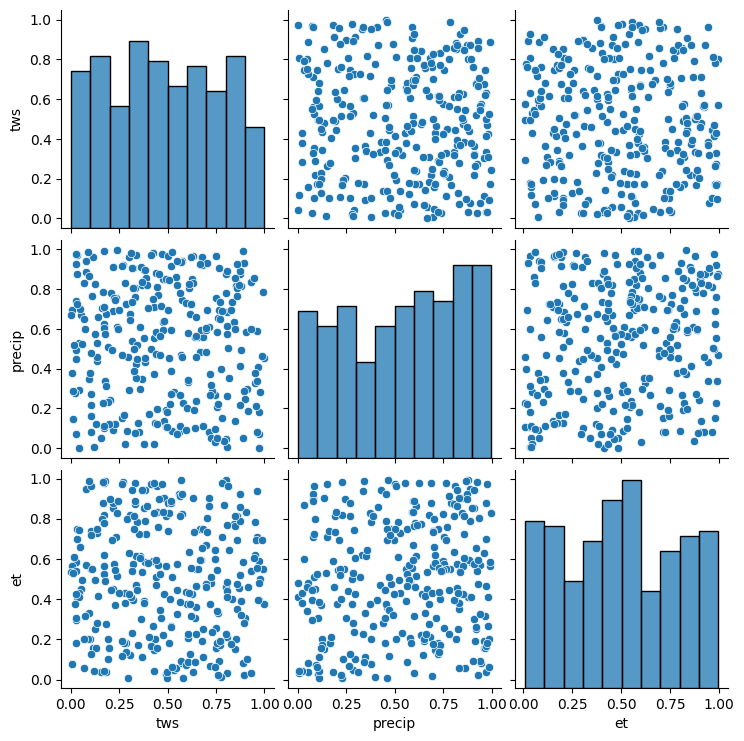

In [337]:
sns.pairplot(ran[:300])
plt.show()

In [176]:
# Example usage
first_subregion_id = list(subregion_datasets.keys())[0]
best_copula = lookup_best_copula(first_subregion_id)
new_drought_index = apply_best_copula(first_subregion_id)

Subregion 1.0:
Best Copula: Gaussian
Log-Likelihood: 62230.99
AIC: -124455.98
BIC: -124419.55
Parameters: [0.06915878 0.28476277 0.00718232]
Drought index recomputed for subregion 1.0 using GaussianCopula


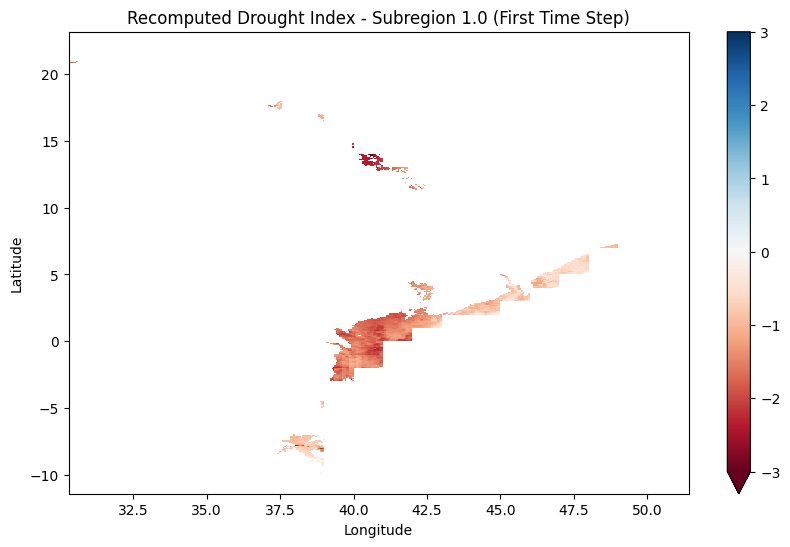

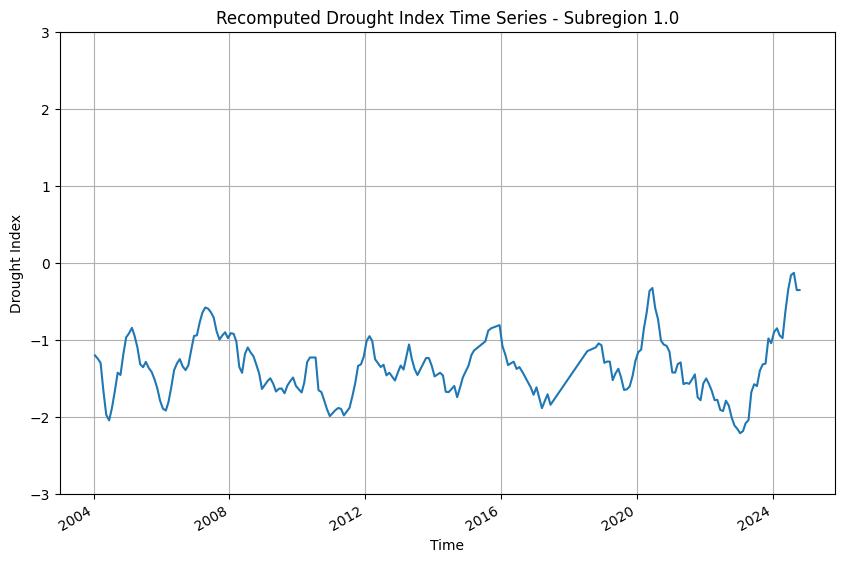

In [190]:
# Visualize
plt.figure(figsize=(10, 6))
new_drought_index.isel(time=1).plot(cmap='RdBu', vmin=-3, vmax=3)
plt.title(f"Recomputed Drought Index - Subregion {first_subregion_id} (First Time Step)")
plt.xlabel("Longitude")
plt.ylabel("Latitude")
plt.show()

plt.figure(figsize=(10, 6))
apply_ema(new_drought_index, span=6).mean(dim=['y', 'x']).plot()
plt.title(f"Recomputed Drought Index Time Series - Subregion {first_subregion_id}")
plt.xlabel("Time")
plt.ylabel("Drought Index")
plt.ylim(-3, 3)  # Set y-axis limits to -3 and 3
plt.grid(True)
plt.show()

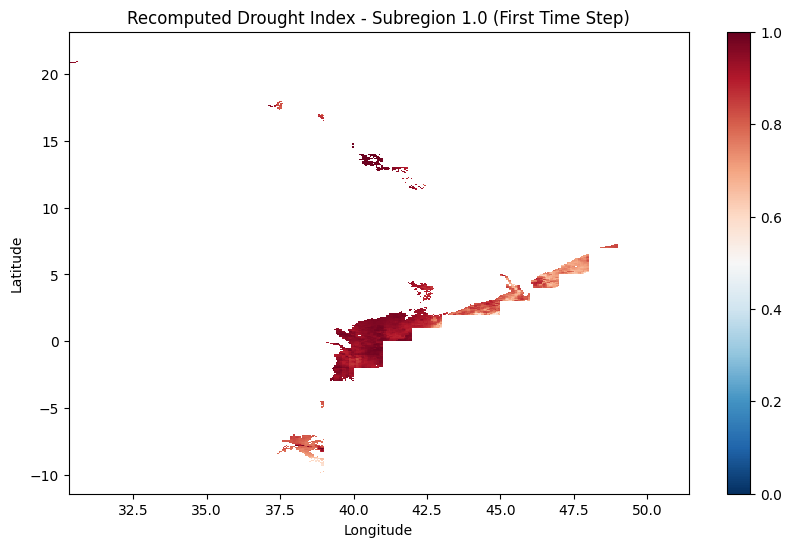

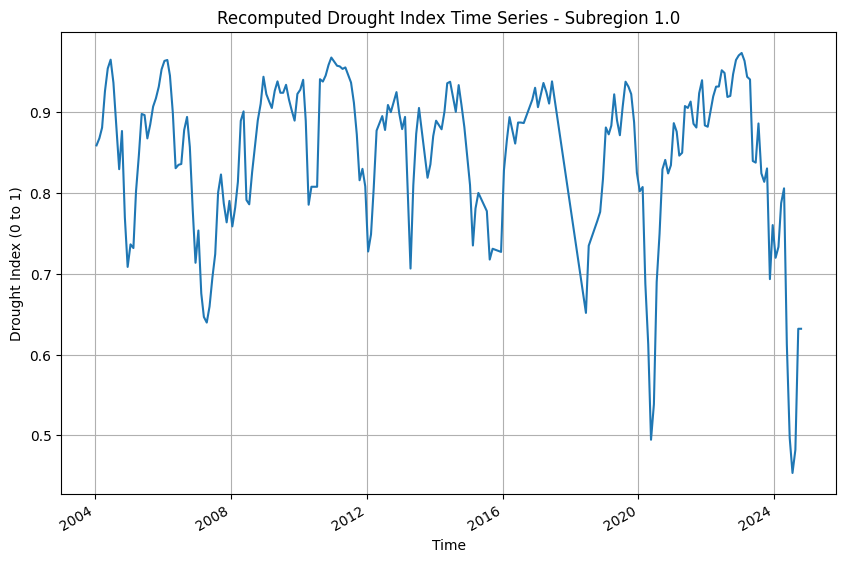

In [495]:
# Visualize
plt.figure(figsize=(10, 6))
new_drought_index.isel(time=1).plot(cmap='RdBu_r', vmin=0, vmax=1)
plt.title(f"Recomputed Drought Index - Subregion {first_subregion_id} (First Time Step)")
plt.xlabel("Longitude")
plt.ylabel("Latitude")
plt.show()

plt.figure(figsize=(10, 6))
apply_ema(new_drought_index, span=3).mean(dim=['y', 'x']).plot()
plt.title(f"Recomputed Drought Index Time Series - Subregion {first_subregion_id}")
plt.xlabel("Time")
plt.ylabel("Drought Index (0 to 1)")
plt.grid(True)
plt.show()

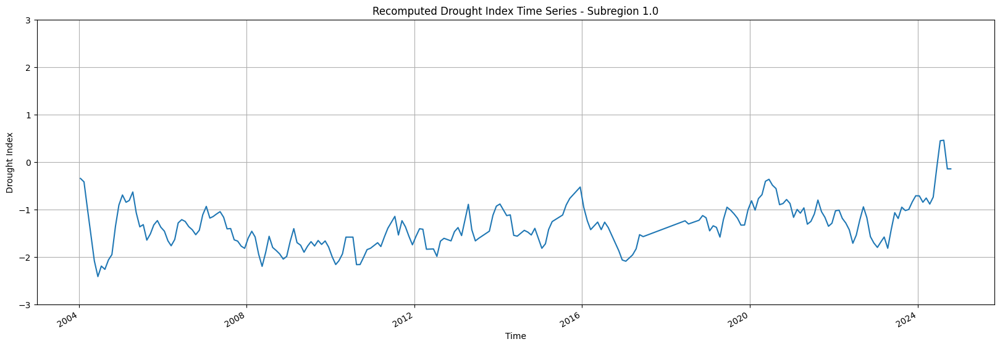

In [218]:
plt.figure(figsize=(20, 6))
apply_ema(new_drought_index, span=6).sel(y=5, x=47.5, method="nearest").plot()
plt.title(f"Recomputed Drought Index Time Series - Subregion {first_subregion_id}")
plt.xlabel("Time")
plt.ylabel("Drought Index")
plt.ylim(-3, 3)  # Set y-axis limits to -3 and 3
plt.grid(True)
plt.show()

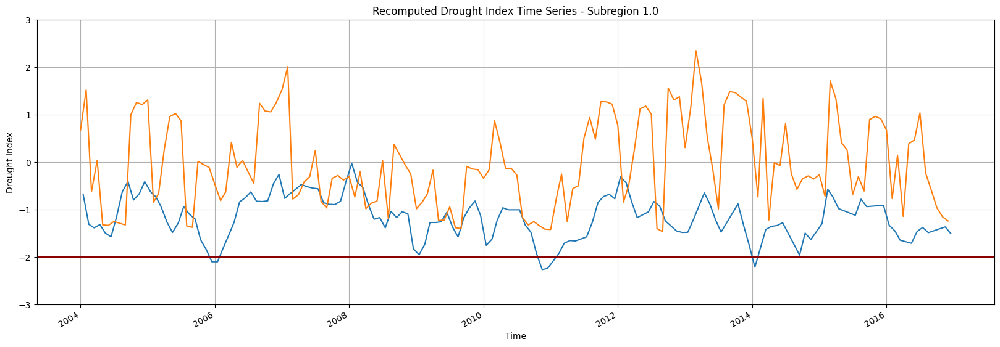

In [221]:
plt.figure(figsize=(20, 6))
apply_ema(new_drought_index.sel(time=slice('2004-01-01', '2016-12-31')), span=3).sel(y=0, x=40, method="nearest").plot(label="GHDI")
spei03.sel(lat=5, lon=47.5, method="nearest").plot(label="SPEI-03")
plt.title(f"Recomputed Drought Index Time Series - Subregion {first_subregion_id}")
plt.xlabel("Time")
plt.ylabel("Drought Index")
plt.ylim(-3, 3)  # Set y-axis limits to -3 and 3
plt.axhline(y=-2, color='darkred')
plt.grid(True)
plt.show()

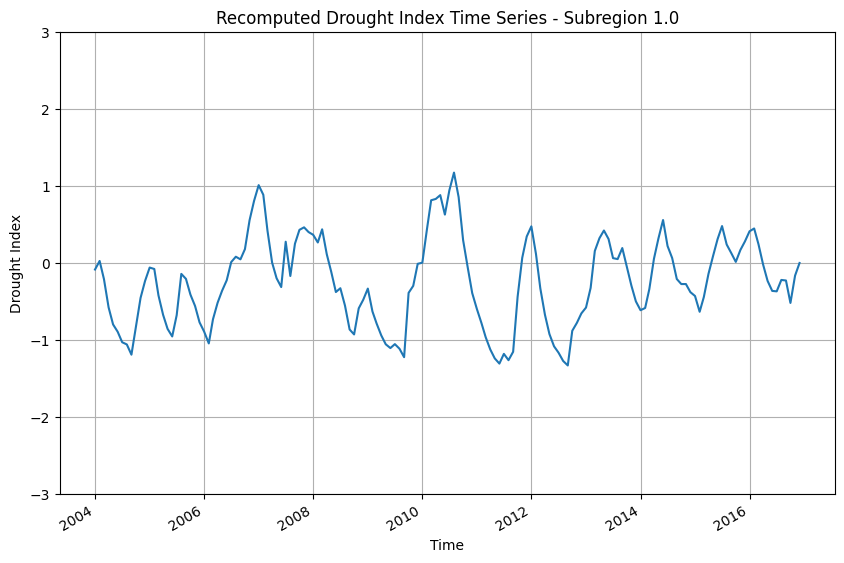

In [214]:
plt.figure(figsize=(10, 6))
# apply_ema(new_drought_index, span=6).sel(y=0, x=40, method="nearest").plot(label="GHDI")
apply_ema(spei03, span=6).sel(lat=0, lon=40, method="nearest").plot(label="SPEI-03")
plt.title(f"Recomputed Drought Index Time Series - Subregion {first_subregion_id}")
plt.xlabel("Time")
plt.ylabel("Drought Index")
plt.ylim(-3, 3)  # Set y-axis limits to -3 and 3
plt.grid(True)
plt.show()

In [202]:
spei03 = xr.open_dataset(os.path.join(dataset, 'validation_datasets/spei03.nc')).spei.sel(time=slice('2004-01-01', None))
spei03

<xarray.DataArray 'spei' (time: 156, lat: 1800, lon: 2080)>
[584064000 values with dtype=float32]
Coordinates:
  * lat      (lat) float32 47.97 47.92 47.88 47.83 ... -41.88 -41.92 -41.97
  * lon      (lon) float32 -27.98 -27.92 -27.88 -27.83 ... 75.88 75.93 75.97
  * time     (time) datetime64[ns] 2004-01-01 2004-02-01 ... 2016-12-01
Attributes:
    units:      z value
    long_name:  Standardized Precipitation Evapotranspiration Index

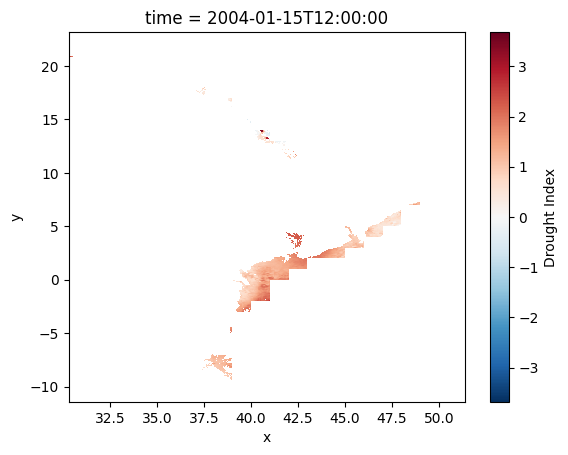

In [474]:
stand.isel(time=0).plot()

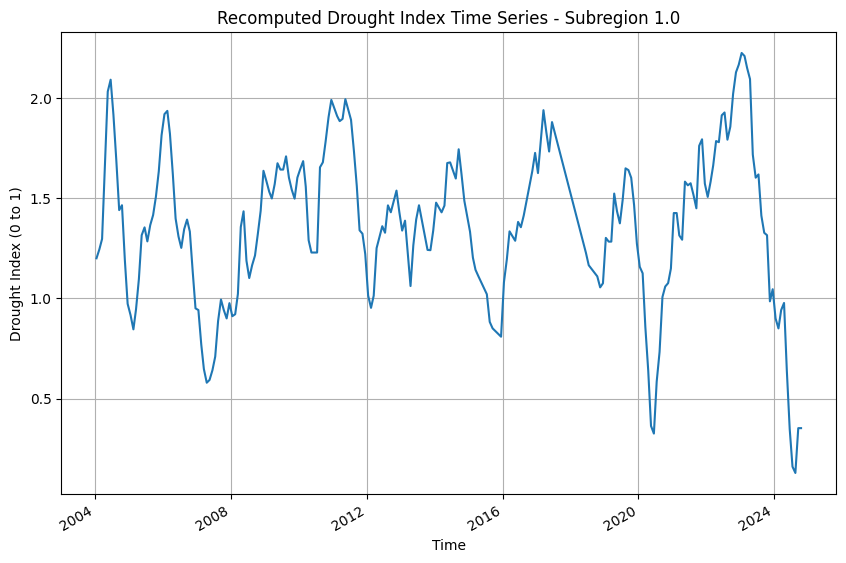

In [493]:
plt.figure(figsize=(10, 6))
apply_ema(stand, span=6).mean(dim=['y', 'x']).plot()
plt.title(f"Recomputed Drought Index Time Series - Subregion {first_subregion_id}")
plt.xlabel("Time")
plt.ylabel("Drought Index (0 to 1)")
plt.grid(True)
plt.show()

In [497]:
# Example usage
fteen_subregion_id = list(subregion_datasets.keys())[13]
best_copula_14 = lookup_best_copula(fteen_subregion_id)
new_drought_index_14 = apply_best_copula(fteen_subregion_id)

Subregion 14.0:
Best Copula: Gaussian
Log-Likelihood: 1115.14
AIC: -2224.28
BIC: -2190.98
Parameters: [-0.02276805 -0.04167455  0.04874515]
Drought index recomputed for subregion 14.0 using GaussianCopula


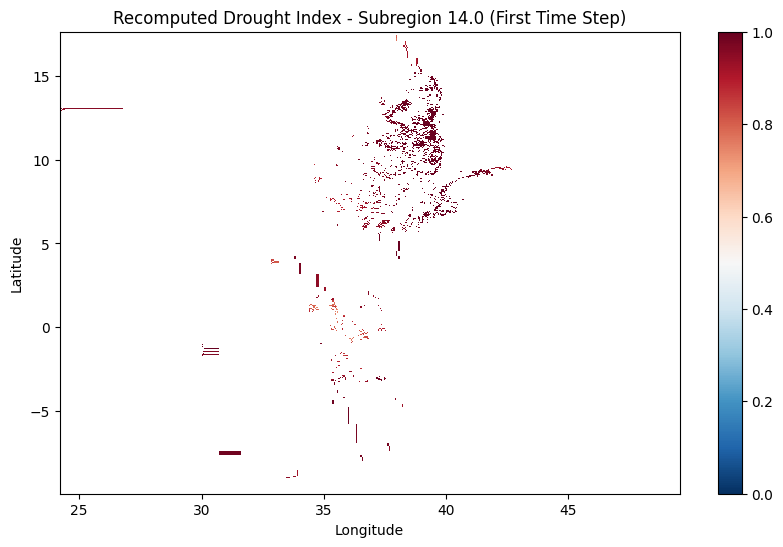

In [482]:
plt.figure(figsize=(10, 6))
new_drought_index_14.isel(time=1).plot(cmap='RdBu_r', vmin=0, vmax=1)
plt.title(f"Recomputed Drought Index - Subregion {fteen_subregion_id} (First Time Step)")
plt.xlabel("Longitude")
plt.ylabel("Latitude")
plt.show()

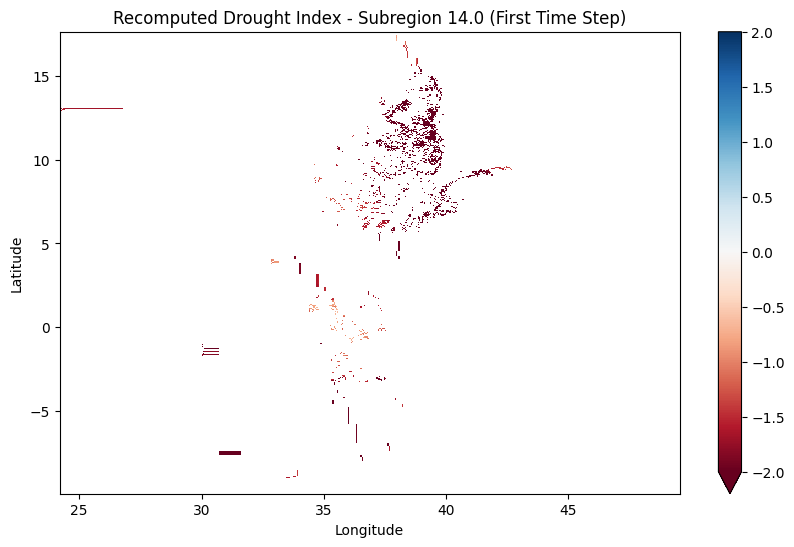

In [509]:
plt.figure(figsize=(10, 6))
new_drought_index_14.isel(time=1).plot(cmap='RdBu',  vmin=-2, vmax=2)
plt.title(f"Recomputed Drought Index - Subregion {fteen_subregion_id} (First Time Step)")
plt.xlabel("Longitude")
plt.ylabel("Latitude")
plt.show()

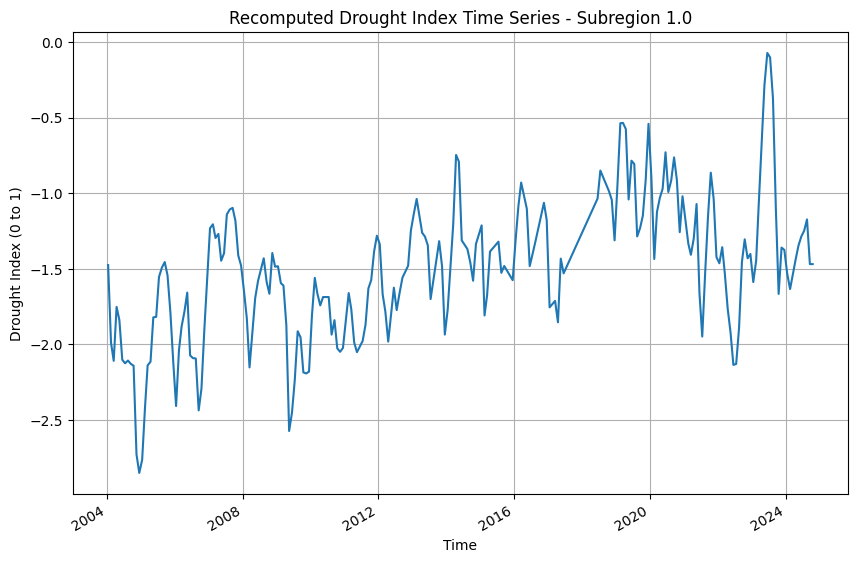

In [502]:
plt.figure(figsize=(10, 6))
apply_ema(new_drought_index_14, span=3).mean(dim=['y', 'x']).plot()
plt.title(f"Recomputed Drought Index Time Series - Subregion {first_subregion_id}")
plt.xlabel("Time")
plt.ylabel("Drought Index (0 to 1)")
plt.grid(True)
plt.show()

In [510]:
new = new_drought_index_14.combine_first(new_drought_index)

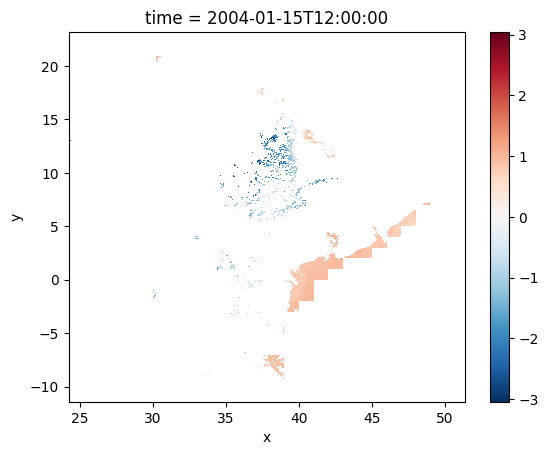

In [511]:
new.isel(time=0).plot()

In [516]:
drought_list = []
for subregion_id in subregion_datasets:
    drought_list.append(apply_best_copula(subregion_id))
    
drought_list

Drought index recomputed for subregion 1.0 using GaussianCopula
Drought index recomputed for subregion 2.0 using ClaytonCopula
Drought index recomputed for subregion 3.0 using GumbelCopula
Drought index recomputed for subregion 4.0 using GaussianCopula
Drought index recomputed for subregion 5.0 using GumbelCopula
Drought index recomputed for subregion 6.0 using GaussianCopula
Drought index recomputed for subregion 7.0 using GumbelCopula
Drought index recomputed for subregion 8.0 using GumbelCopula
Drought index recomputed for subregion 9.0 using GaussianCopula
Drought index recomputed for subregion 10.0 using GumbelCopula
Drought index recomputed for subregion 11.0 using GaussianCopula
Drought index recomputed for subregion 12.0 using GumbelCopula
Drought index recomputed for subregion 13.0 using ClaytonCopula
Drought index recomputed for subregion 14.0 using GaussianCopula
Drought index recomputed for subregion 15.0 using GaussianCopula


[<xarray.DataArray (time: 219, y: 671, x: 337)>
 array([[[nan, nan, nan, ..., nan, nan, nan],
         [nan, nan, nan, ..., nan, nan, nan],
         [nan, nan, nan, ..., nan, nan, nan],
         ...,
         [nan, nan, nan, ..., nan, nan, nan],
         [nan, nan, nan, ..., nan, nan, nan],
         [nan, nan, nan, ..., nan, nan, nan]],
 
        [[nan, nan, nan, ..., nan, nan, nan],
         [nan, nan, nan, ..., nan, nan, nan],
         [nan, nan, nan, ..., nan, nan, nan],
         ...,
         [nan, nan, nan, ..., nan, nan, nan],
         [nan, nan, nan, ..., nan, nan, nan],
         [nan, nan, nan, ..., nan, nan, nan]],
 
        [[nan, nan, nan, ..., nan, nan, nan],
         [nan, nan, nan, ..., nan, nan, nan],
         [nan, nan, nan, ..., nan, nan, nan],
         ...,
 ...
         ...,
         [nan, nan, nan, ..., nan, nan, nan],
         [nan, nan, nan, ..., nan, nan, nan],
         [nan, nan, nan, ..., nan, nan, nan]],
 
        [[nan, nan, nan, ..., nan, nan, nan],
        

In [224]:
drought_list = []
for subregion_id in subregion_datasets:
    drought_list.append(apply_best_copula(subregion_id))

Drought index recomputed for subregion 1.0 using GaussianCopula
Drought index recomputed for subregion 2.0 using ClaytonCopula
Drought index recomputed for subregion 3.0 using GumbelCopula
Drought index recomputed for subregion 4.0 using GaussianCopula
Drought index recomputed for subregion 5.0 using GumbelCopula
Drought index recomputed for subregion 6.0 using GaussianCopula
Drought index recomputed for subregion 7.0 using GumbelCopula
Drought index recomputed for subregion 8.0 using ClaytonCopula
Drought index recomputed for subregion 9.0 using GaussianCopula


In [257]:
on = drought_list[0].combine_first(drought_list[1])

In [269]:
on = on.combine_first(drought_list[8])

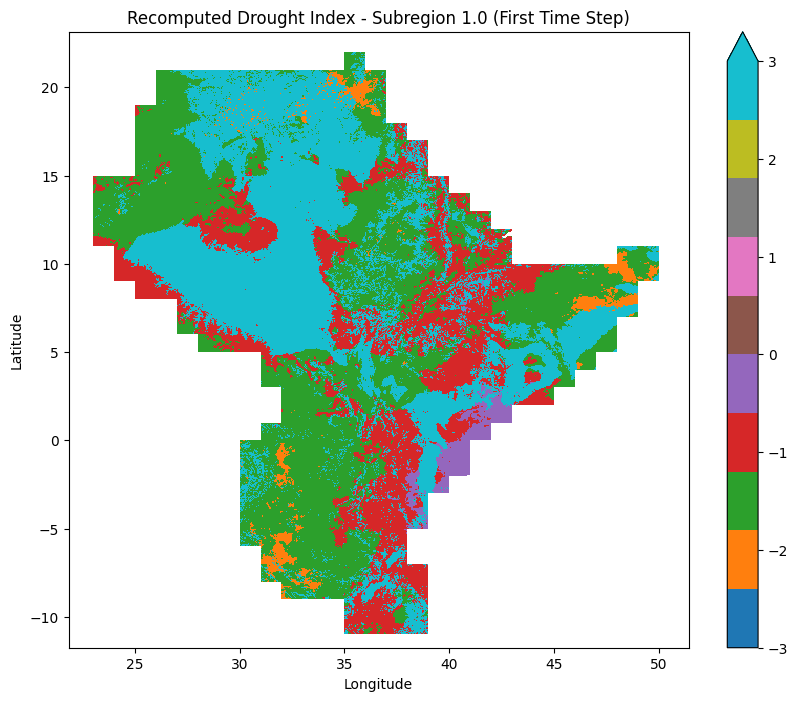

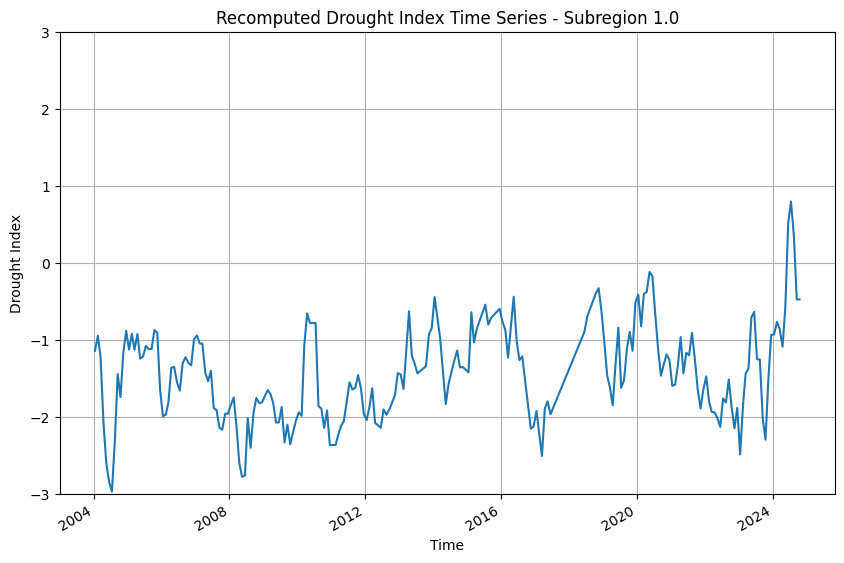

In [286]:
# Visualize
plt.figure(figsize=(10, 8))
on.sel(time=slice("2007-01-01", "2007-12-31")).mean(dim="time").plot(cmap='tab10', vmin=-3, vmax=3)
plt.title(f"Recomputed Drought Index - Subregion {first_subregion_id} (First Time Step)")
plt.xlabel("Longitude")
plt.ylabel("Latitude")
plt.show()

plt.figure(figsize=(10, 6))
apply_ema(on, span=3).sel(y=6, x=45, method="nearest").plot()
plt.title(f"Recomputed Drought Index Time Series - Subregion {first_subregion_id}")
plt.xlabel("Time")
plt.ylabel("Drought Index")
plt.ylim(-3, 3)  # Set y-axis limits to -3 and 3
plt.grid(True)
plt.show()

In [304]:
on.to_netcdf(os.path.join(dataset, 'results/ghdi.nc'))

In [485]:
full_ghdi

<xarray.Dataset>
Dimensions:      (time: 219, y: 698, x: 591)
Coordinates:
  * time         (time) datetime64[ns] 2004-01-15T12:00:00 ... 2024-10-15T12:...
    lat          (y) float64 23.12 23.07 23.02 22.97 ... -11.63 -11.68 -11.73
    lon          (x) float64 21.88 21.93 21.98 22.03 ... 51.23 51.28 51.33 51.38
    band         int64 1
  * y            (y) float64 23.12 23.07 23.02 22.97 ... -11.63 -11.68 -11.73
  * x            (x) float64 21.88 21.93 21.98 22.03 ... 51.23 51.28 51.33 51.38
    spatial_ref  int64 0
Data variables:
    tws          (y, x, time) float64 nan nan nan nan nan ... nan nan nan nan
    precip       (time, y, x) float64 nan nan nan nan nan ... nan nan nan nan
    et           (time, y, x) float64 nan nan nan nan nan ... nan nan nan nan
    landform     (y, x) float64 nan nan nan nan nan nan ... nan nan nan nan nan

#### Copula Analysis with copulae Module

In [136]:
# Function to test and select the best copula
def fit_best_copula(tws_cdf, precip_cdf, et_cdf):
    # Combine CDFs into a DataFrame (copulae expects a 2D array)
    data = np.vstack([tws_cdf, precip_cdf, et_cdf]).T
    data_df = pd.DataFrame(data, columns=['tws', 'precip', 'et'])
    
    # List of copulas to test
    copulas = {
        'Gaussian': GaussianCopula(dim=3),
        'Clayton': ClaytonCopula(dim=3),
        'Frank': FrankCopula(dim=3),
        'Gumbel': GumbelCopula(dim=3)
    }
    
    # Dictionary to store fit results
    fit_results = {}
    
    # Fit each copula and compute AIC
    for name, copula in copulas.items():
        try:
            copula.fit(data_df)
            log_likelihood = copula.log_lik(data_df)
            n_params = len(copula.params)  # Number of parameters in the copula
            aic = -2 * log_likelihood + 2 * n_params  # AIC formula
            fit_results[name] = {'copula': copula, 'aic': aic}
        except Exception as e:
            print(f"Error fitting {name} copula: {e}")
            fit_results[name] = {'copula': None, 'aic': np.inf}
    
    # Select the best copula (lowest AIC)
    best_copula_name = min(fit_results, key=lambda x: fit_results[x]['aic'])
    best_copula = fit_results[best_copula_name]['copula']
    print(f"Best copula for subregion: {best_copula_name} (AIC: {fit_results[best_copula_name]['aic']})")
    
    return best_copula

In [227]:
best_copulas

{1.0: <copulae.elliptical.gaussian.GaussianCopula at 0x7f8c6223cc10>,
 2.0: <copulae.archimedean.clayton.ClaytonCopula at 0x7f8c62406670>,
 3.0: <copulae.archimedean.gumbel.GumbelCopula at 0x7f8c622450d0>,
 4.0: <copulae.elliptical.gaussian.GaussianCopula at 0x7f8c6244afa0>,
 5.0: <copulae.archimedean.gumbel.GumbelCopula at 0x7f8c6228e0a0>,
 6.0: <copulae.elliptical.gaussian.GaussianCopula at 0x7f8c62217340>,
 7.0: <copulae.archimedean.gumbel.GumbelCopula at 0x7f8c622b12e0>,
 8.0: <copulae.archimedean.clayton.ClaytonCopula at 0x7f8c621dc7c0>,
 9.0: <copulae.elliptical.gaussian.GaussianCopula at 0x7f8c621dc400>}

In [134]:
# Function to compute drought index using the best copula
def compute_copula_index(ds):
    # Stack CDFs and drop NaNs
    stacked_data = xr.Dataset({
        'tws_cdf': ds['tws_cdf'],
        'precip_cdf': ds['precip_cdf'],
        'et_cdf': ds['et_cdf']
    }).stack(all_points=['time', 'y', 'x']).dropna(dim='all_points')
    
    # Extract CDF values
    tws_cdf = stacked_data['tws_cdf'].values
    precip_cdf = stacked_data['precip_cdf'].values
    et_cdf = stacked_data['et_cdf'].values
    
    # Fit the best copula
    best_copula = fit_best_copula(tws_cdf, precip_cdf, et_cdf)
    
    # Compute joint CDF using the best copula
    data_for_cdf = pd.DataFrame({
        'tws': tws_cdf,
        'precip': precip_cdf,
        'et': et_cdf
    })
    joint_cdf = best_copula.cdf(data_for_cdf)
    
    # Drought index: Invert joint CDF (higher values = worse drought)
    drought_index = 1 - joint_cdf
    
    # Reconstruct as DataArray
    return xr.DataArray(
        drought_index,
        coords={'all_points': stacked_data.coords['all_points']},
        dims=['all_points']
    ).unstack(), best_copula



In [137]:
# Apply to each subregion and store the best copula
best_copulas = {}  # To store the best copula for each subregion
for subregion_id, ds in subregion_datasets.items():
    ds['drought_index'], best_copula = compute_copula_index(ds)
    subregion_datasets[subregion_id] = ds
    best_copulas[subregion_id] = best_copula
    
    # Example output
    print(f"Subregion {subregion_id} drought index computed.")

# Example: Check drought index for the first subregion
print(subregion_datasets[first_subregion_id]['drought_index'])

                tws        precip            et
count  1.390176e+06  1.390176e+06  1.390176e+06
mean   5.000000e-01  5.000000e-01  5.000000e-01
std    2.886750e-01  2.886750e-01  2.886750e-01
min    7.193329e-07  7.193329e-07  7.193329e-07
25%    2.500004e-01  2.500004e-01  2.500004e-01
50%    5.000000e-01  5.000000e-01  5.000000e-01
75%    7.499996e-01  7.499996e-01  7.499996e-01
max    9.999993e-01  9.999993e-01  9.999993e-01
                tws        precip            et
count  1.390176e+06  1.390176e+06  1.390176e+06
mean   5.000000e-01  5.000000e-01  5.000000e-01
std    2.886750e-01  2.886750e-01  2.886750e-01
min    7.193329e-07  7.193329e-07  7.193329e-07
25%    2.500004e-01  2.500004e-01  2.500004e-01
50%    5.000000e-01  5.000000e-01  5.000000e-01
75%    7.499996e-01  7.499996e-01  7.499996e-01
max    9.999993e-01  9.999993e-01  9.999993e-01
Error fitting Clayton copula: object of type 'float' has no len()
                tws        precip            et
count  1.390176e+06  1

/home/jovyan/.local/lib/python3.8/site-packages/copulae/archimedean/gumbel.py:165: UserWarning: For the Gumbel copula, tau must be >= 0. Replacing negative values by 0.
  warnings.warn(warning_message)


                tws        precip            et
count  1.390176e+06  1.390176e+06  1.390176e+06
mean   5.000000e-01  5.000000e-01  5.000000e-01
std    2.886750e-01  2.886750e-01  2.886750e-01
min    7.193329e-07  7.193329e-07  7.193329e-07
25%    2.500004e-01  2.500004e-01  2.500004e-01
50%    5.000000e-01  5.000000e-01  5.000000e-01
75%    7.499996e-01  7.499996e-01  7.499996e-01
max    9.999993e-01  9.999993e-01  9.999993e-01


/home/jovyan/.local/lib/python3.8/site-packages/copulae/archimedean/gumbel.py:211: FutureWarning: Support for multi-dimensional indexing (e.g. `obj[:, None]`) is deprecated and will be removed in a future version.  Convert to a numpy array before indexing instead.
  ln = offset + np.log(np.exp(lip - offset[:, None]).sum(1))


Error fitting Gumbel copula: object of type 'float' has no len()
Best copula for subregion: Gaussian (AIC: -124455.97989720064)


IOStream.flush timed out


Subregion 1.0 drought index computed.
                tws        precip            et
count  1.183291e+07  1.183291e+07  1.183291e+07
mean   5.000000e-01  5.000000e-01  5.000000e-01
std    2.886751e-01  2.886751e-01  2.886751e-01
min    8.451004e-08  8.451004e-08  8.451004e-08
25%    2.500000e-01  2.500000e-01  2.500000e-01
50%    5.000000e-01  5.000000e-01  5.000000e-01
75%    7.500000e-01  7.500000e-01  7.500000e-01
max    9.999999e-01  9.999999e-01  9.999999e-01
                tws        precip            et
count  1.183291e+07  1.183291e+07  1.183291e+07
mean   5.000000e-01  5.000000e-01  5.000000e-01
std    2.886751e-01  2.886751e-01  2.886751e-01
min    8.451004e-08  8.451004e-08  8.451004e-08
25%    2.500000e-01  2.500000e-01  2.500000e-01
50%    5.000000e-01  5.000000e-01  5.000000e-01
75%    7.500000e-01  7.500000e-01  7.500000e-01
max    9.999999e-01  9.999999e-01  9.999999e-01
Error fitting Clayton copula: object of type 'float' has no len()



KeyboardInterrupt



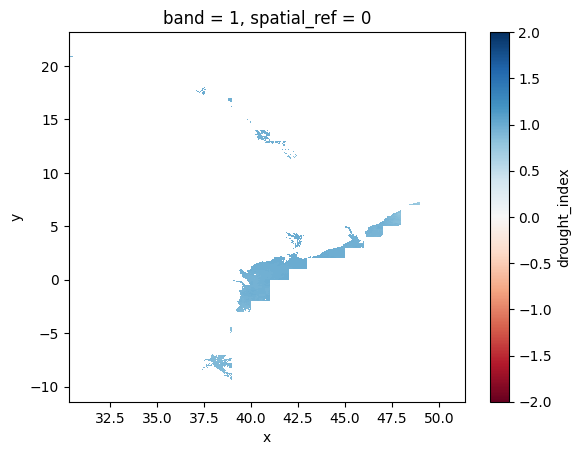

In [142]:
subregion_datasets[first_subregion_id]['drought_index'].sel(time=slice("2011-01-01", "2011-05-31")).mean(dim="time").plot(
    robust=True, cmap="RdBu", vmin=-2, vmax=2)

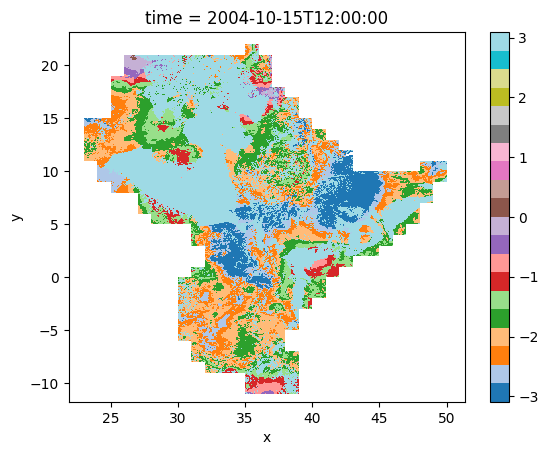

In [358]:
on.isel(time=9).plot(cmap='tab20')

In [350]:
# Example drought index (replace with your actual data)
dates = pd.date_range(start='2004-01-01', end='2023-01-01', freq='M')
drought_index = pd.Series(np.random.uniform(0, 1, len(dates)), index=dates)

In [351]:
drought_threshold = 0.4  # From your example for moderate drought
min_duration_months = 3  # Minimum duration for a drought event
recovery_period_months = 1  # Minimum period to confirm recovery

In [353]:
drought_events = []
in_drought = False
start_idx = None
current_run = []

for i, value in enumerate(on):
    if value < drought_threshold and not in_drought:
        start_idx = i
        in_drought = True
        current_run = [value]
    elif value < drought_threshold and in_drought:
        current_run.append(value)
    elif value >= drought_threshold and in_drought:
        # Check if the run meets the minimum duration
        if len(current_run) >= min_duration:
            # Calculate run sum (severity as cumulative deficit)
            run_sum = np.sum(drought_threshold - np.array(current_run))
            # Check recovery period
            if i + recovery_period <= len(drought_index):
                end_check = drought_index[i:i + recovery_period]
                if all(end_check >= drought_threshold):
                    end_idx = i - 1  # End of the drought run
                    drought_events.append({
                        'Start_Index': start_idx,
                        'End_Index': end_idx,
                        'Duration': len(current_run),  # In time steps
                        'Severity': run_sum  # Cumulative deficit
                    })
        in_drought = False
        current_run = []

# Convert to DataFrame for easier analysis
import pandas as pd
drought_df = pd.DataFrame(drought_events)
print(drought_df)

ValueError: The truth value of an array with more than one element is ambiguous. Use a.any() or a.all()

In [17]:
ghdi = (os.path.join(dataset, 'results/ghdi.nc'))
ghdi

'../../datasets/results/ghdi.nc'